In [34]:
import gymnasium as gym
import numpy as np
import random
import math
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from matplotlib.animation import FuncAnimation
from gymnasium import Env
import pandas as pd

MAX_MISSILES = 15

class Point:
    def __init__(self, type):
        self.type = type
        self.coordinates = np.array([0, 0])
        self.radius = 0.2

    def create_target(self):
        x = random.uniform(-3.0, 3.0)
        y = random.uniform(-2.0, 2.0)
        self.coordinates = np.array([x, y])
        self.theta = 0 
        return self.coordinates, self.theta 

    def create_defense(self, target):
        x = random.uniform((target.coordinates[0] - self.radius) - 1.5, (target.coordinates[0] + self.radius) + 1.5)
        y = random.uniform((target.coordinates[1] - self.radius) - 1.5, (target.coordinates[1] + self.radius) + 1.5)
        self.coordinates = np.array([x, y])
        return self.coordinates

    def create_attack(self, target):
        x_side_left = random.uniform(-9.5, (target.coordinates[0] - self.radius) - 2)
        x_side_right = random.uniform((target.coordinates[0] + self.radius) + 2, 9.5)
        y_below = random.uniform((target.coordinates[1] - self.radius) - 2, -9.5)
        y_above = random.uniform((target.coordinates[1] + self.radius) + 2, 9.5)
        x_inclusive = random.uniform(-9.5, 9.5)
        y_inclusive = random.uniform(-9.5, 9.5)
        y_below_x_inclusive = np.array([x_inclusive, y_below])
        y_above_x_inclusive = np.array([x_inclusive, y_above])
        x_left_y_inclusive = np.array([x_side_left, y_inclusive])
        x_right_y_inclusive = np.array([x_side_right, y_inclusive])

        self.coordinates = random.choice([y_below_x_inclusive, y_above_x_inclusive, x_left_y_inclusive, x_right_y_inclusive])

        self.AT_abs_length = math.hypot(self.coordinates[0] - target.coordinates[0], self.coordinates[1] - target.coordinates[1])
        self.length_adjacent_r = abs(target.coordinates[0] - self.coordinates[0])
        self.attack_theta_rad = math.acos(self.length_adjacent_r / self.AT_abs_length)

        if self.coordinates[0] < target.coordinates[0]:
            if self.coordinates[1] < target.coordinates[1]:
                self.attack_theta_rad = self.attack_theta_rad
            else:
                self.attack_theta_rad = ((2 * math.pi) - self.attack_theta_rad)

        else:
            if self.coordinates[1] < target.coordinates[1]:
                self.attack_theta_rad = ((math.pi) - self.attack_theta_rad)
            else:
                self.attack_theta_rad = ((math.pi) + self.attack_theta_rad)

        return self.coordinates, self.attack_theta_rad

class Missile:
    def __init__(self, type):
        self.type = type
        self.coordinates = np.array([0, 0])
        self.radius = 0.2 

    def fire_attack_missile(self, attack):
        self.speed = 1
        self.theta = attack.attack_theta_rad
        self.coordinates = attack.coordinates
        self.fired = True

        return self.coordinates, self.theta, self.speed, self.fired

    def create_defense_missile(self, defense, theta):
        self.speed = 1
        self.theta = theta
        self.coordinates = defense.coordinates
        self.fired = False
        self.fired_time = 0
        self.defense_missile_to_attack_missile = None
        self.start_distance = None
        

    def fire_defense_missile(self, global_time):
        self.fired = True
        self.fired_time = global_time
        self.initial_position = np.array([self.coordinates[0], self.coordinates[1]])
        return self.fired, self.fired_time

class Environment(Env):
    def __init__(self):
        self.action_space = gym.spaces.Box(
            low=np.array([0, 0]),
            high=np.array([1, 2*math.pi]),
            dtype=np.float32
        )

        # Observation space
        base_low = np.array([0, -30000, -3, -2, -4.7, -4.7, -10, -10, -10, -10, 0, -2])
        base_high = np.array([10000, 30000, 3, 2, 4.7, 4.7, 10, 10, 10, 10, 2*np.pi, 30])
        missile_low = np.array([-9999, -9999, -9999, -9999, -9999, -9999, -9999, -9999])
        missile_high = np.array([1, 10, 10, 2*np.pi, 10000, 10000, 30, 30])

        missile_low = np.tile(missile_low, MAX_MISSILES)
        missile_high = np.tile(missile_high, MAX_MISSILES)

        low = np.concatenate((base_low, missile_low))
        high = np.concatenate((base_high, missile_high))

        self.observation_space = gym.spaces.Box(low=low, high=high, dtype=np.float32)

        self.global_time = 0
        self.reward = 0
        self.done = False

        self.target = None
        self.defense = None
        self.attack = None
        self.attack_missile = None
        self.initial_defense_missile = None
        self.defense_missiles = []
        self.fired_defense_missiles = []
        self.attack_missile_to_target = None

        self.attack_missile_to_target_t_minus_one = None
        self.defense_missile_to_attack_missile_t_minus_one = []

        self.reward_history = []

    def reset(self, seed=None, options=None):
        if seed is not None:
          np.random.seed(seed)
          random.seed(seed)

        self.reward = 0
        self.target = Point('target')
        self.defense = Point('defense')
        self.attack = Point('attack')

        self.target.create_target()
        self.defense.create_defense(self.target)
        self.attack.create_attack(self.target)

        self.attack_missile = Missile('attack')
        self.attack_missile.fire_attack_missile(self.attack)
        self.attack_missile_to_target = self.distance_attack_to_target(self.attack_missile)

        self.fired_defense_missiles = []

        self.initial_defense_missile = Missile('defense')
        self.initial_defense_missile.create_defense_missile(self.defense, 0) 

        self.global_time = 0
        self.reward = 0

        self.attack_missile_to_target_t_minus_one = None
        self.defense_missile_to_attack_missile_t_minus_one = []

        self.reward_history = []
        self.state_history = []
        self.step_count = 0

        state = self.get_state()
        return state, {}

    def local_create_defense_missile(self, defense, theta):
        defense_missile = Missile('defense')
        defense_missile.create_defense_missile(defense, theta)
        return defense_missile

    def local_fire_defense_missile(self, defense_missile):
        defense_missile.fire_defense_missile(self.global_time)
        defense_missile.start_distance = self.indv_distance_defense_to_attack(defense_missile, self.attack_missile)
        self.fired_defense_missiles.append(defense_missile)
        return defense_missile

    def calculate_distance(self, point1, point2):
        return math.hypot(point1[0] - point2[0], point1[1] - point2[1])

    def distance_attack_to_target(self, attack_missile):
        self.attack_missile_to_target = (self.calculate_distance(attack_missile.coordinates, self.target.coordinates) - (attack_missile.radius + self.target.radius))

        if self.attack_missile_to_target > 0:
            self.reward += (-2 * (1 / self.attack_missile_to_target))

        return self.attack_missile_to_target

    def indv_distance_defense_to_attack(self, missile, attack_missile):
        missile.defense_missile_to_attack_missile = (self.calculate_distance(missile.coordinates, attack_missile.coordinates) - (missile.radius + attack_missile.radius))
        return missile.defense_missile_to_attack_missile

    def distance_defense_to_attack(self, attack_missile):
        for missile in self.fired_defense_missiles:
            missile.defense_missile_to_attack_missile = (self.calculate_distance(missile.coordinates, attack_missile.coordinates) - (missile.radius + attack_missile.radius))

    def update_attack_missile_position(self, attack_missile):
        new_coordx = self.attack.coordinates[0] + self.attack_missile.speed * self.global_time * math.cos(self.attack_missile.theta)
        new_coordy = self.attack.coordinates[1] + self.attack_missile.speed * self.global_time * math.sin(self.attack_missile.theta)
        attack_missile.coordinates = np.array([new_coordx, new_coordy])
        self.attack_missile.coordinates = np.array([new_coordx, new_coordy])

    def update_defense_missile_positions(self):
        for missile in self.fired_defense_missiles:
            new_coordx = missile.initial_position[0] + missile.speed * (self.global_time - missile.fired_time) * math.cos(missile.theta)
            new_coordy = missile.initial_position[1] + missile.speed * (self.global_time - missile.fired_time) * math.sin(missile.theta)
            missile.coordinates = np.array([new_coordx, new_coordy])

    def distance_reward(self):
        if len(self.fired_defense_missiles) > 0:
            attack_missile_change = ((self.attack_missile_to_target - self.attack_missile_to_target_t_minus_one) / 0.2)

            for i, missile in enumerate(self.fired_defense_missiles):
                try:
                    defense_missile_change = ((missile.defense_missile_to_attack_missile -  self.defense_missile_to_attack_missile_t_minus_one[i]) / 0.2)
                    diff = (defense_missile_change - attack_missile_change)

                    if diff > 0:
                        self.reward += (-1 * (0.2 * ((10 * (diff**2))) * (1 + 0.001*(missile.defense_missile_to_attack_missile**2))))
                    else:
                        self.reward += (0.4 * (10 * (diff**2) * (1 + (1/missile.defense_missile_to_attack_missile))))

                except IndexError:
                    defense_missile_change = 0
                
        else:
            self.reward = self.reward

    def check_impact(self):
        if self.attack_missile_to_target < 0:
            return -1000, True

        for missile in self.fired_defense_missiles:
            if missile.defense_missile_to_attack_missile < 0:
                return 1000, True

        else:
            return 0, False

    def get_state(self):

        if len(self.fired_defense_missiles) > 15:
            self.fired_defense_missiles = self.fired_defense_missiles[:15]

        base_state = np.array(
            [
                self.global_time,
                self.reward,
                self.target.coordinates[0],
                self.target.coordinates[1],
                self.defense.coordinates[0],
                self.defense.coordinates[1],
                self.attack.coordinates[0],
                self.attack.coordinates[1],
                self.attack_missile.coordinates[0],
                self.attack_missile.coordinates[1],
                self.attack_missile.theta,
                self.attack_missile_to_target
            ]
        )

        for missile in self.fired_defense_missiles:
            fired_missile_state = np.array(
                [
                    1,
                    missile.coordinates[0],
                    missile.coordinates[1],
                    missile.theta,
                    missile.fired_time,
                    self.global_time - missile.fired_time,
                    missile.start_distance,
                    missile.defense_missile_to_attack_missile
                    # missile.reward_diff
                ]
            )

            base_state = np.concatenate((base_state, fired_missile_state))

        empty_missile = np.array([
            -9999,
            -9999,
            -9999,
            -9999,
            -9999,
            -9999,
            -9999,
            -9999
        ])

        # Padding for consistency
        missiles_to_add = MAX_MISSILES - len(self.fired_defense_missiles)
        if missiles_to_add > 0:
            empty_missiles = np.tile(empty_missile, (missiles_to_add, 1)).flatten()
            base_state = np.concatenate((base_state, empty_missiles))

        return base_state

    def get_state_dict(self):
        if len(self.fired_defense_missiles) > 15:
            self.fired_defense_missiles = self.fired_defense_missiles[:15]

        base_state = {
                "global_time": self.global_time,
                "reward": self.reward,
                "target_x": self.target.coordinates[0],
                "target_y": self.target.coordinates[1],
                "defense_x": self.defense.coordinates[0],
                "defense_y": self.defense.coordinates[1],
                "attack_x": self.attack.coordinates[0],
                "attack_y": self.attack.coordinates[1],
                "attack_missile_x": self.attack_missile.coordinates[0],
                "attack_missile_y": self.attack_missile.coordinates[1],
                "attack_missile_theta": self.attack_missile.theta,
                "attack_missile_to_target": self.attack_missile_to_target,
                "fired_missiles": {},
                "unfired_missiles": {}
            }
        
        i = 1

        for missile in self.fired_defense_missiles:
            fired_missile_state = {
                "missile_code": i,
                "missile_exists": 1,
                "missile_x": missile.coordinates[0],
                "missile_y": missile.coordinates[1],
                "missile_theta": missile.theta,
                "missile_fired_time": missile.fired_time,
                "missile_time_elapsed": self.global_time - missile.fired_time,
                "missile_start_distance": missile.start_distance,
                "missile_defense_to_attack": missile.defense_missile_to_attack_missile,
            }

            base_state["fired_missiles"][f"missile_{i}"] = fired_missile_state
            i += 1

        missiles_to_add = MAX_MISSILES - len(self.fired_defense_missiles)
        for j in range(1, missiles_to_add + 1):
            unfired_missile_state = {
                "missile_code": i,
                "missile_exists": 0,
                "missile_x": None,
                "missile_y": None,
                "missile_theta": None,
                "missile_fired_time": None,
                "missile_time_elapsed": None,
                "missile_start_distance": None,
                "missile_defense_to_attack": None,
            }
            base_state["unfired_missiles"][f"missile_{i}"] = unfired_missile_state
            i += 1

        return base_state

    def step(self, action):
        fire_prob, theta = action
        fire = fire_prob > 0.5
        print("ACTION:", action)

        self.attack_missile_to_target_t_minus_one = self.attack_missile_to_target
        self.defense_missile_to_attack_missile_t_minus_one = [missile.defense_missile_to_attack_missile for missile in self.fired_defense_missiles]

        self.update_attack_missile_position(self.attack_missile)
        self.distance_attack_to_target(self.attack_missile)

        if len(self.fired_defense_missiles) > 0:
            self.update_defense_missile_positions()
            self.distance_defense_to_attack(self.attack_missile)

        if fire and len(self.defense_missiles) < MAX_MISSILES:
            defense_missile = self.local_create_defense_missile(self.defense, theta)
            self.local_fire_defense_missile(defense_missile)

        self.distance_reward()

        impact_reward, self.done = self.check_impact()

        self.reward += impact_reward

        self.global_time += 0.2

        state = self.get_state()
        self.reward_history.append(self.reward)

        self.render()
        # self.plot_rewards()

        # state_dict = self.get_state_dict()

        self.step_count += 1
        # self.state_history.append(state_dict)
        # df = pd.DataFrame(self.state_history)

        # df.index = [f"step{i+1}" for i in range(len(self.state_history))]

        # print(df)
        # print(state_dict)
        # print(df["attack_missile_to_target"])

        truncated = False

        return state, self.reward, self.done, truncated, {}
    
    def plot_rewards(self, title="Episode Reward Over Time"):
        plt.figure(figsize=(10, 5))
        plt.plot(self.reward_history, marker='o', linestyle='-', markersize=5)
        plt.title(title)
        plt.xlabel("Step")
        plt.ylabel("Reward")
        plt.grid(True)
        plt.show()

    def render(self):
        fig, ax = plt.subplots()
        plt.xlim(-10, 10)
        plt.ylim(-10, 10)

        plt.axhline(0, color='black', linewidth=0.5)
        plt.axhline(0, color='black', linewidth=0.5)
        plt.grid(True)

        target = Circle((self.target.coordinates[0], self.target.coordinates[1]), self.target.radius, edgecolor='red', facecolor='none', linewidth=2)
        attack_missile = Circle((self.attack_missile.coordinates[0], self.attack_missile.coordinates[1]), self.attack_missile.radius, edgecolor='black', facecolor='none', linewidth=2)
        plt.scatter(self.defense.coordinates[0], self.defense.coordinates[1], color='blue')
        plt.scatter(self.attack.coordinates[0], self.attack.coordinates[1], color='black')

        ax.add_artist(target)
        ax.add_artist(attack_missile)

        for missile in self.fired_defense_missiles:
            missile = Circle((missile.coordinates[0], missile.coordinates[1]), missile.radius, edgecolor='blue', facecolor='none', linewidth=2)
            ax.add_artist(missile)

        ax.set_aspect('equal')
        plt.show()


Using cpu device
ACTION: [0.8298892 0.9338018]


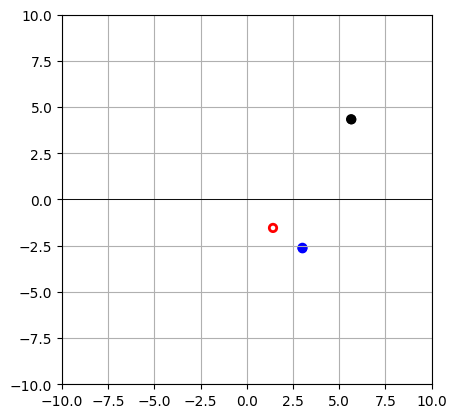

ACTION: [1. 0.]


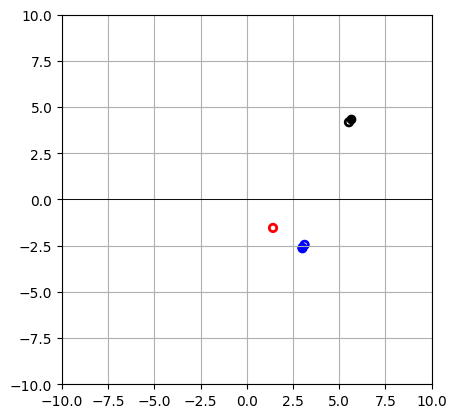

ACTION: [0.03042619 2.1655924 ]


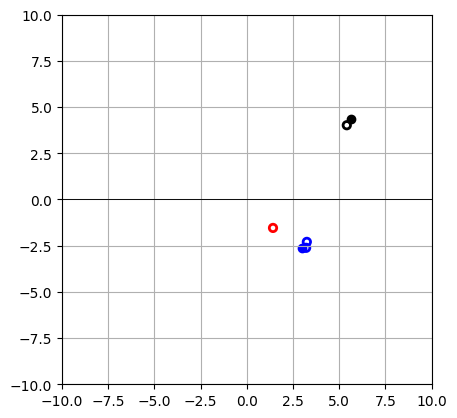

ACTION: [0.         0.11814339]


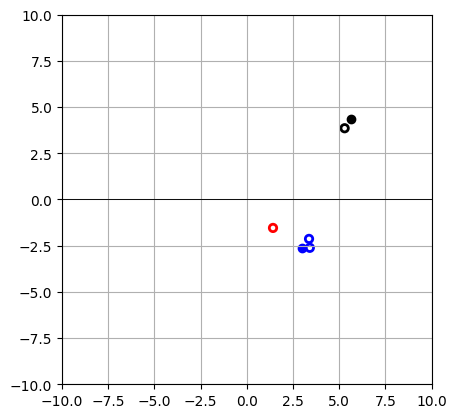

ACTION: [0.10669854 0.        ]


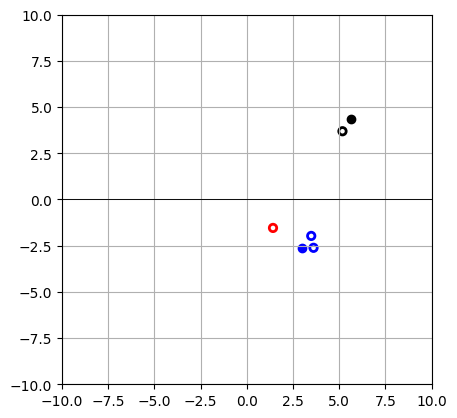

ACTION: [0.         0.30170926]


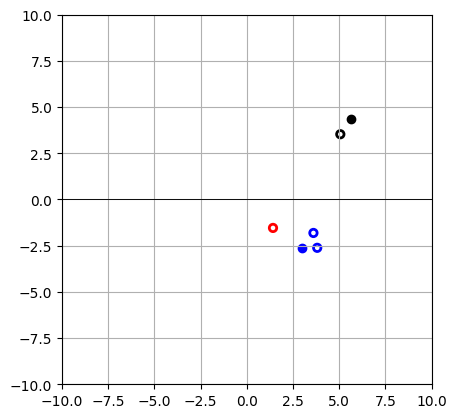

ACTION: [0.20961761 0.        ]


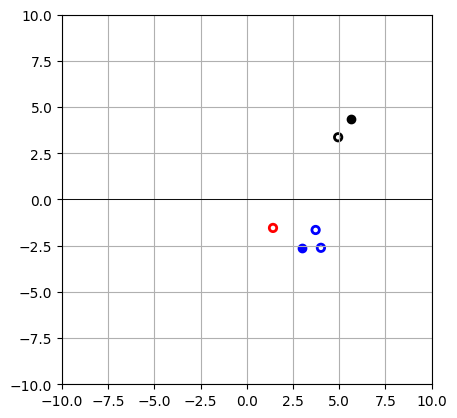

ACTION: [0.        0.3886849]


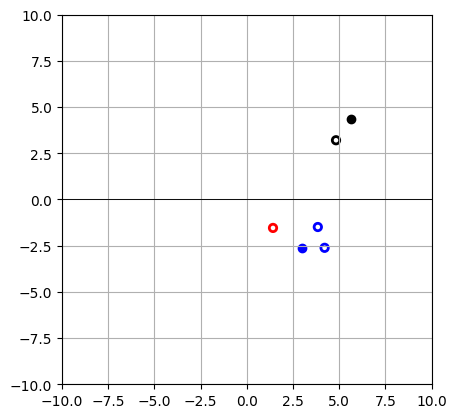

ACTION: [0.7753628  0.38770786]


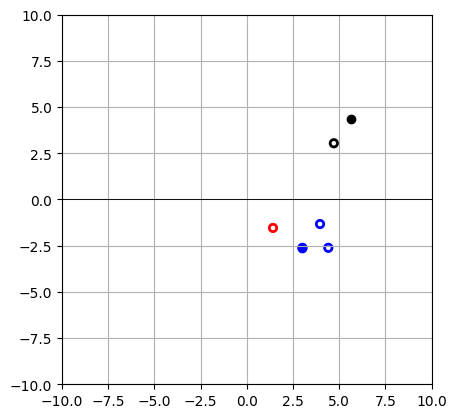

ACTION: [0.        2.1480908]


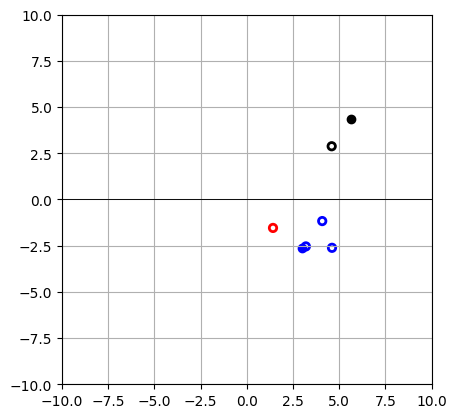

ACTION: [0. 0.]


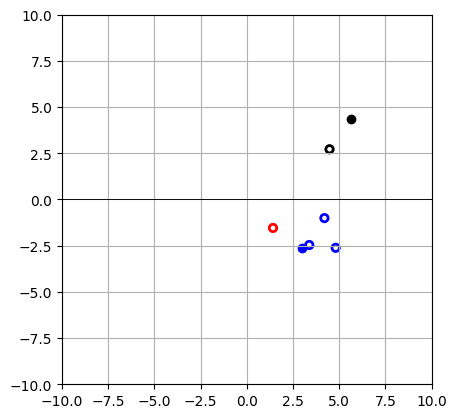

ACTION: [0.        1.9292488]


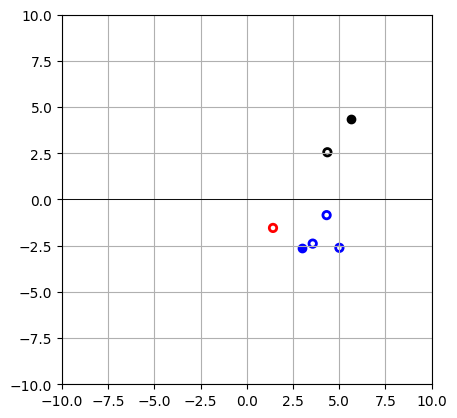

ACTION: [0.        1.5641075]


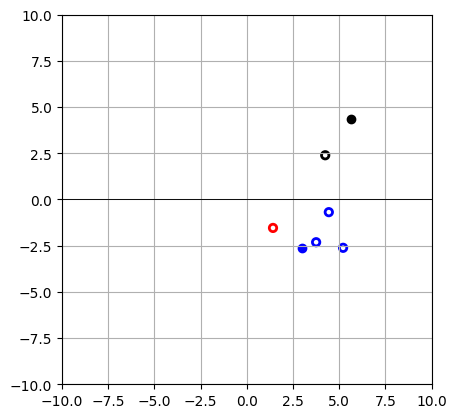

ACTION: [1. 0.]


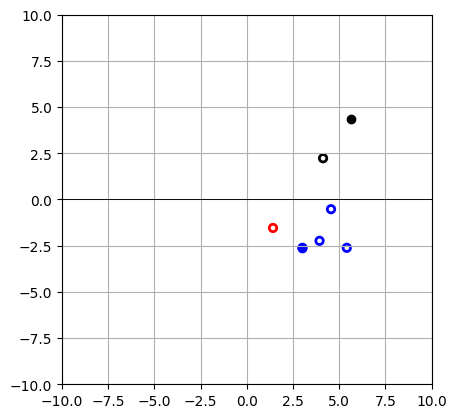

ACTION: [0. 0.]


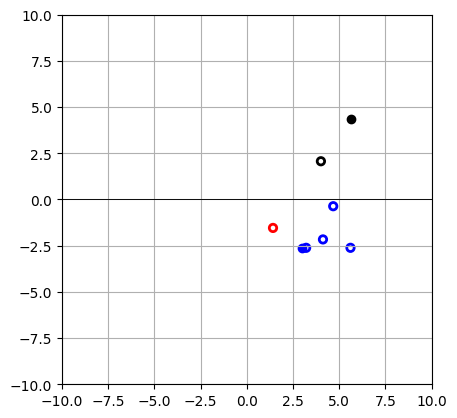

ACTION: [0.37679848 0.        ]


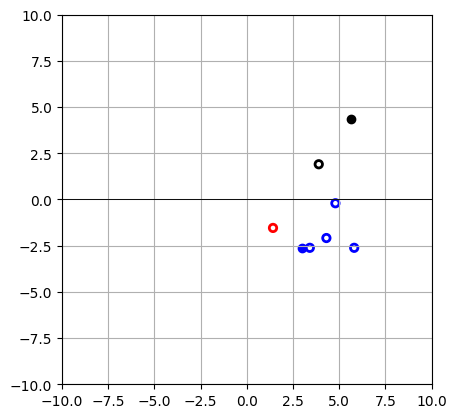

ACTION: [0.9328525  0.16830538]


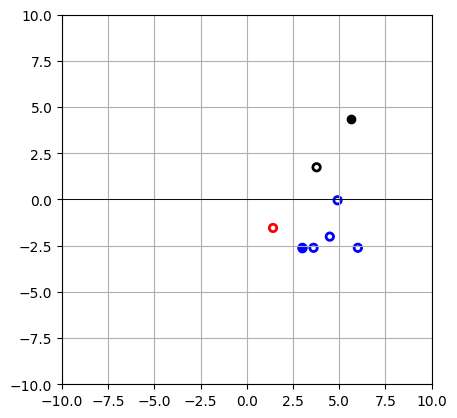

ACTION: [1. 0.]


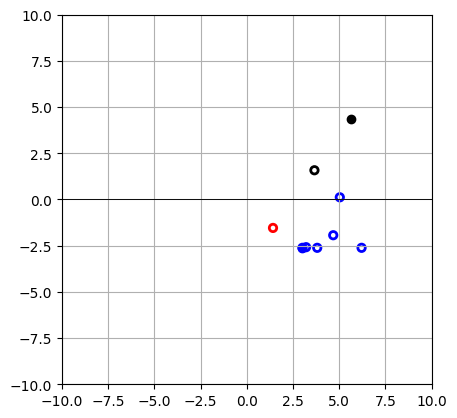

ACTION: [1.        1.2246246]


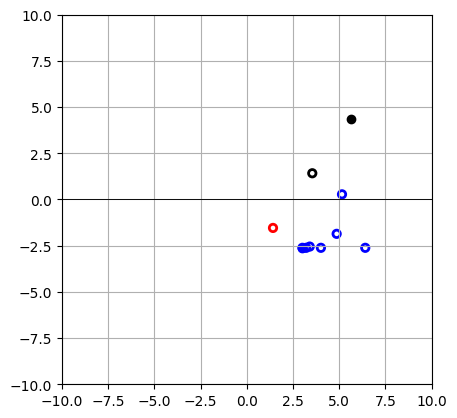

ACTION: [0.        2.2079952]


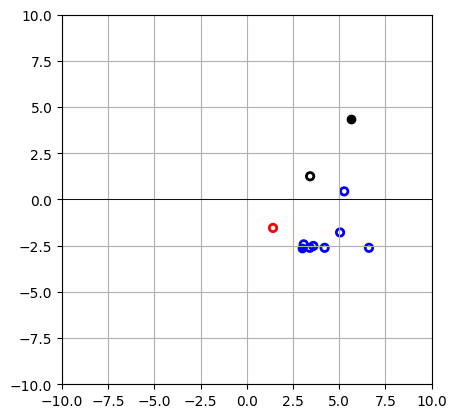

ACTION: [0.         0.52313334]


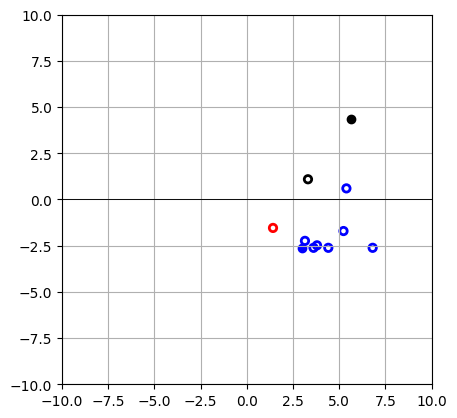

ACTION: [0.5599071 1.4046217]


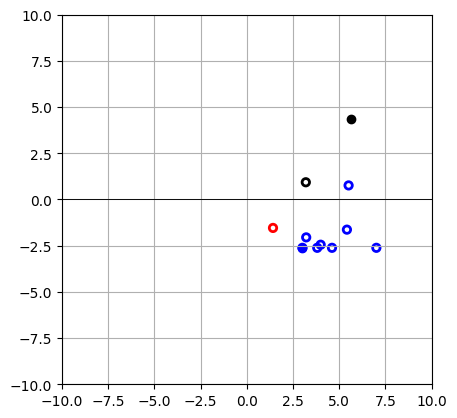

ACTION: [0. 0.]


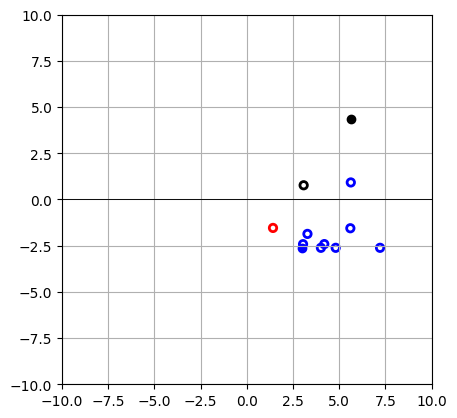

ACTION: [1.        1.1471193]


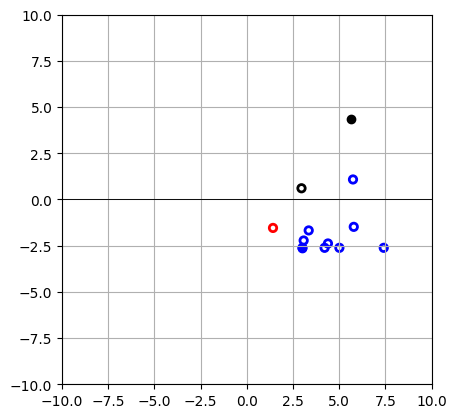

ACTION: [0.        0.6898441]


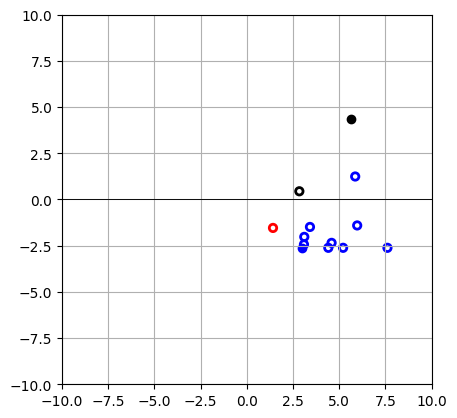

ACTION: [0.00048044 0.17428648]


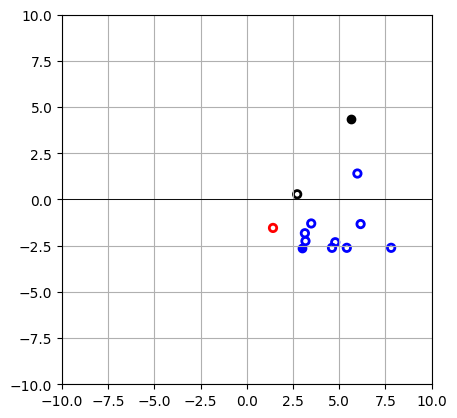

ACTION: [0.3635201 0.       ]


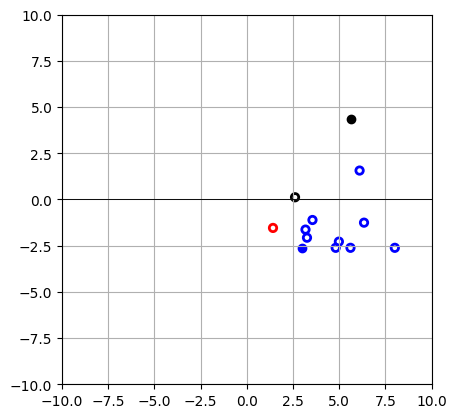

ACTION: [0.         0.02416256]


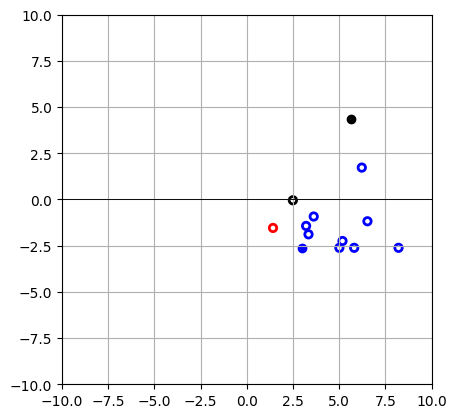

ACTION: [0.        1.3277434]


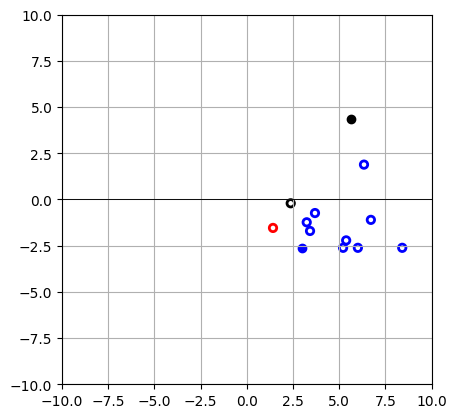

ACTION: [0.8412655 0.7561999]


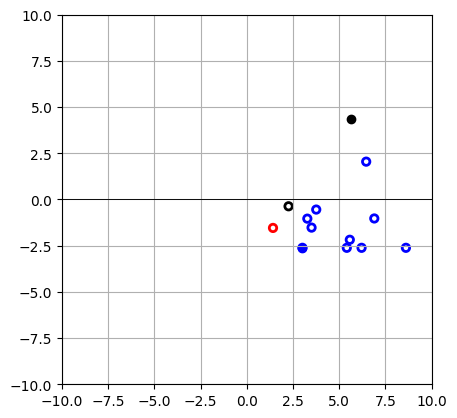

ACTION: [0. 0.]


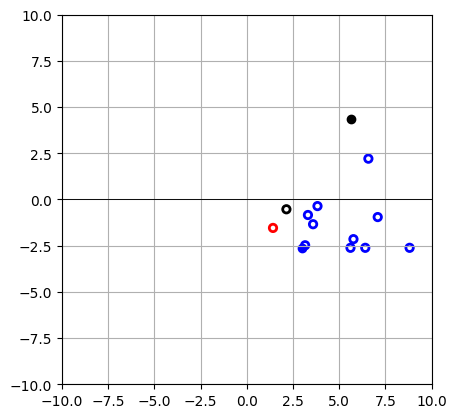

ACTION: [0. 0.]


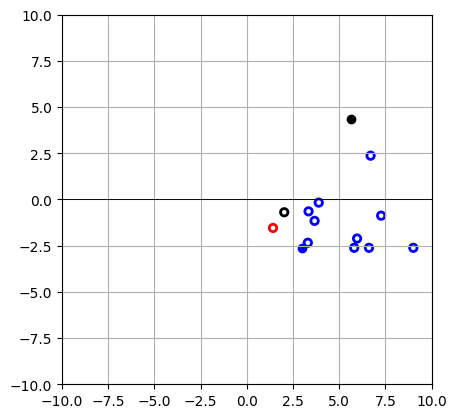

ACTION: [0.         0.45779955]


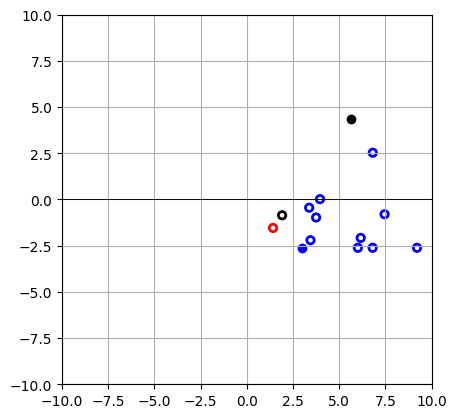

ACTION: [0. 0.]


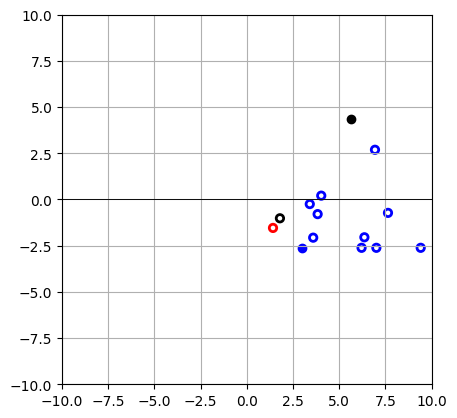

ACTION: [0.3429187 2.558868 ]


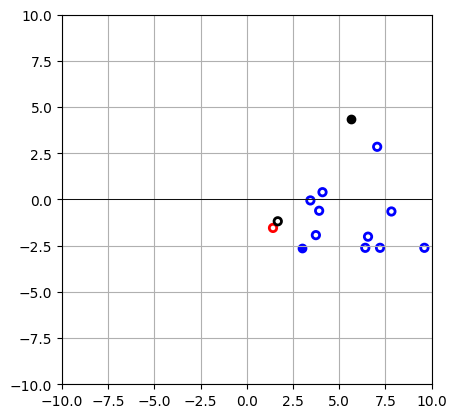

ACTION: [0.26605996 0.        ]


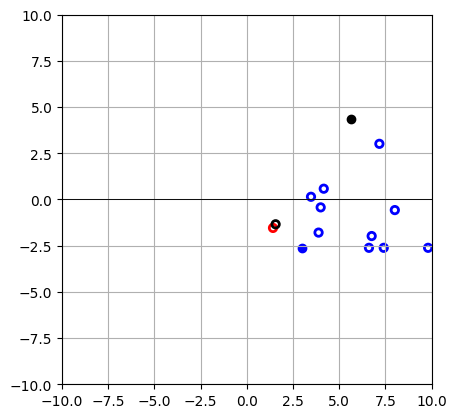

ACTION: [0.38945705 0.        ]


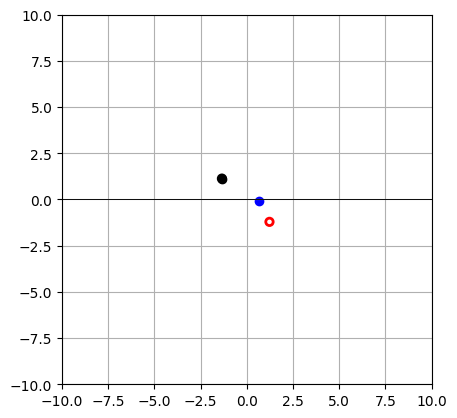

ACTION: [0.26138183 0.        ]


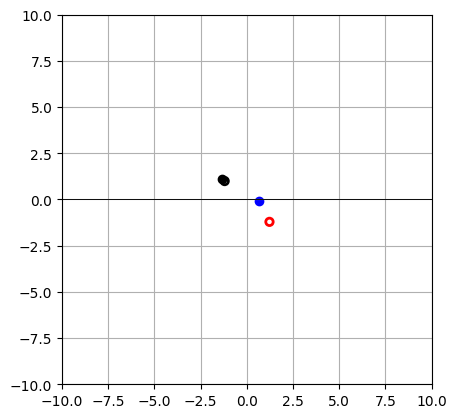

ACTION: [0.13884845 0.        ]


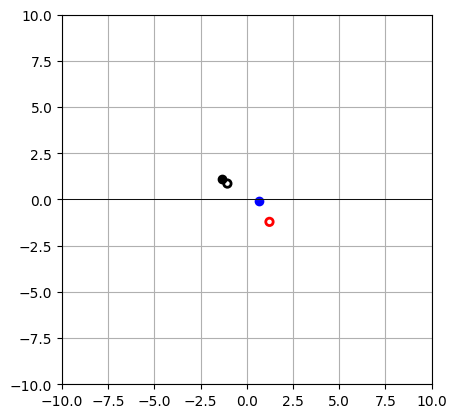

ACTION: [0. 0.]


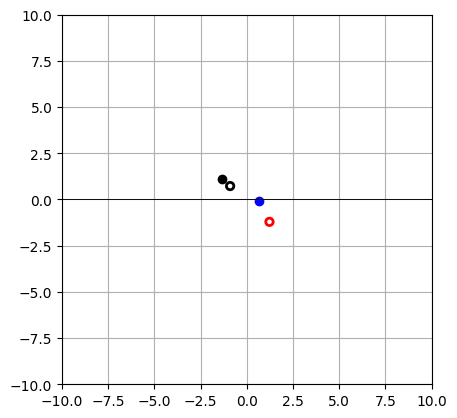

ACTION: [0.3273416 2.344459 ]


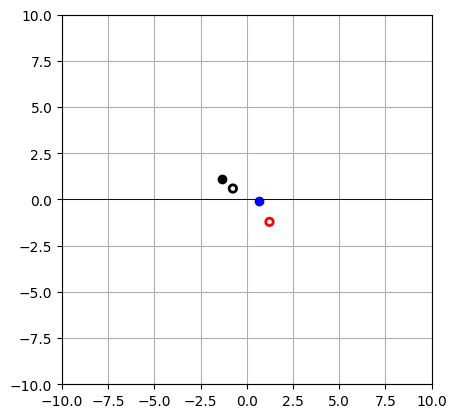

ACTION: [1.         0.85518765]


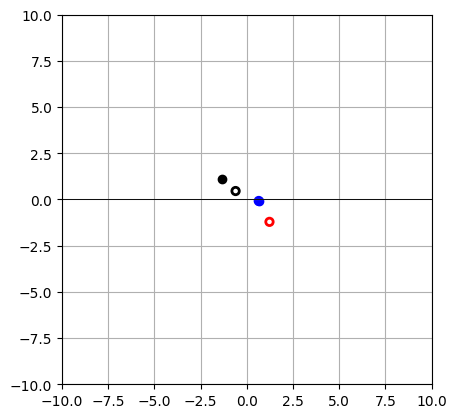

ACTION: [0. 0.]


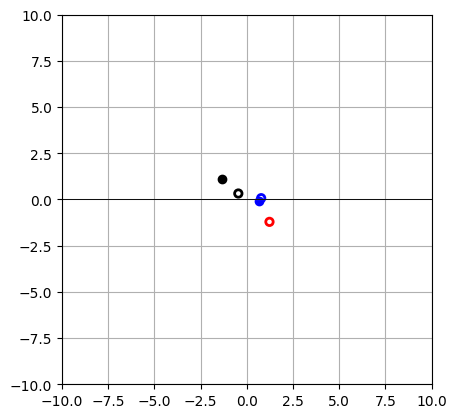

ACTION: [0.        0.6008386]


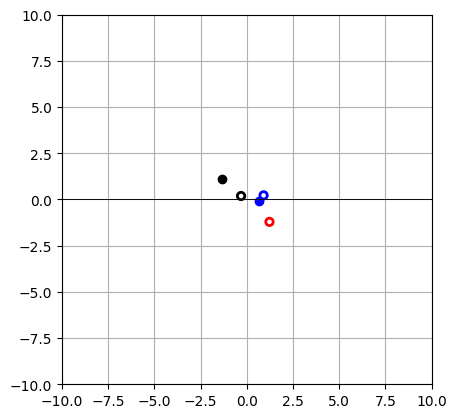

ACTION: [0. 0.]


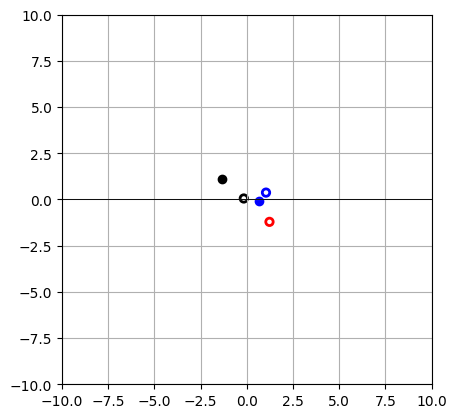

ACTION: [0.7128318 0.       ]


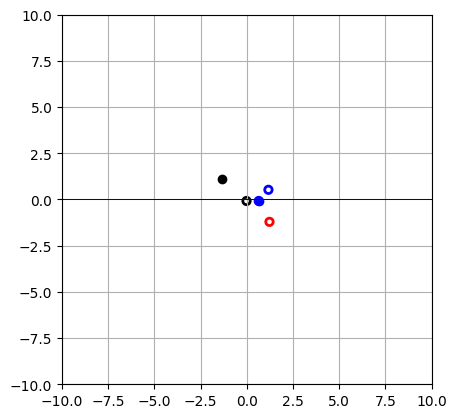

ACTION: [0. 0.]


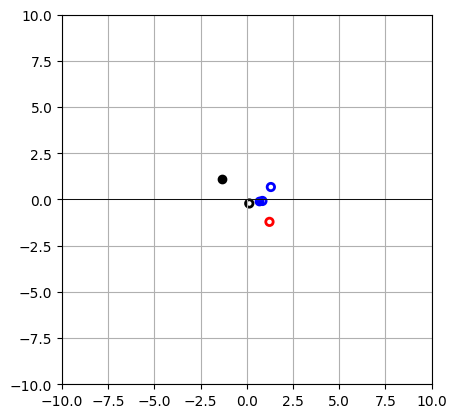

ACTION: [0.44033748 0.8367851 ]


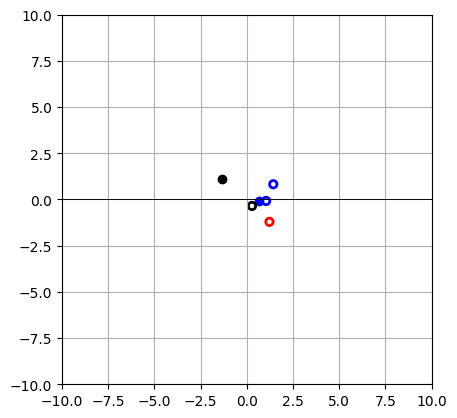

ACTION: [0.05168718 0.        ]


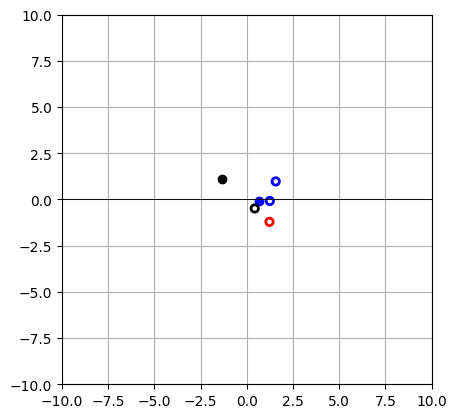

ACTION: [0. 0.]


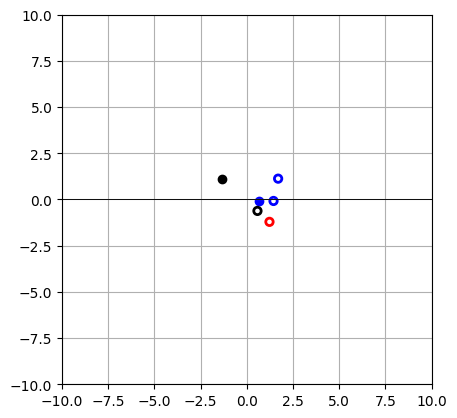

ACTION: [0.        2.4331696]


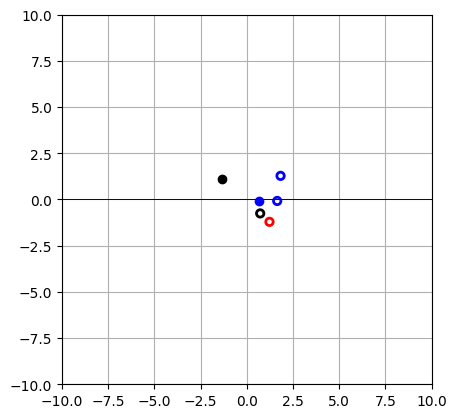

ACTION: [0.        1.9418398]


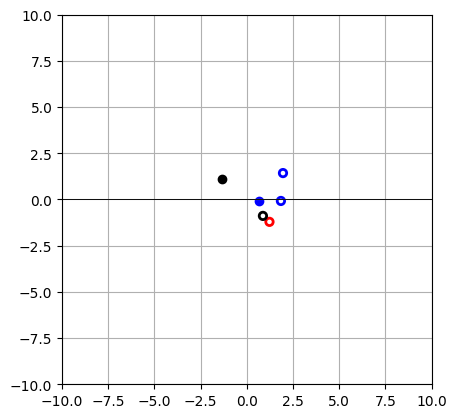

ACTION: [0.         0.26501396]


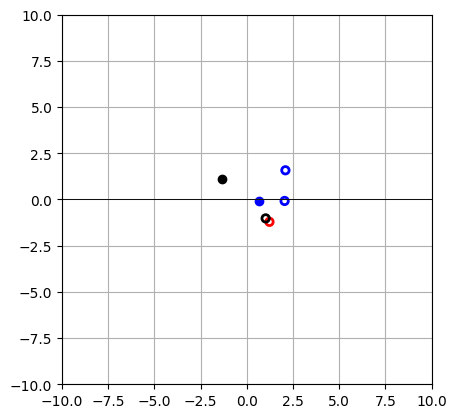

ACTION: [0.       1.348522]


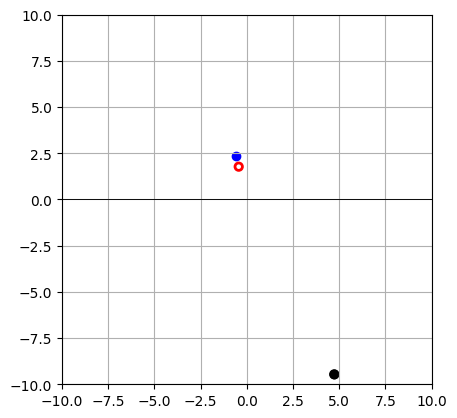

ACTION: [0.         0.37171718]


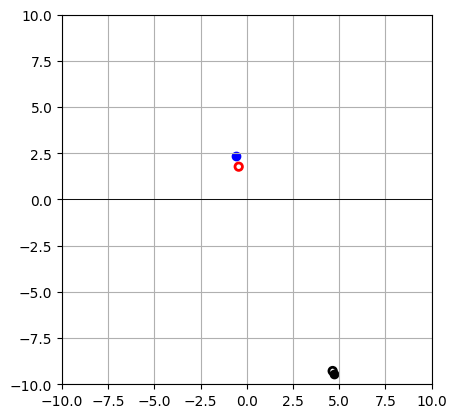

ACTION: [0.        0.9701798]


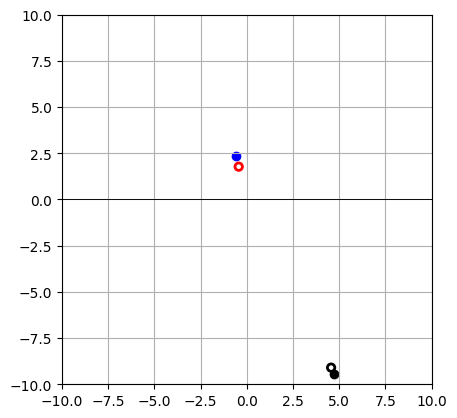

ACTION: [0.35913536 1.0287974 ]


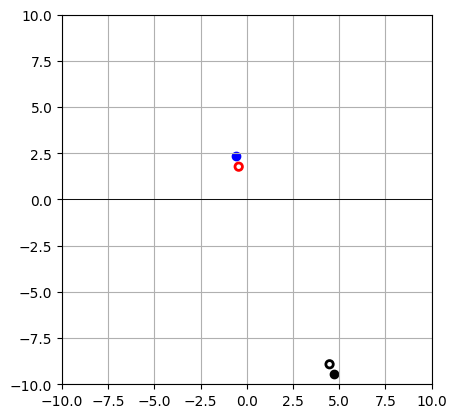

ACTION: [0.36446148 0.81396055]


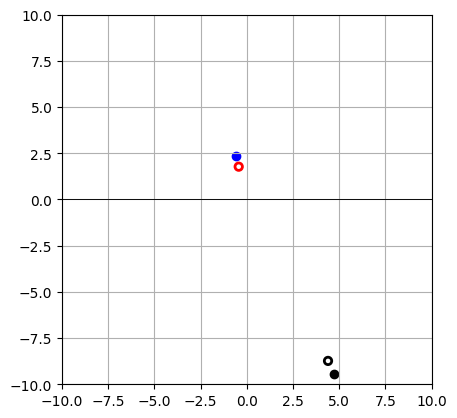

ACTION: [0.2562584 0.       ]


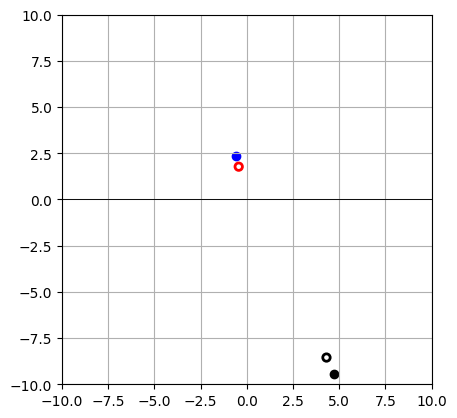

ACTION: [0.        0.6668934]


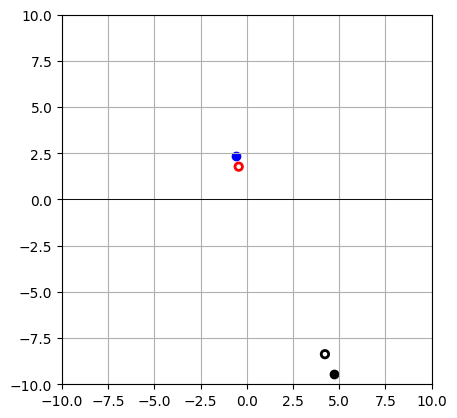

ACTION: [1.        1.1239989]


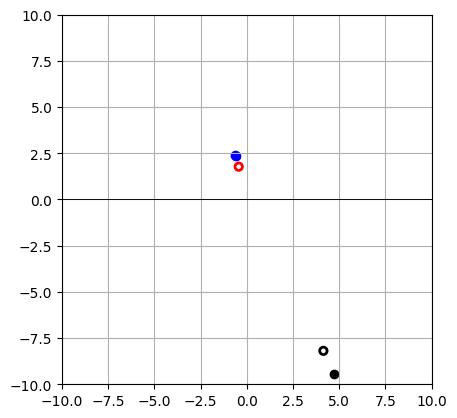

ACTION: [0.7039883 0.       ]


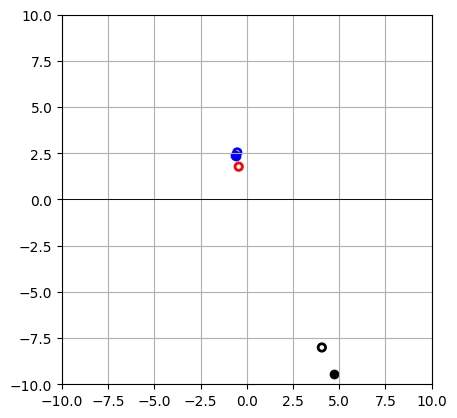

ACTION: [0.550422 0.      ]


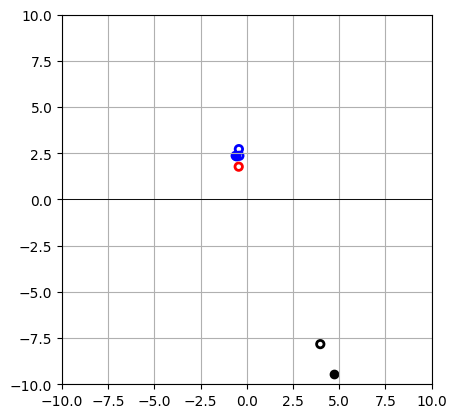

ACTION: [0.57027686 0.59276336]


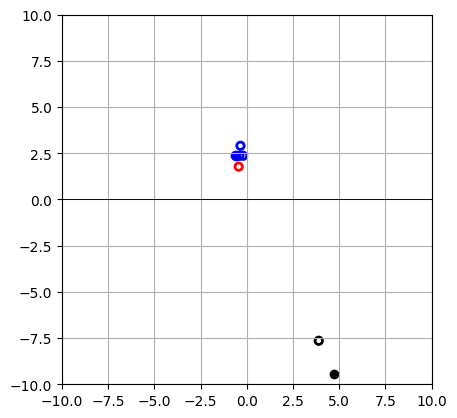

ACTION: [0.13822965 2.4877465 ]


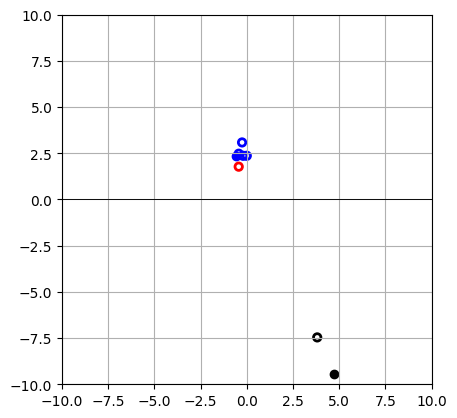

ACTION: [0.62761307 2.8199863 ]


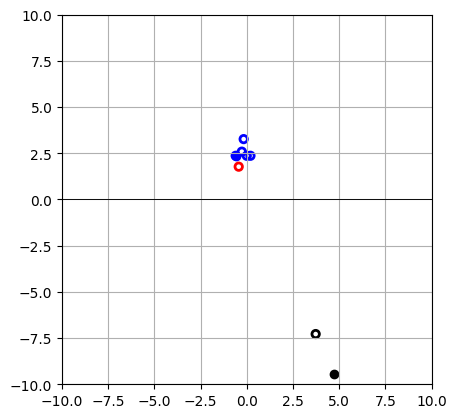

ACTION: [0.32431325 0.        ]


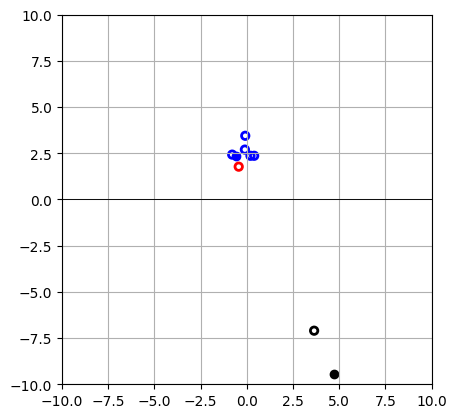

ACTION: [0. 0.]


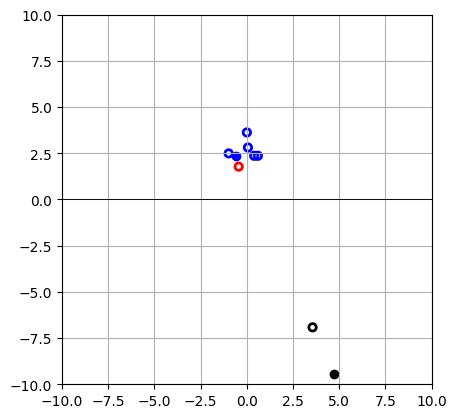

ACTION: [0.3453448 0.       ]


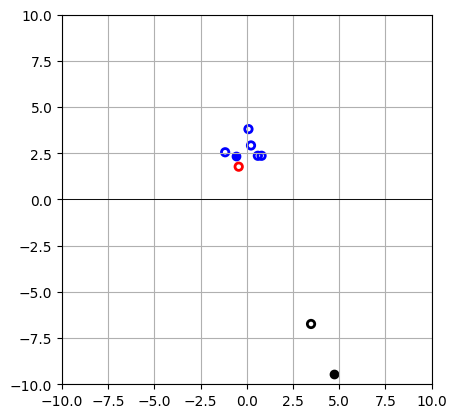

ACTION: [0. 0.]


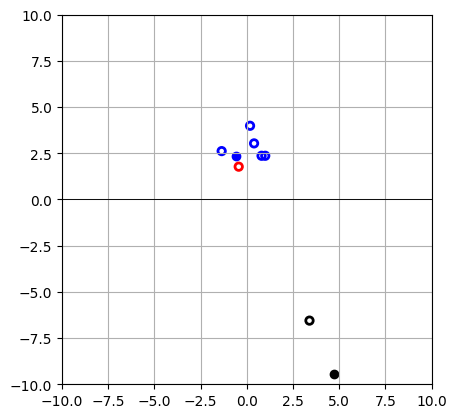

ACTION: [0. 0.]


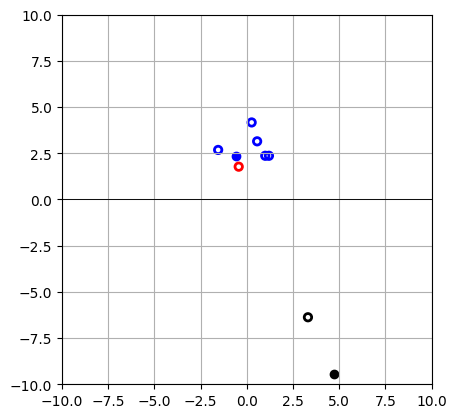

ACTION: [0. 0.]


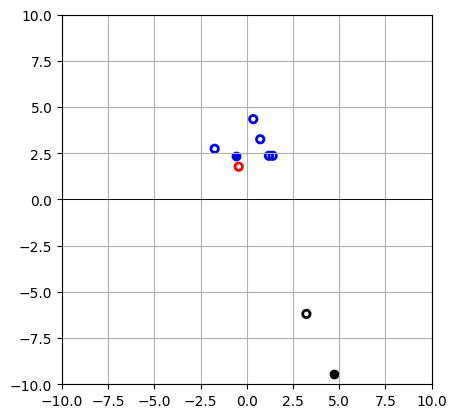

ACTION: [0. 0.]


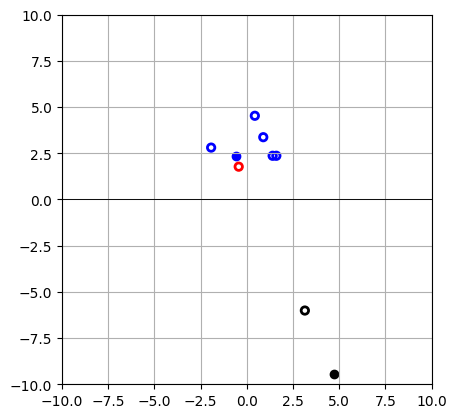

ACTION: [0.33044097 1.5544237 ]


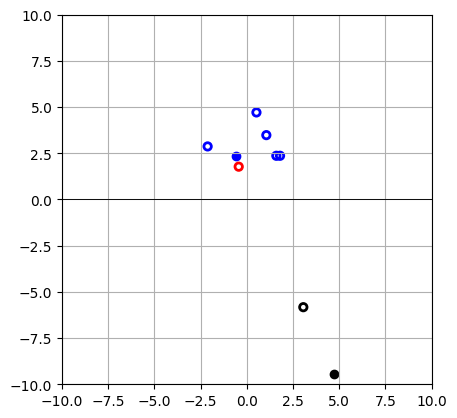

ACTION: [1.         0.27535194]


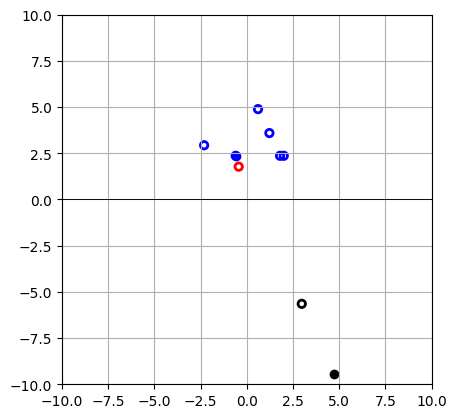

ACTION: [1. 0.]


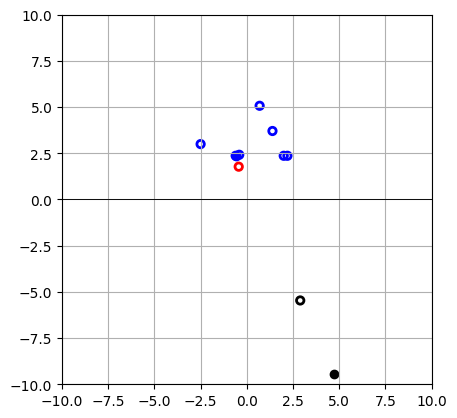

ACTION: [0.53446794 0.06998092]


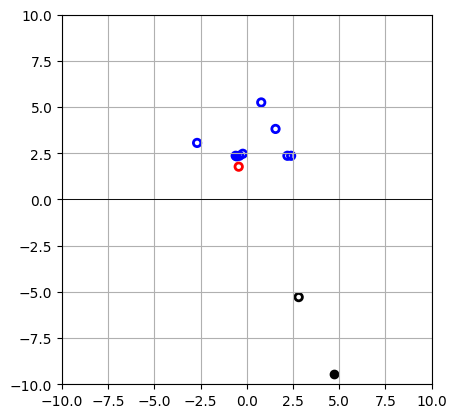

ACTION: [0. 0.]


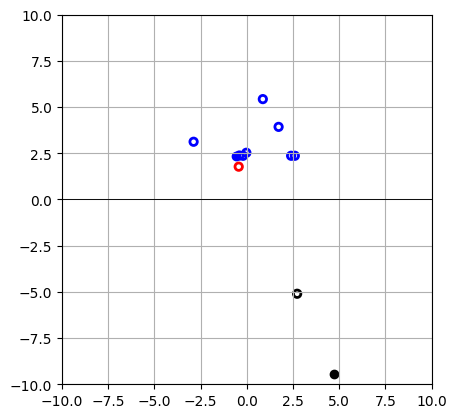

ACTION: [0.93409395 0.5816746 ]


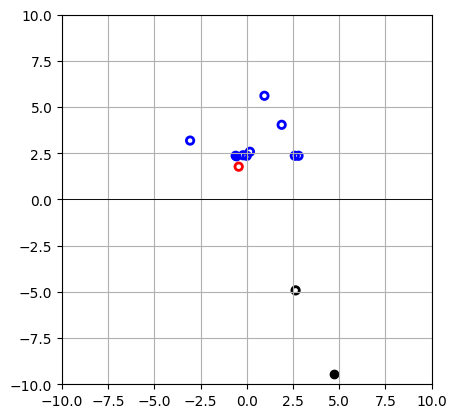

ACTION: [0.         0.07512514]


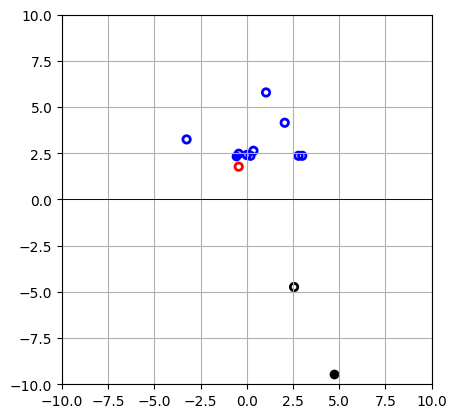

ACTION: [0.15147683 0.48667756]


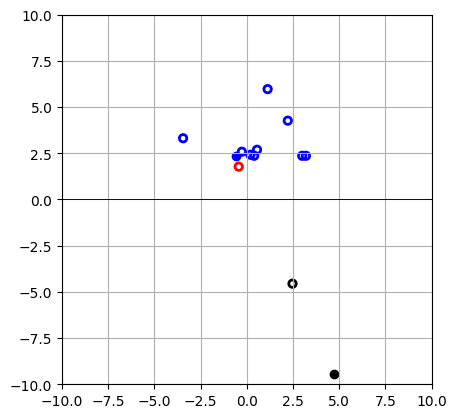

ACTION: [0.01113982 0.        ]


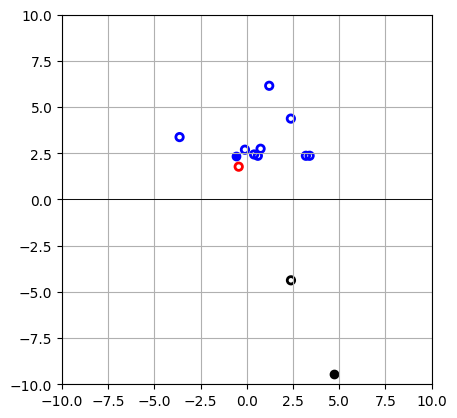

ACTION: [1.         0.70332646]


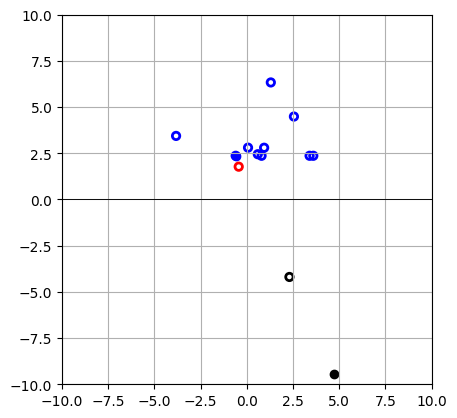

ACTION: [0.69447535 0.        ]


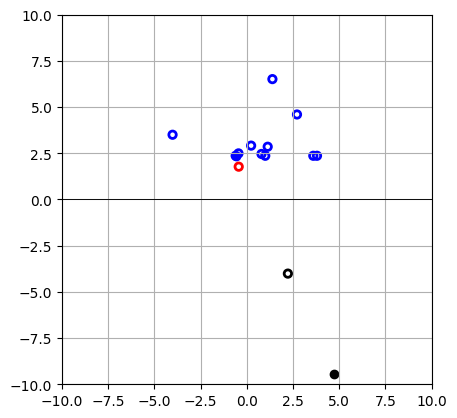

ACTION: [0.        1.2853612]


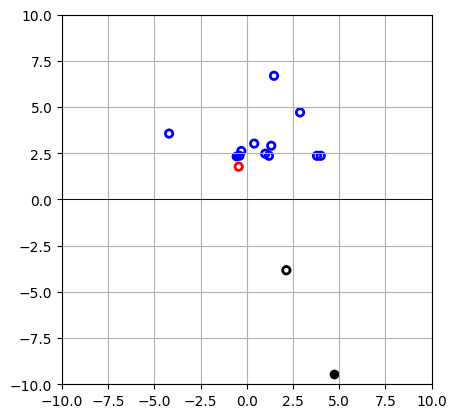

ACTION: [0. 0.]


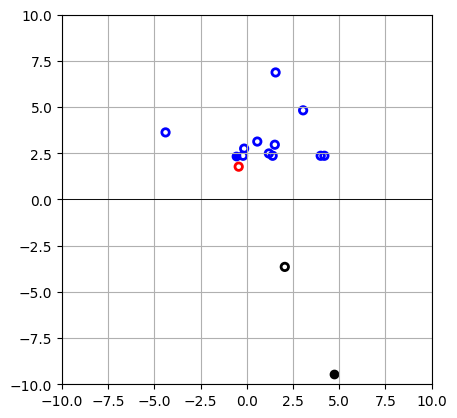

ACTION: [0. 0.]


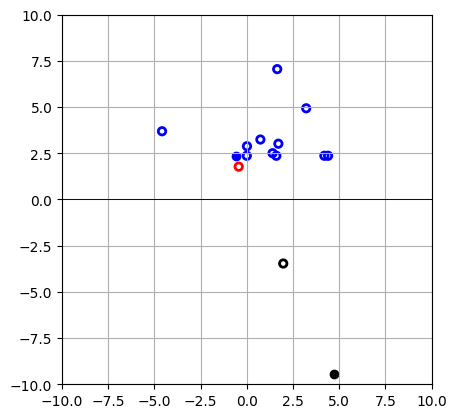

ACTION: [0.34911048 1.5564003 ]


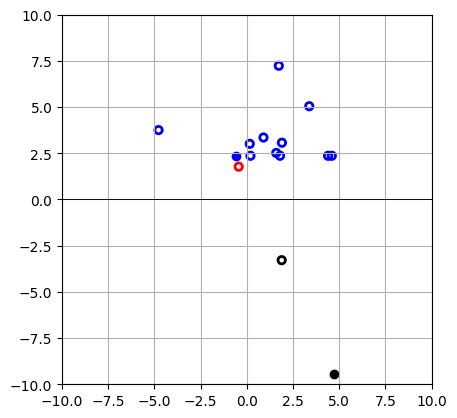

ACTION: [0. 0.]


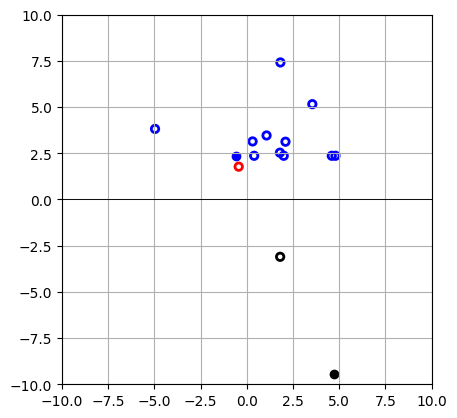

ACTION: [0.21372412 0.        ]


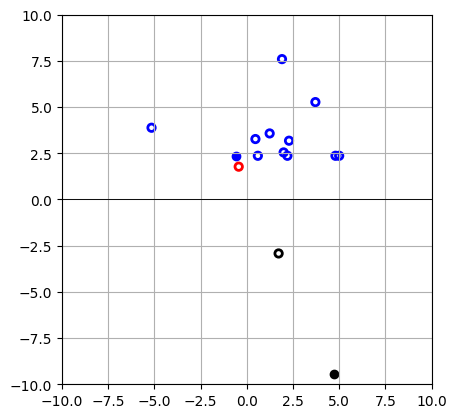

ACTION: [0.         0.44103345]


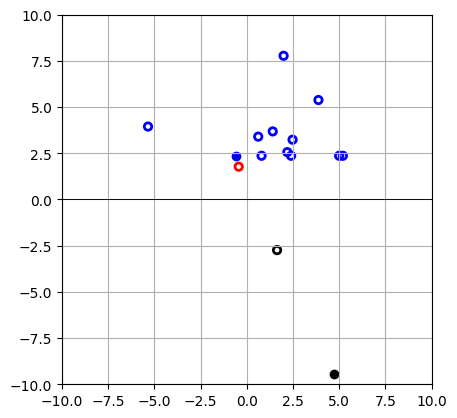

ACTION: [0.04687183 0.        ]


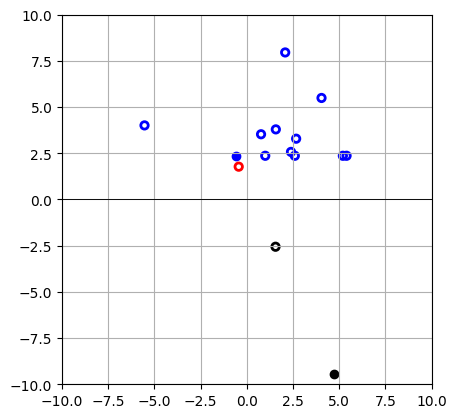

ACTION: [0. 0.]


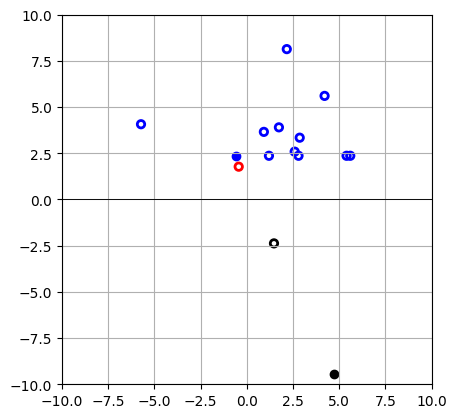

ACTION: [0. 0.]


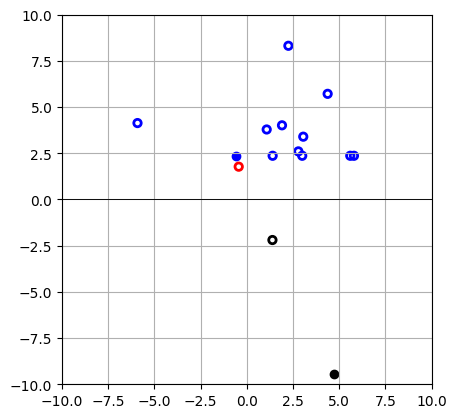

ACTION: [1.        0.5592543]


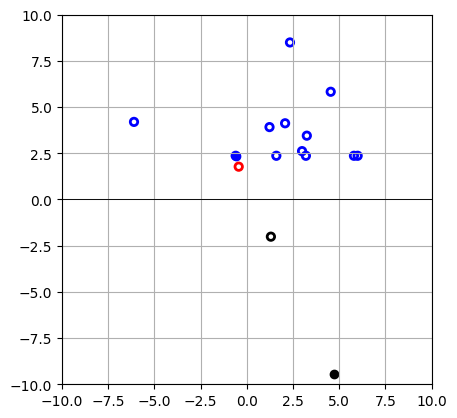

ACTION: [0.81095105 0.12547114]


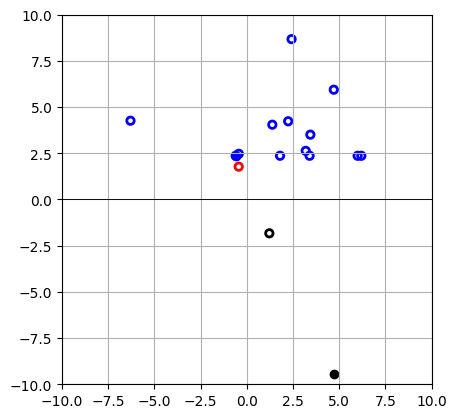

ACTION: [0.        2.3137715]


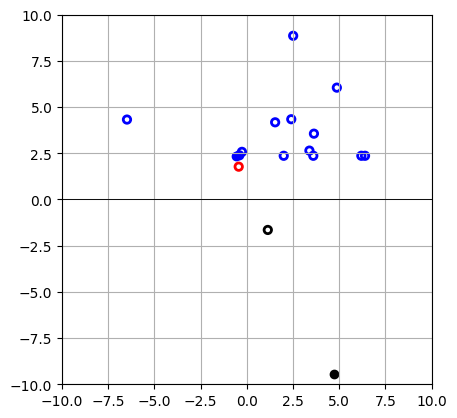

ACTION: [1. 0.]


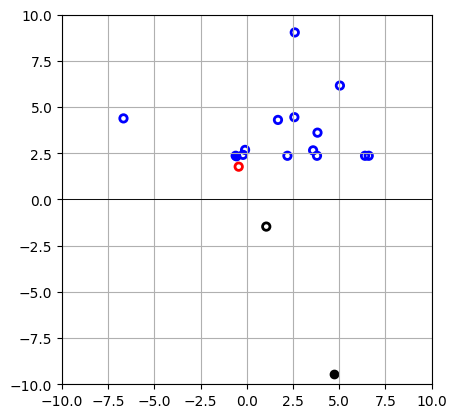

ACTION: [0.8882449 0.       ]


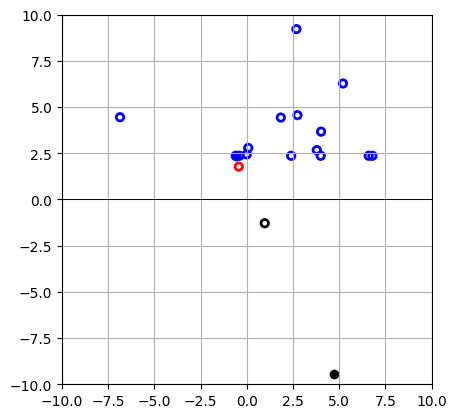

ACTION: [0. 0.]


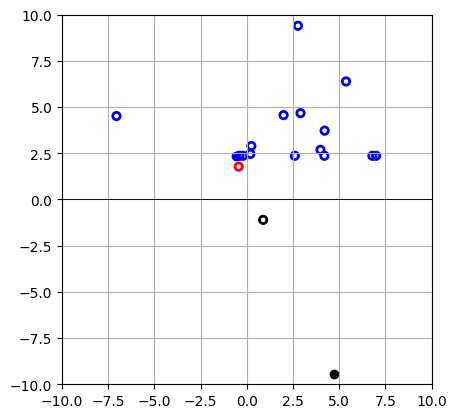

ACTION: [0. 0.]


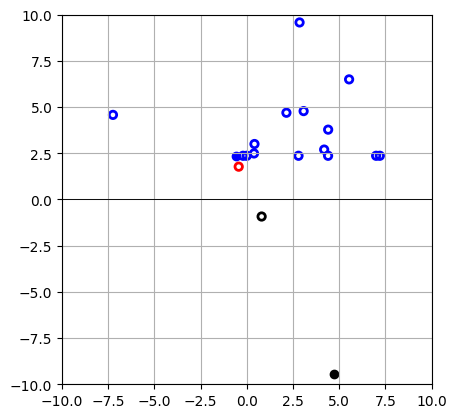

ACTION: [0.        2.9857614]


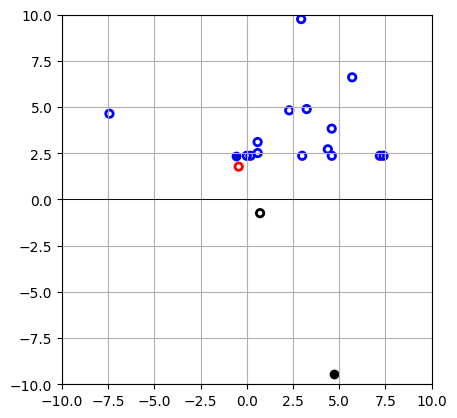

ACTION: [0.         0.16803642]


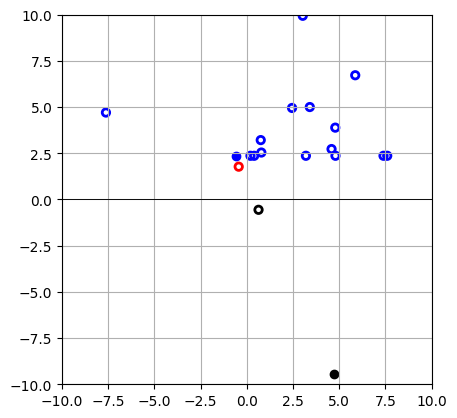

ACTION: [0.        1.8971556]


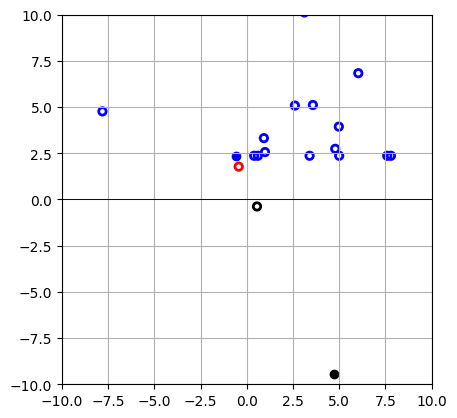

ACTION: [0.       0.738689]


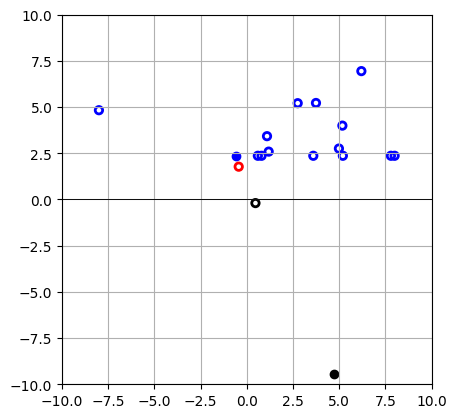

ACTION: [1.        1.4012079]


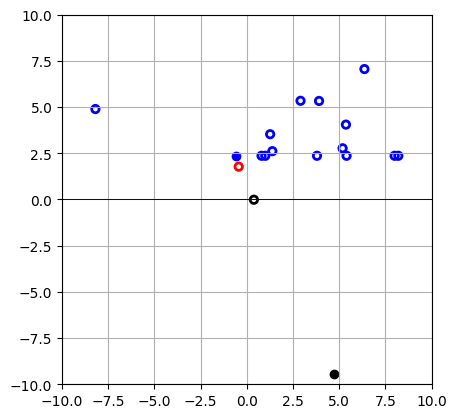

ACTION: [0.57584685 1.3846568 ]


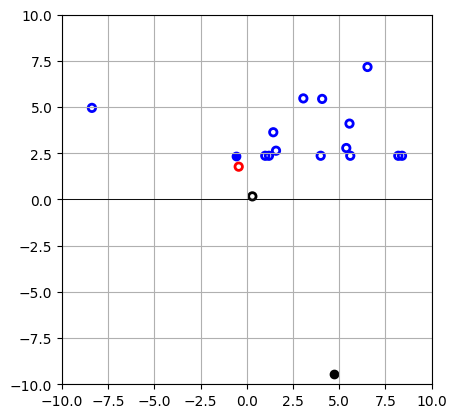

ACTION: [0. 0.]


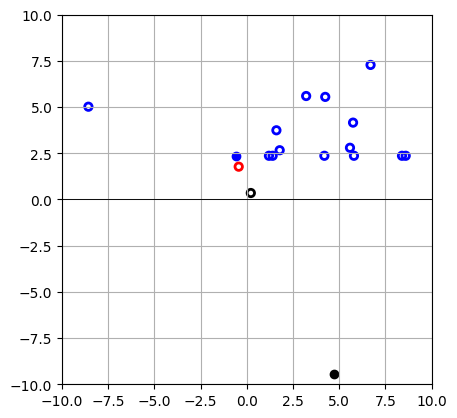

ACTION: [0.536744  1.5573657]


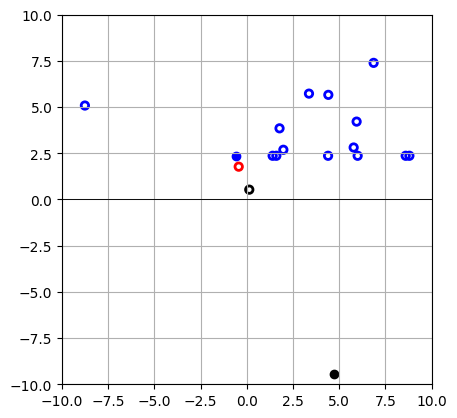

ACTION: [0.6533128 1.2078109]


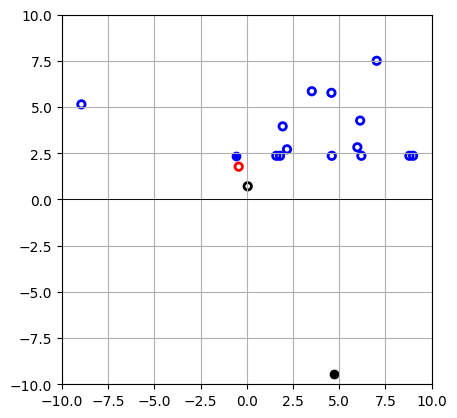

ACTION: [0.         0.45923373]


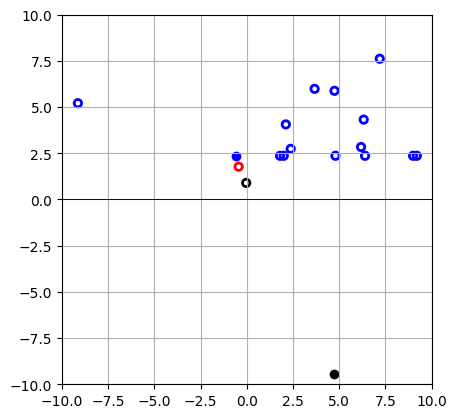

ACTION: [1. 0.]


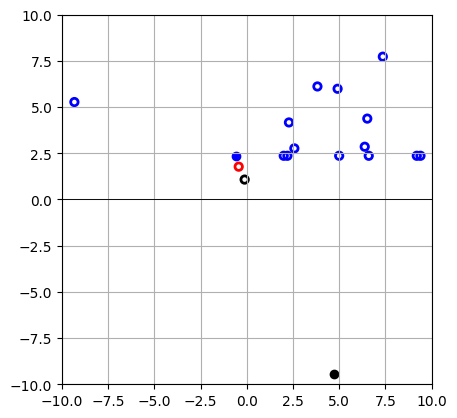

ACTION: [0. 0.]


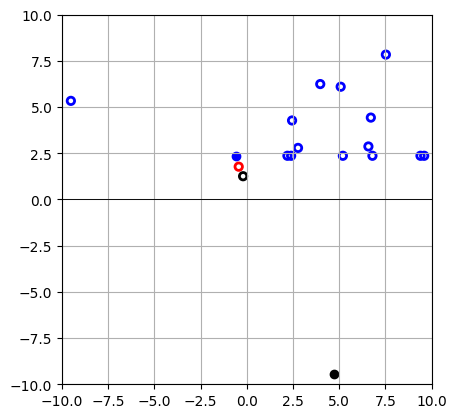

ACTION: [1.        1.3283633]


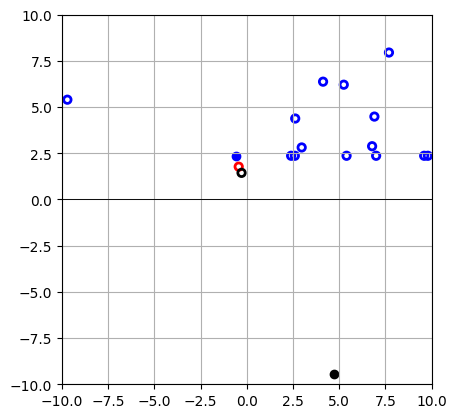

ACTION: [0.        1.2913505]


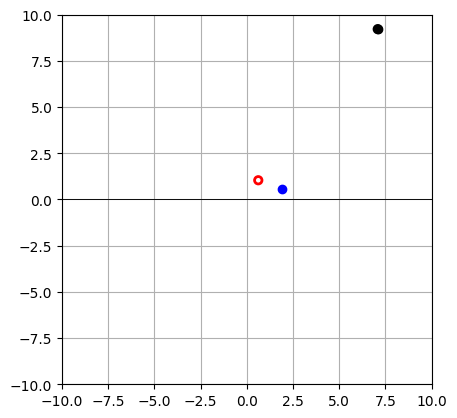

ACTION: [0.5007981 0.       ]


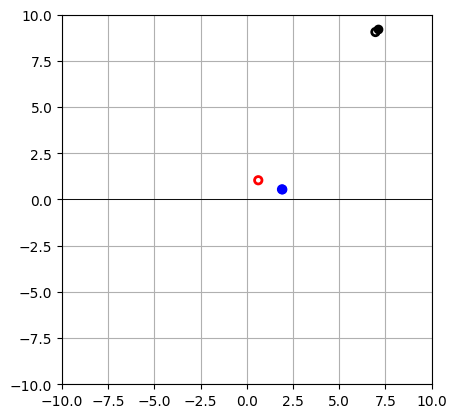

ACTION: [0. 0.]


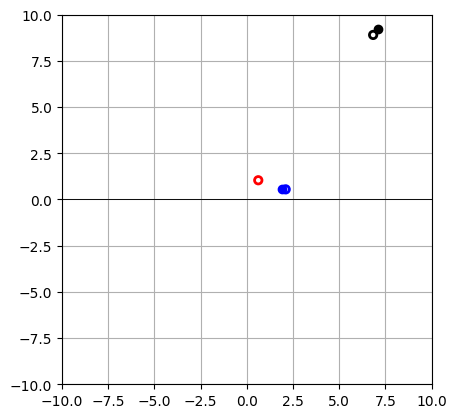

ACTION: [0.5968805 0.       ]


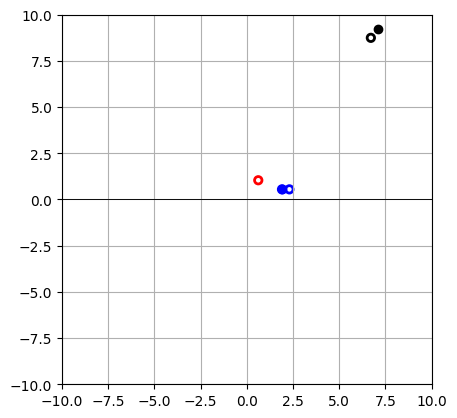

ACTION: [0. 0.]


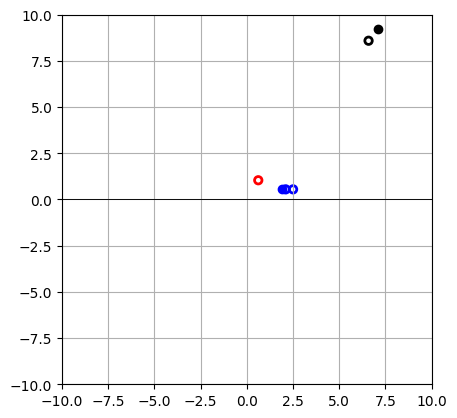

ACTION: [0.11999132 0.        ]


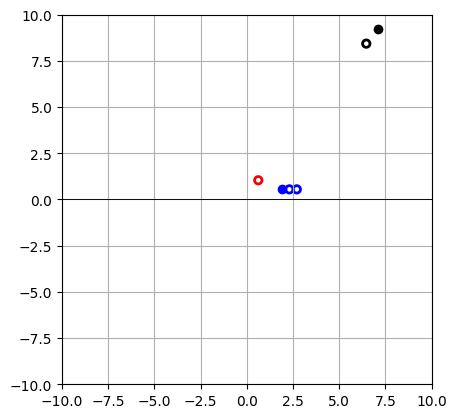

ACTION: [0.4686588 0.       ]


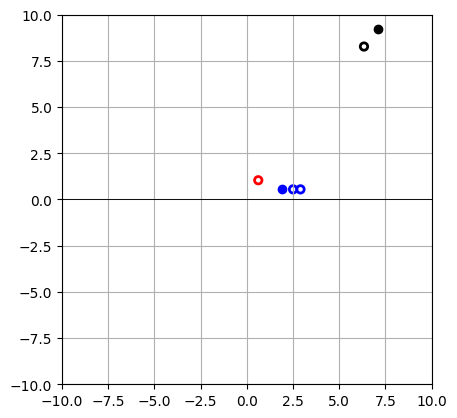

ACTION: [0.7563215  0.61467224]


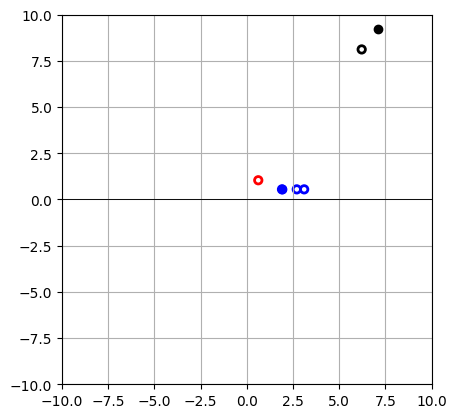

ACTION: [0.1541944  0.47189248]


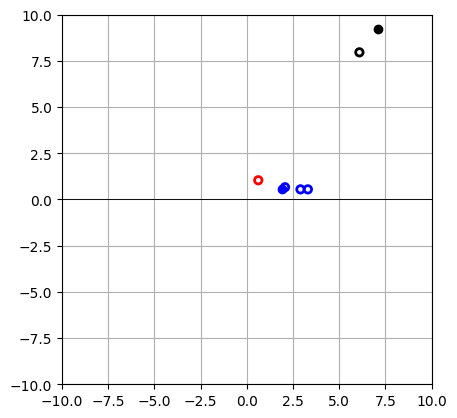

ACTION: [0.       1.102986]


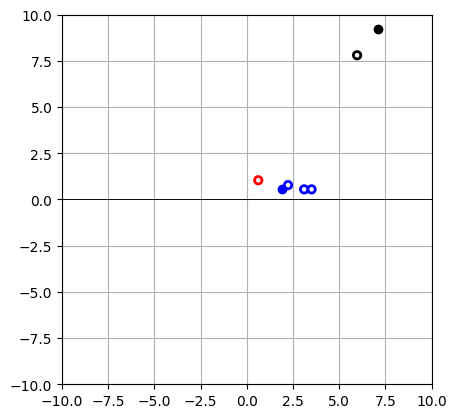

ACTION: [0. 0.]


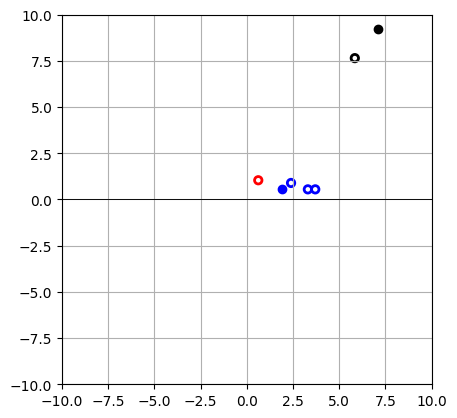

ACTION: [0.2947122  0.79988277]


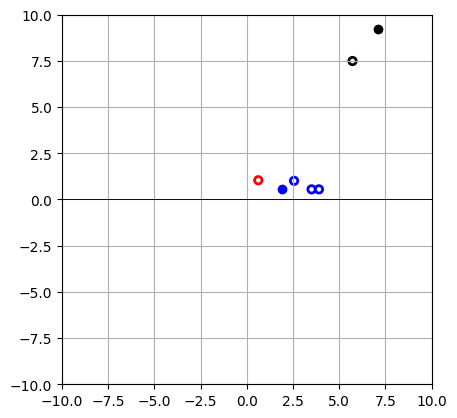

ACTION: [1.        1.0384723]


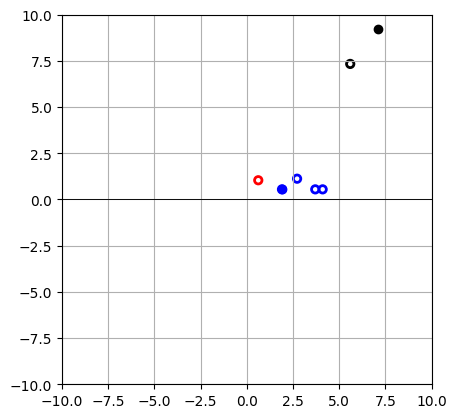

ACTION: [0. 0.]


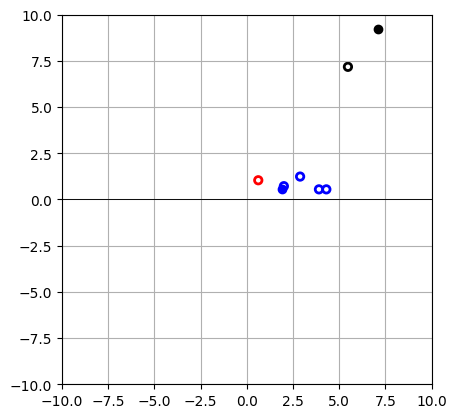

ACTION: [0. 0.]


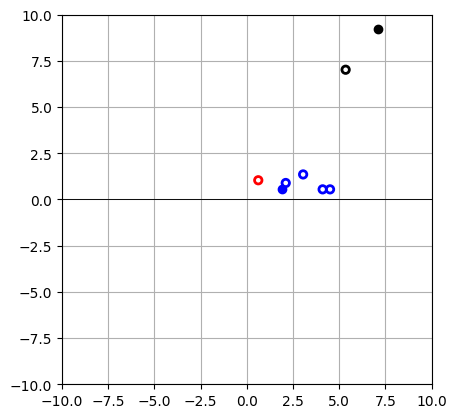

ACTION: [1.        0.8699492]


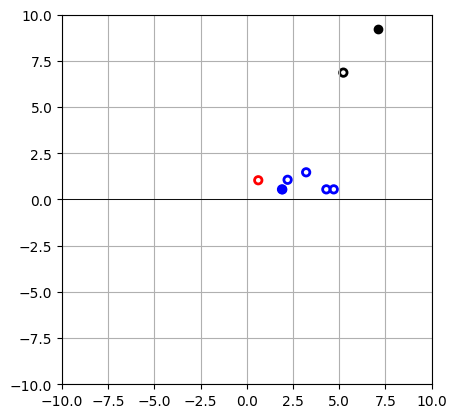

ACTION: [0.5847211  0.78962886]


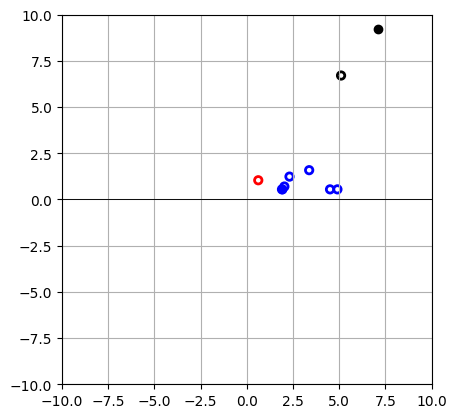

ACTION: [0.05457106 0.32090613]


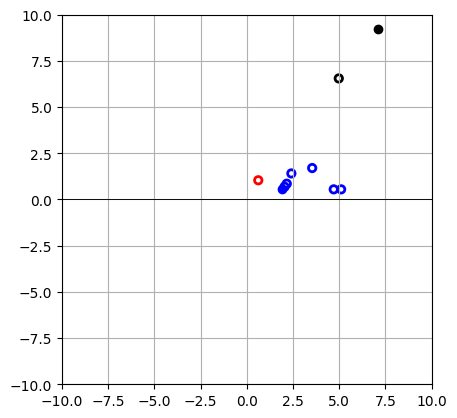

ACTION: [0. 0.]


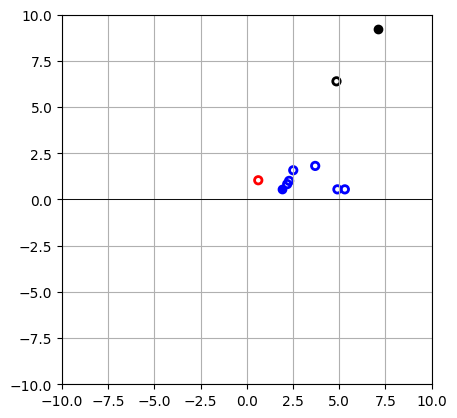

ACTION: [0.133955 0.      ]


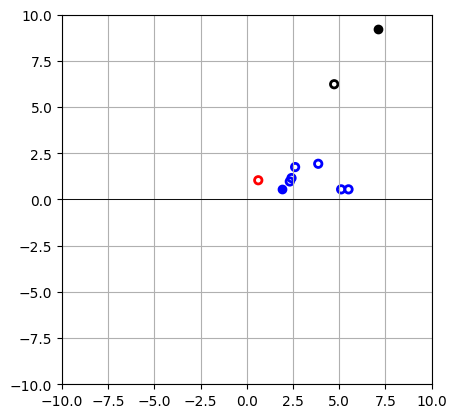

ACTION: [0.44282025 0.31376335]


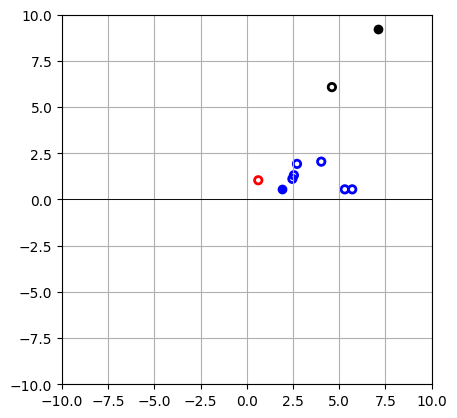

ACTION: [1.        0.8986743]


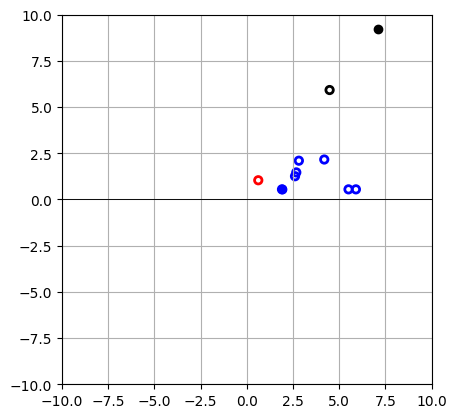

ACTION: [0.7522201  0.53508323]


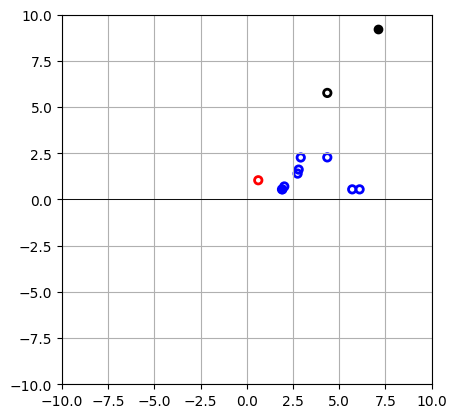

ACTION: [0.         0.14460392]


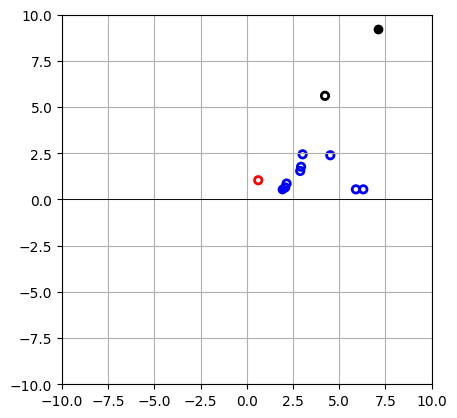

ACTION: [0.87003833 0.        ]


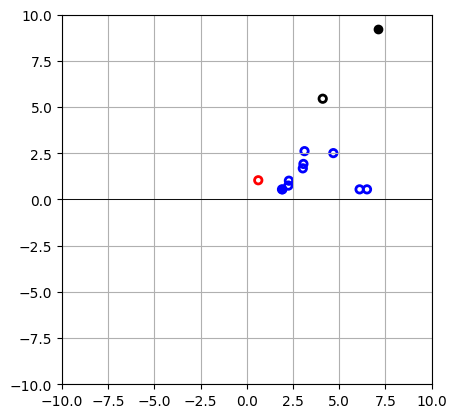

ACTION: [0.         0.32185385]


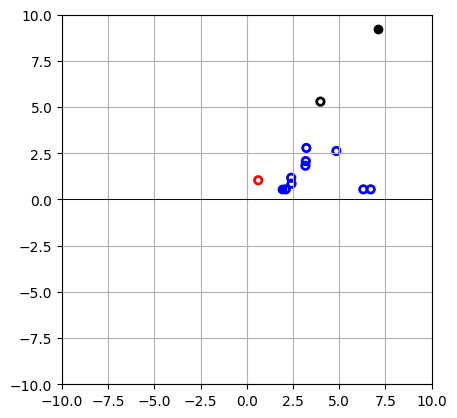

ACTION: [0.        0.8360908]


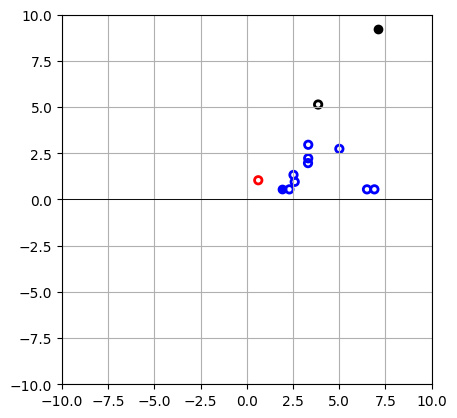

ACTION: [1. 0.]


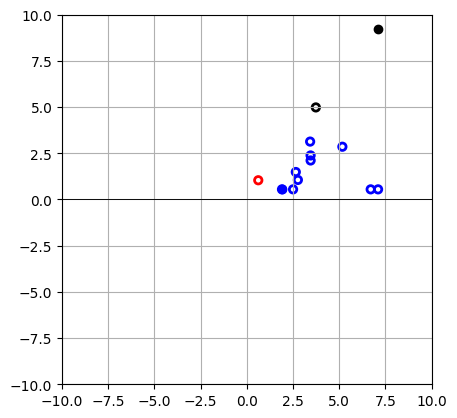

ACTION: [1.        1.1925875]


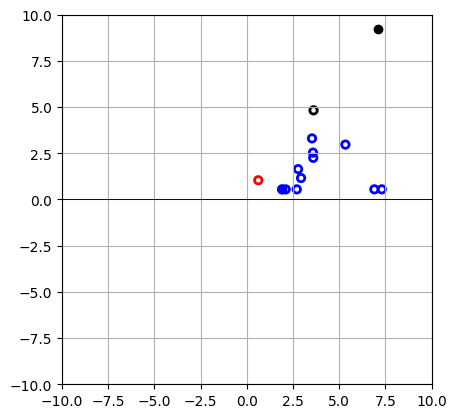

ACTION: [0. 0.]


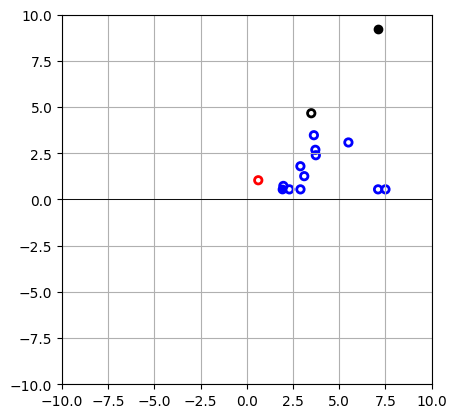

ACTION: [0.12426367 0.        ]


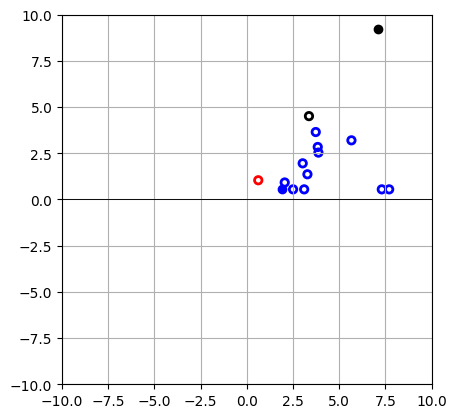

ACTION: [0.03965374 0.3339649 ]


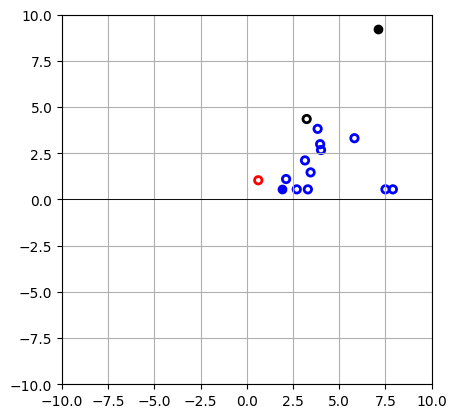

ACTION: [0.        1.2015656]


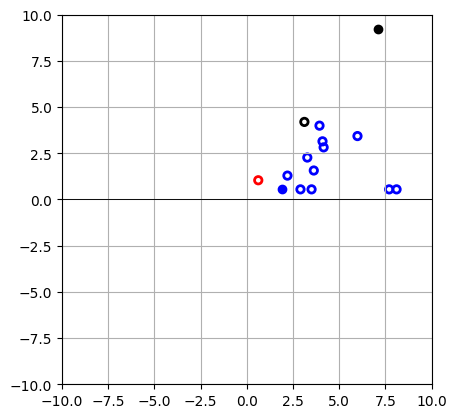

ACTION: [0.        0.5315326]


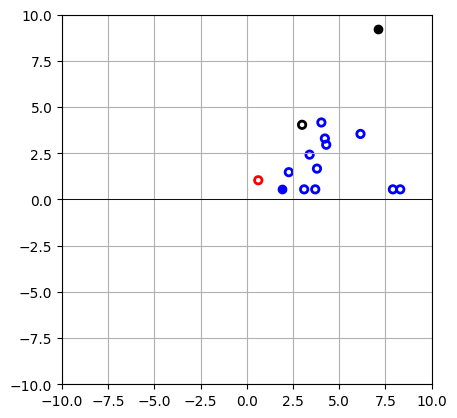

ACTION: [0.         0.47010285]


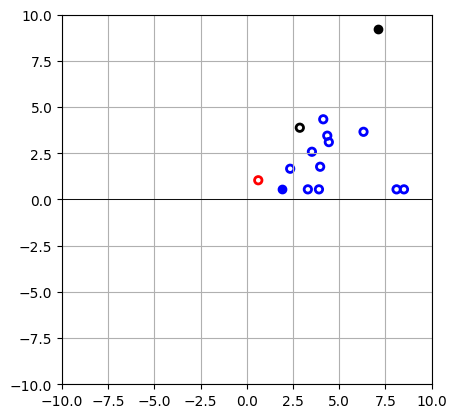

ACTION: [0. 0.]


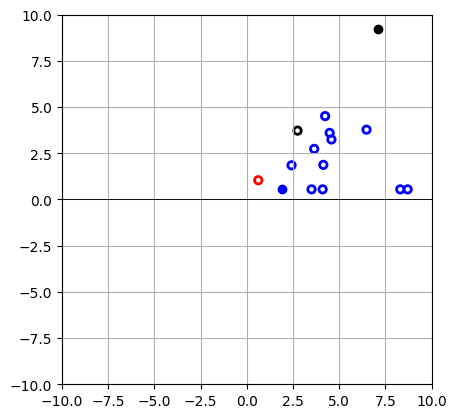

ACTION: [0. 0.]


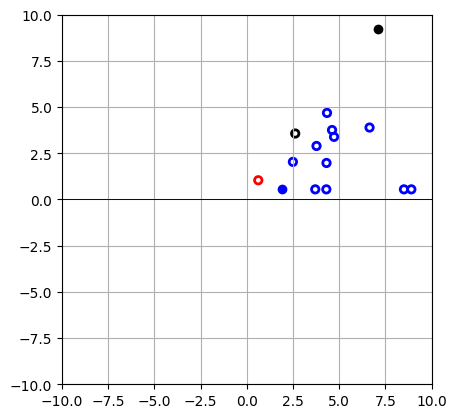

ACTION: [0. 0.]


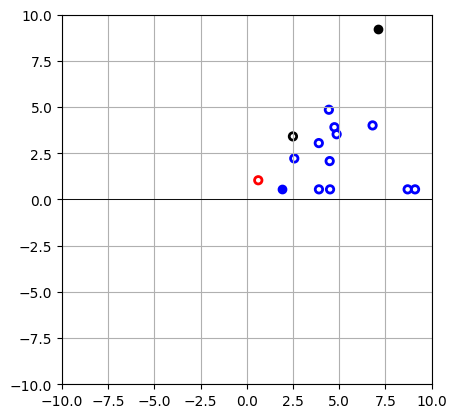

ACTION: [0.8449101  0.49241102]


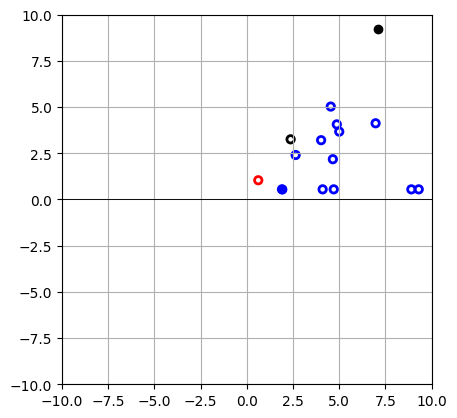

ACTION: [0.        1.2174675]


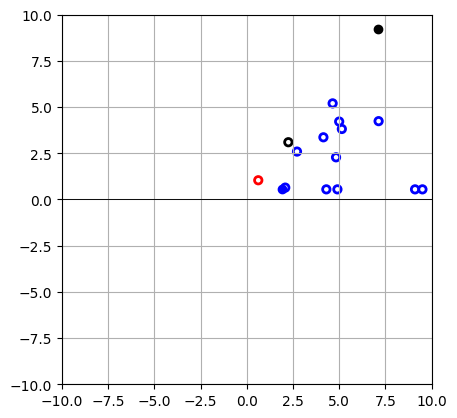

ACTION: [0.        1.8212526]


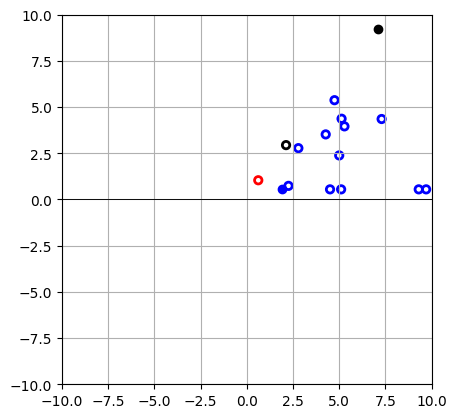

ACTION: [0.17875375 0.        ]


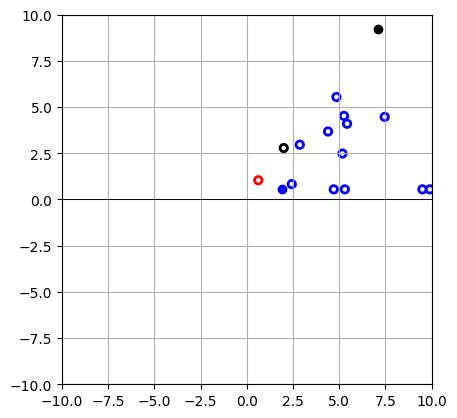

ACTION: [0.25844324 0.        ]


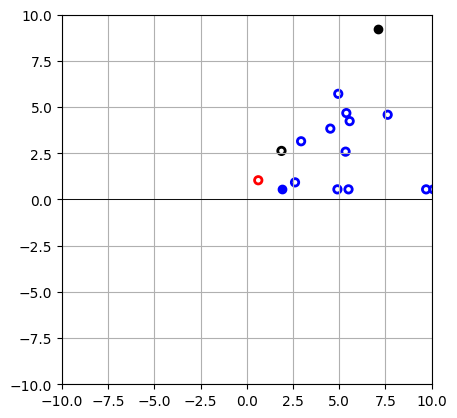

ACTION: [1.        0.8667742]


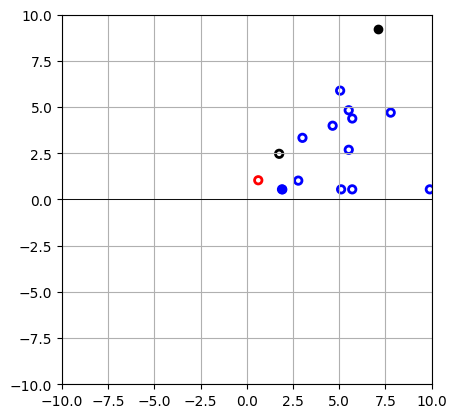

ACTION: [0.66471845 0.        ]


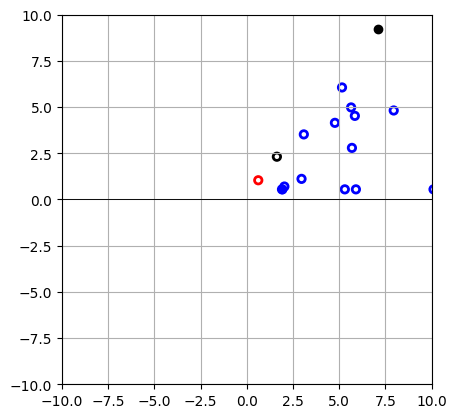

ACTION: [1. 0.]


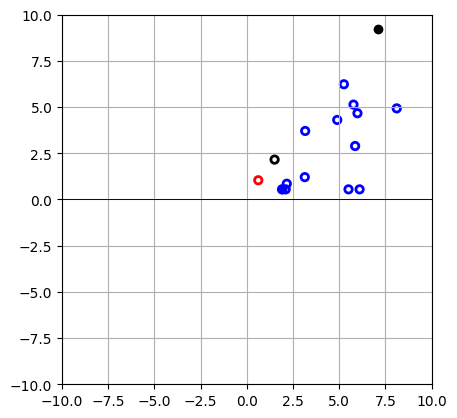

ACTION: [0. 0.]


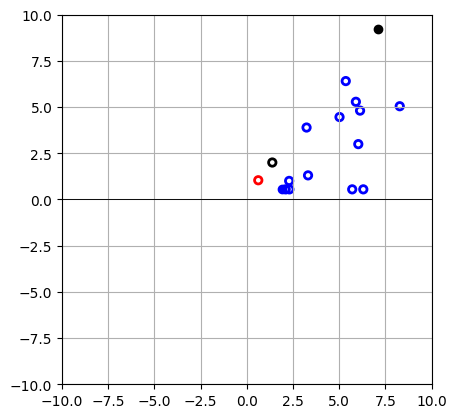

ACTION: [0.        0.3913314]


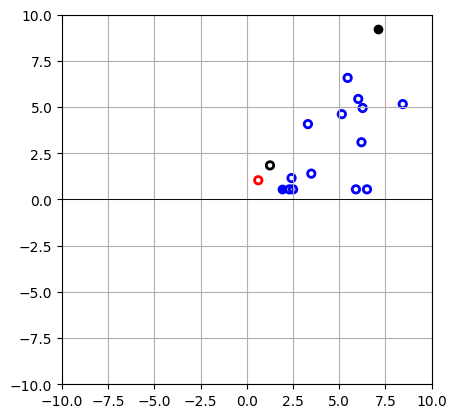

ACTION: [0.7611988 1.090563 ]


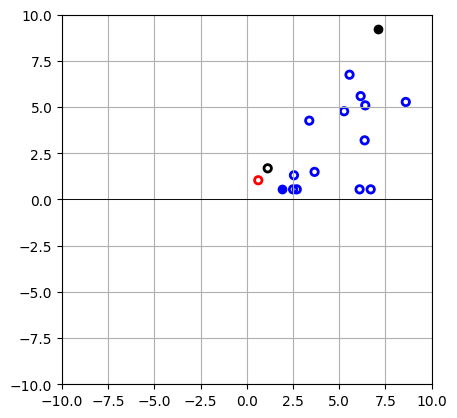

ACTION: [0.         0.86160654]


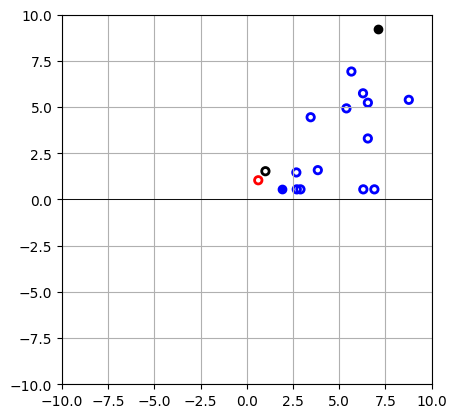

ACTION: [0.         0.72333837]


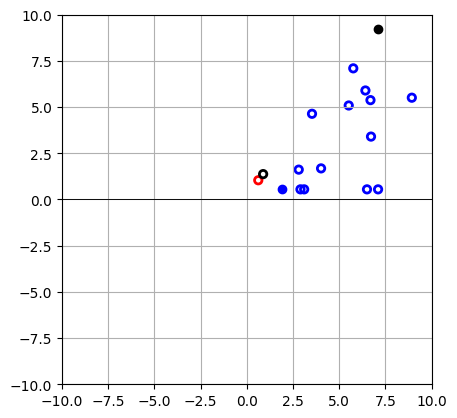

ACTION: [0.        1.2245617]


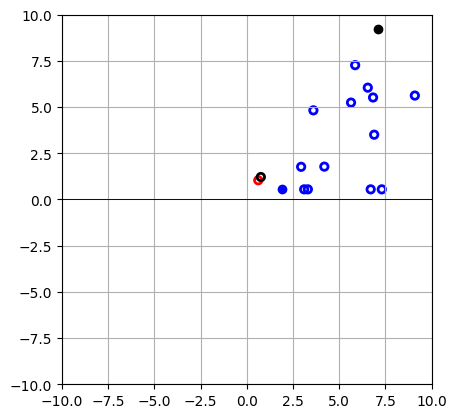

ACTION: [0.5172802 0.       ]


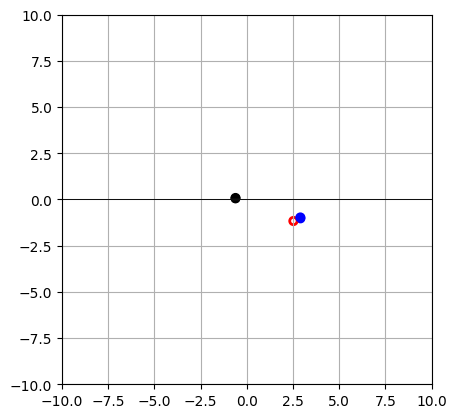

ACTION: [0. 0.]


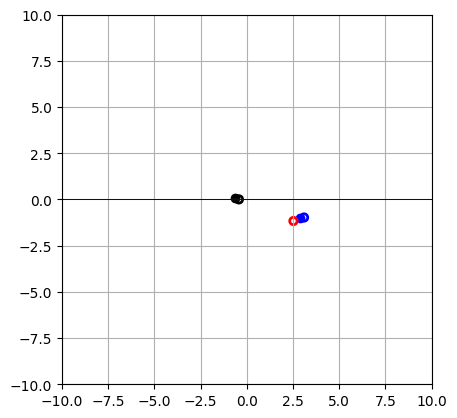

ACTION: [0. 0.]


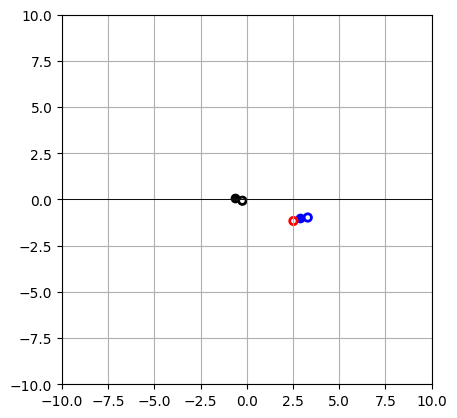

ACTION: [0.         0.16075389]


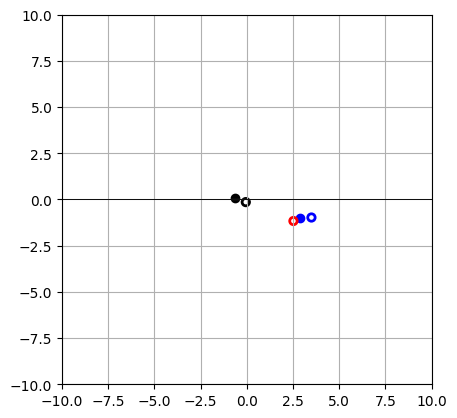

ACTION: [0. 0.]


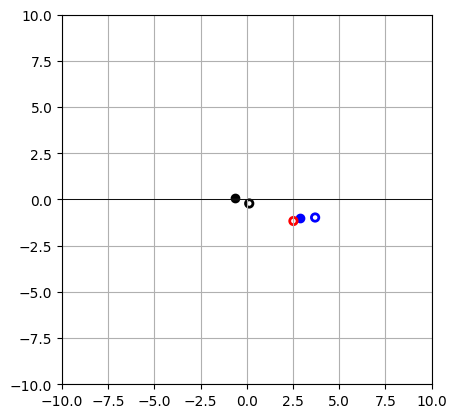

ACTION: [0.     2.5237]


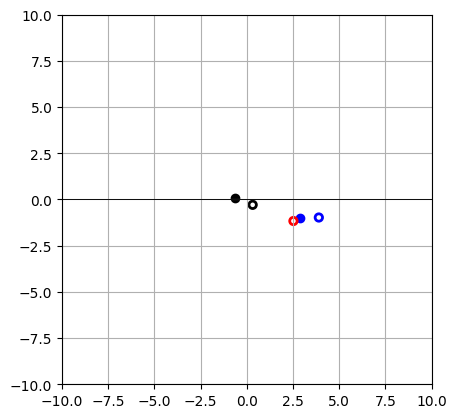

ACTION: [0.6993684 0.       ]


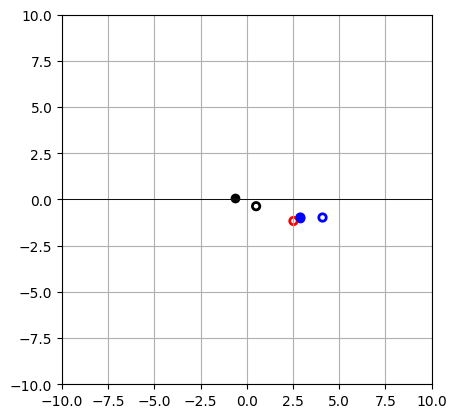

ACTION: [0. 0.]


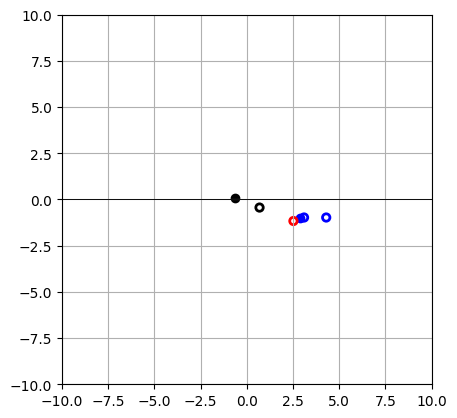

ACTION: [1.         0.09018141]


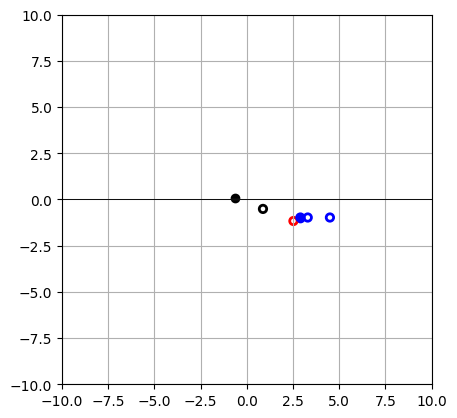

ACTION: [0.51676655 0.        ]


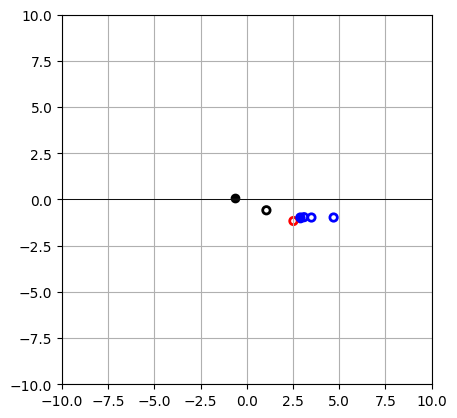

ACTION: [0. 0.]


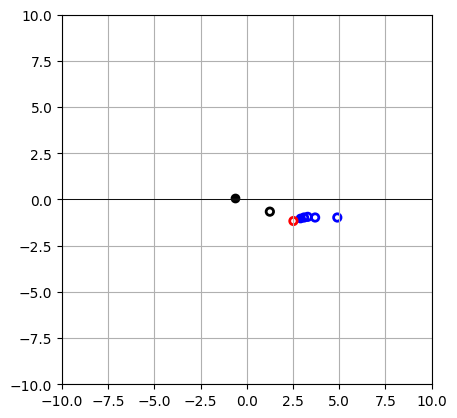

ACTION: [0.         0.68323463]


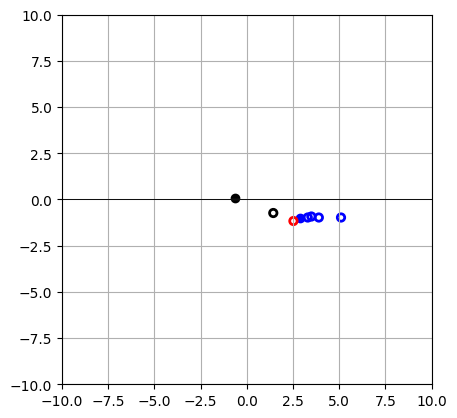

ACTION: [0.12478232 0.        ]


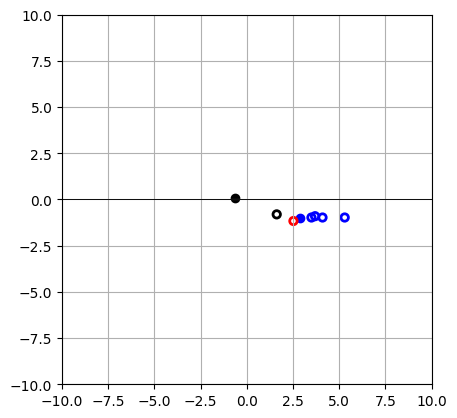

ACTION: [0. 0.]


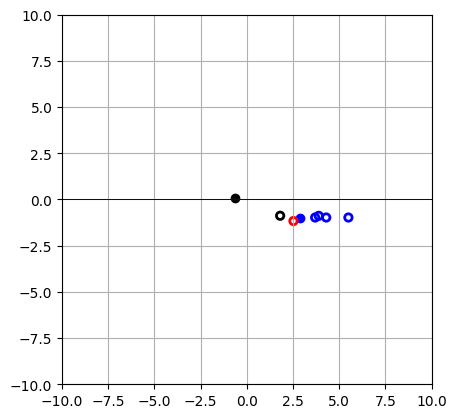

ACTION: [0.         0.41866088]


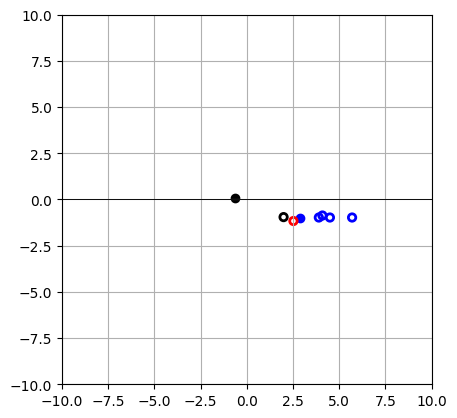

ACTION: [0.15371607 0.04117969]


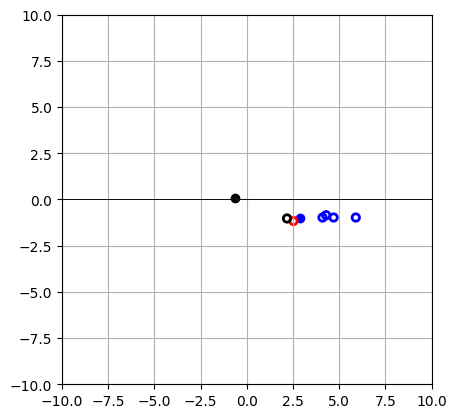

ACTION: [0. 0.]


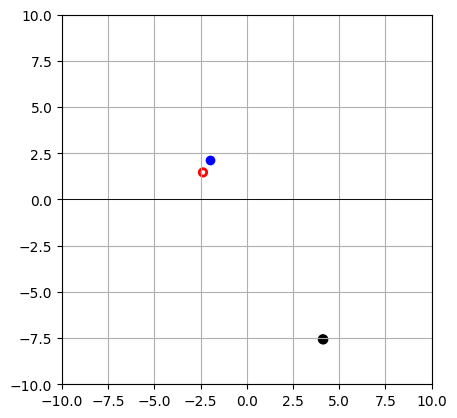

ACTION: [0.         0.76680624]


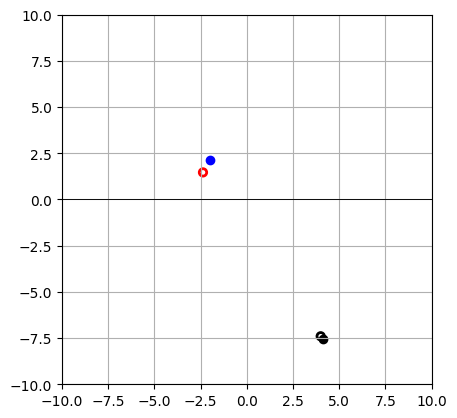

ACTION: [1.         0.15101099]


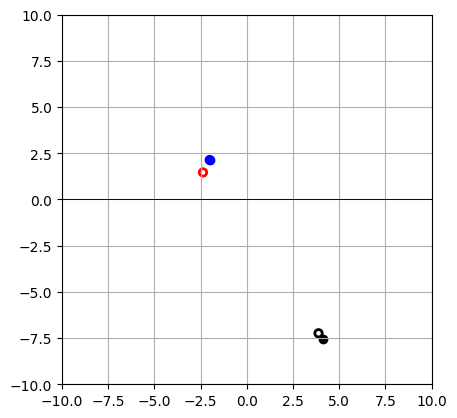

ACTION: [0. 0.]


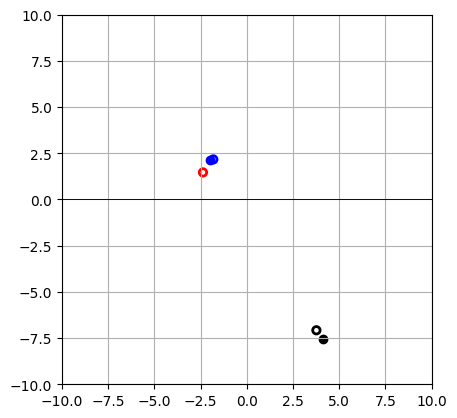

ACTION: [0.        1.3204004]


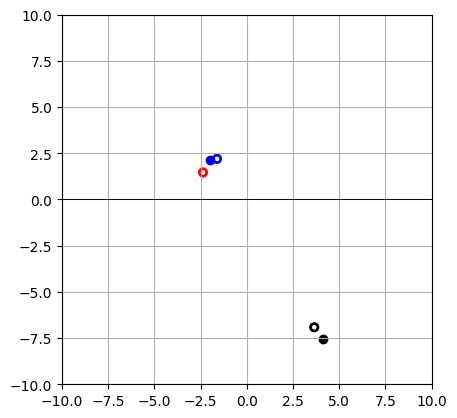

ACTION: [0.09436518 0.        ]


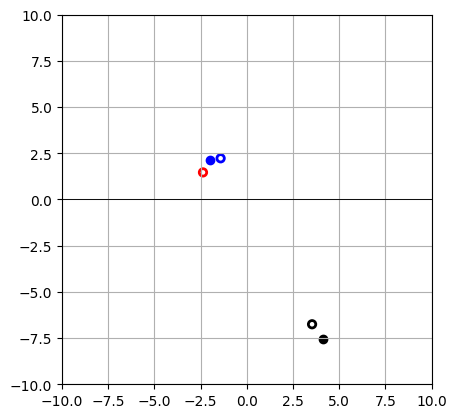

ACTION: [0.6589393 0.       ]


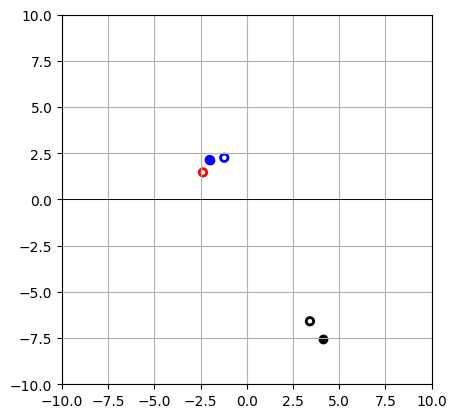

ACTION: [0. 0.]


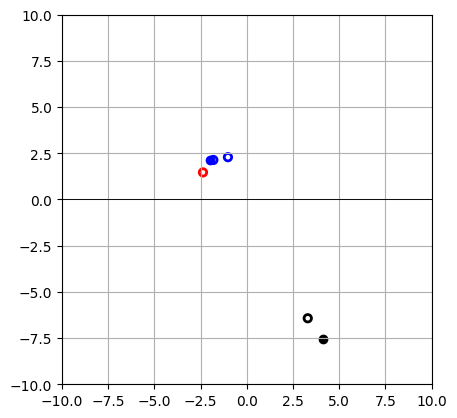

ACTION: [0. 0.]


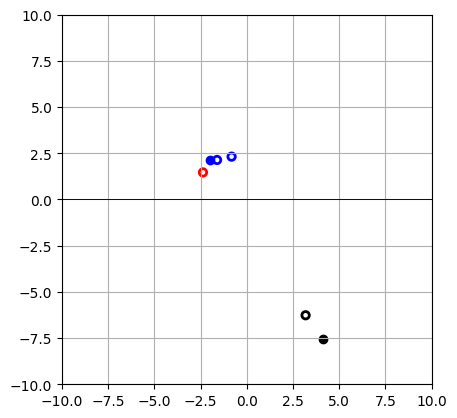

ACTION: [0. 0.]


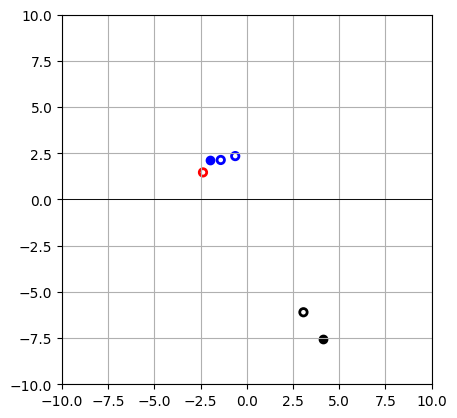

ACTION: [0. 0.]


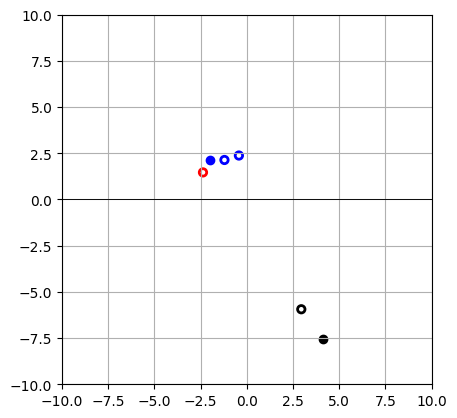

ACTION: [1. 0.]


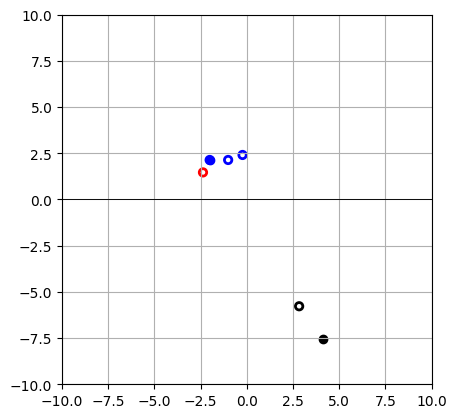

ACTION: [0.2415494 0.       ]


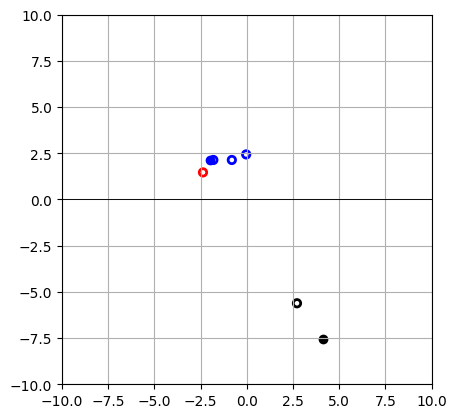

ACTION: [1. 0.]


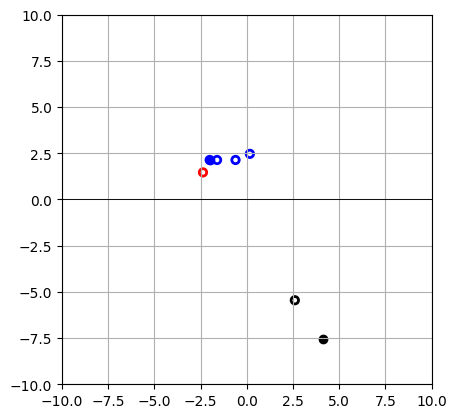

ACTION: [0.         0.60675144]


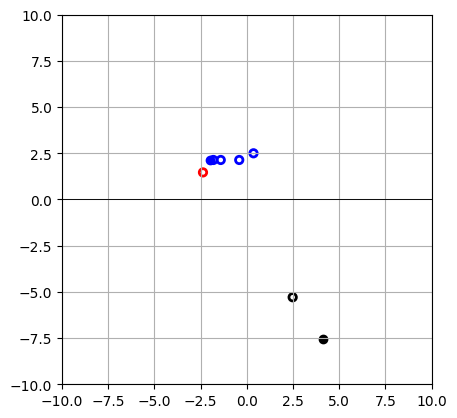

ACTION: [0.03204336 0.        ]


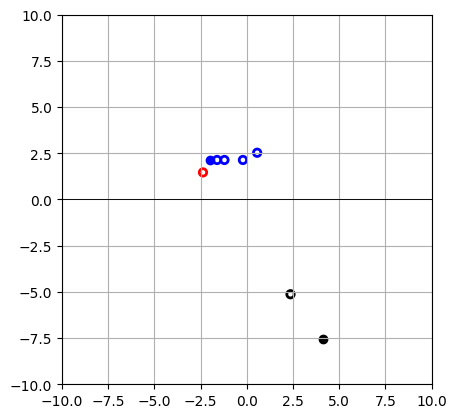

ACTION: [0. 0.]


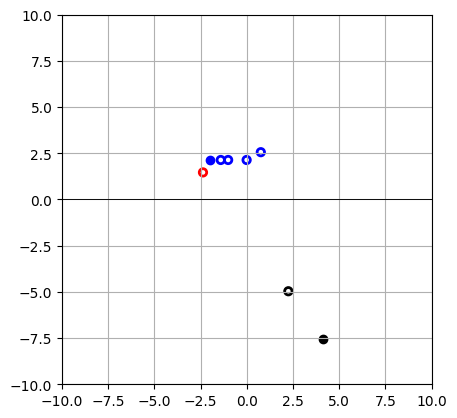

ACTION: [0.43273526 0.        ]


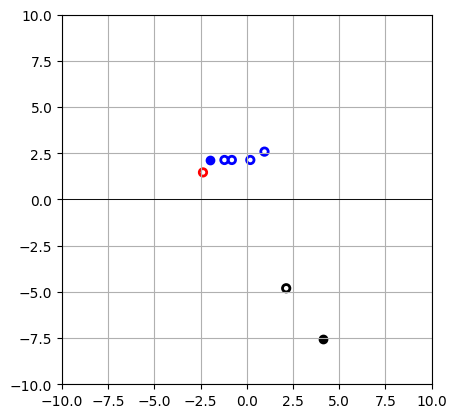

ACTION: [0.        1.1047691]


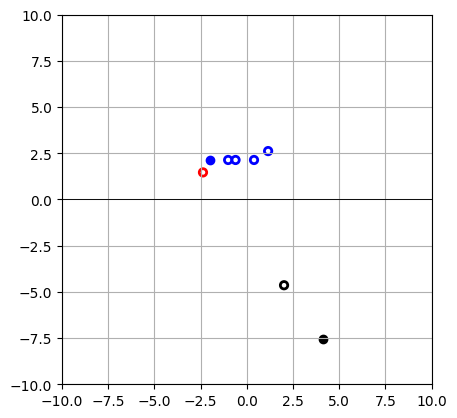

ACTION: [0.49735653 0.9863904 ]


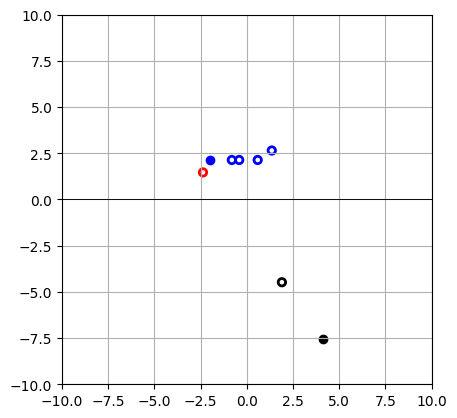

ACTION: [0.        0.8656748]


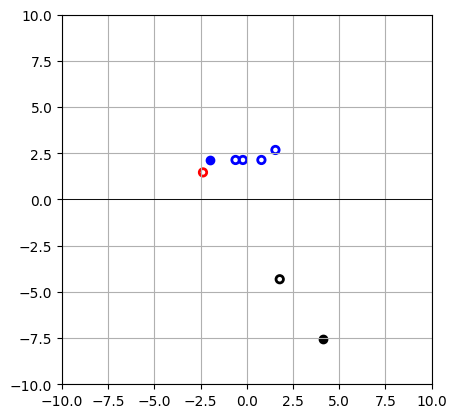

ACTION: [0.86398804 0.3782466 ]


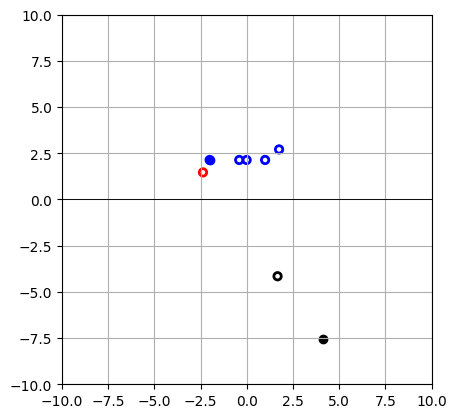

ACTION: [0.8500657 0.       ]


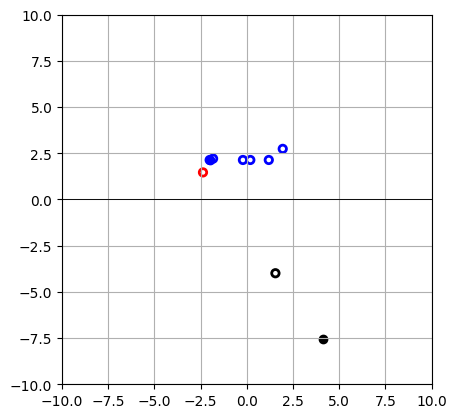

ACTION: [0.       1.333306]


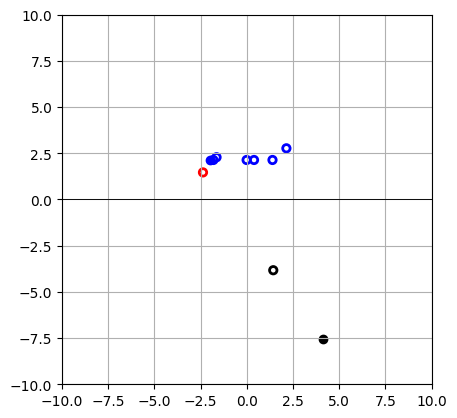

ACTION: [0.41612095 0.54171556]


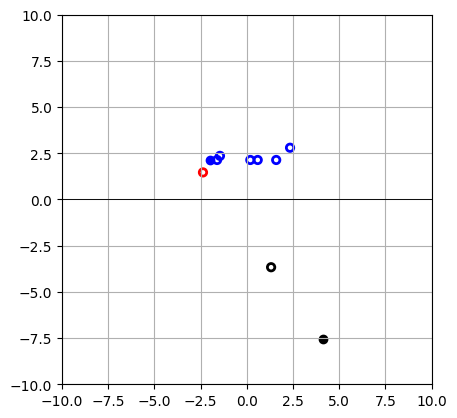

ACTION: [0.51648355 1.1257273 ]


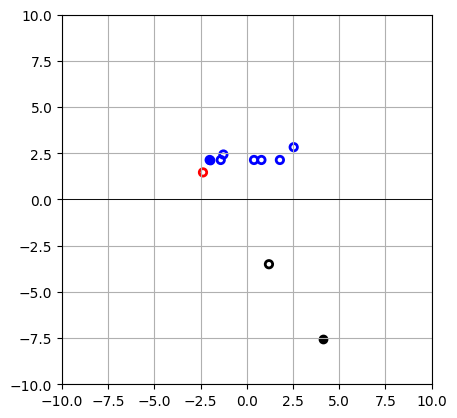

ACTION: [0. 0.]


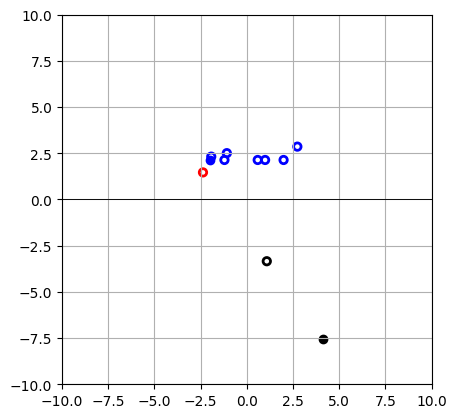

ACTION: [0.0645725 1.0312523]


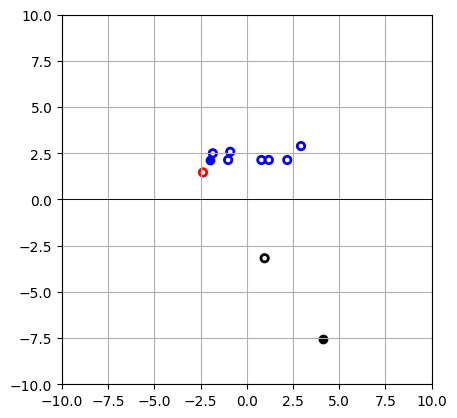

ACTION: [0.         0.66838026]


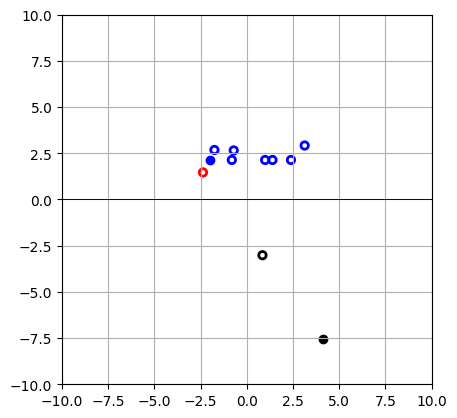

ACTION: [0.        1.1786777]


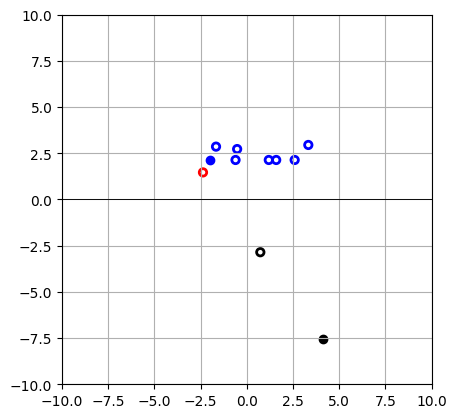

ACTION: [0.        0.6445265]


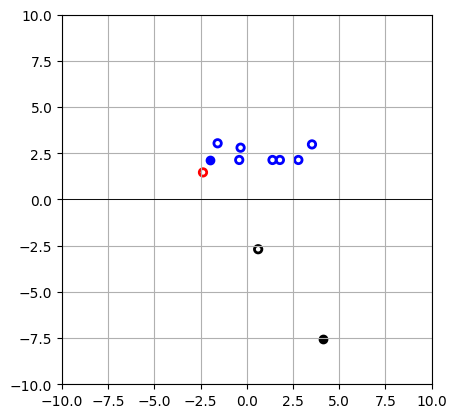

ACTION: [0.         0.76668096]


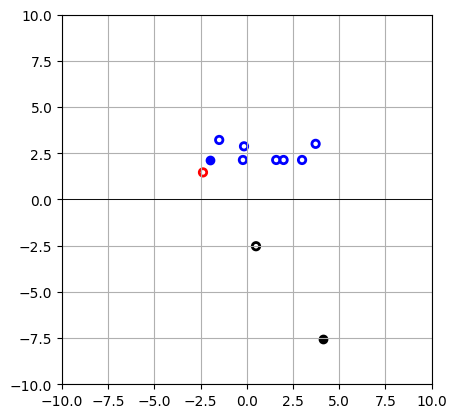

ACTION: [0.5445739  0.43143243]


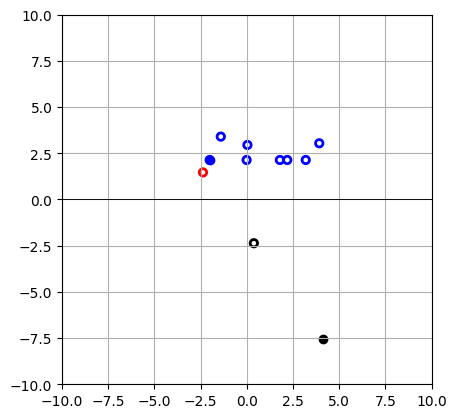

ACTION: [0.        0.6373369]


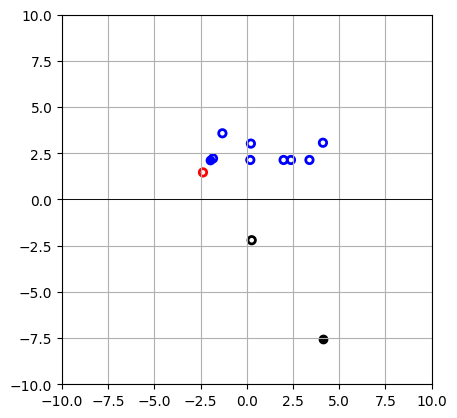

ACTION: [0.37961113 1.4280827 ]


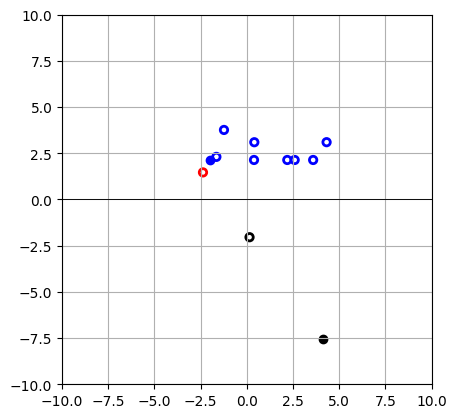

ACTION: [0. 0.]


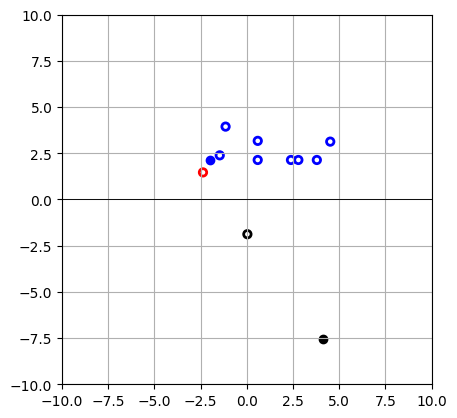

ACTION: [0.        0.6219408]


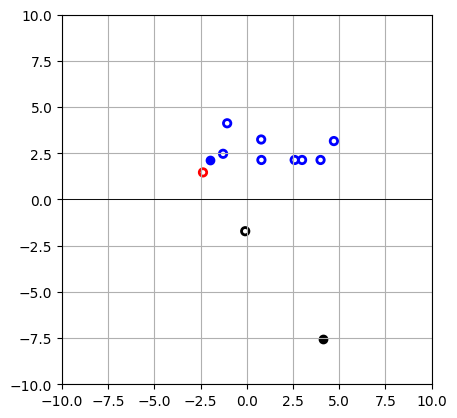

ACTION: [0.8383181 0.       ]


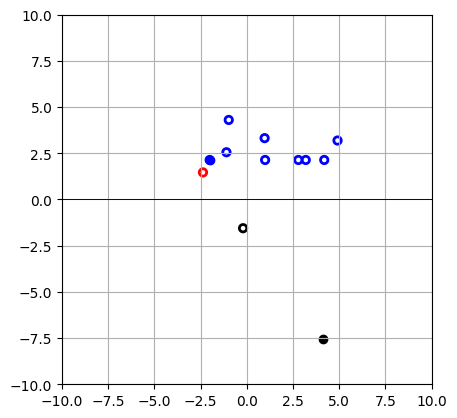

ACTION: [0. 0.]


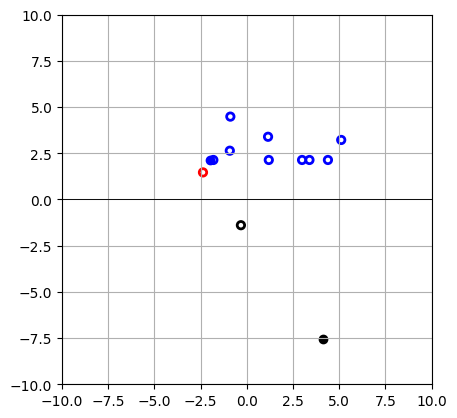

ACTION: [0.        0.6925921]


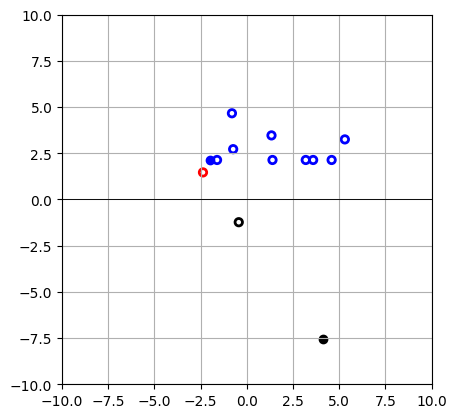

ACTION: [0.0461407 0.       ]


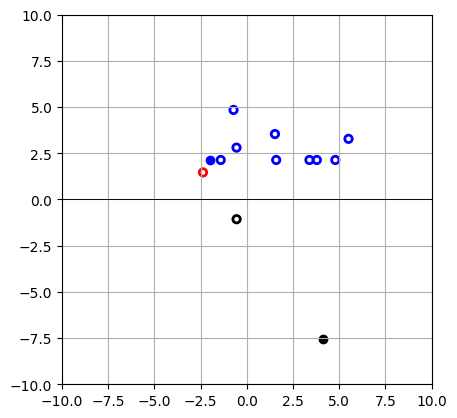

ACTION: [1. 0.]


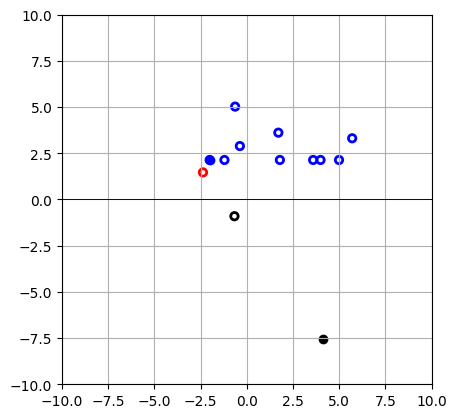

ACTION: [0.89965063 0.1281267 ]


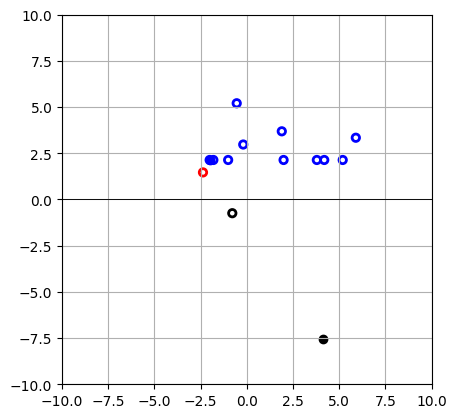

ACTION: [0. 0.]


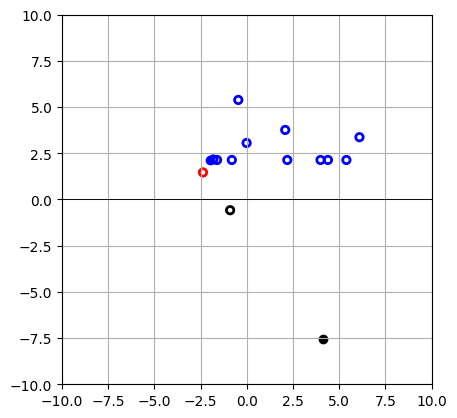

ACTION: [0.7482167 0.3047722]


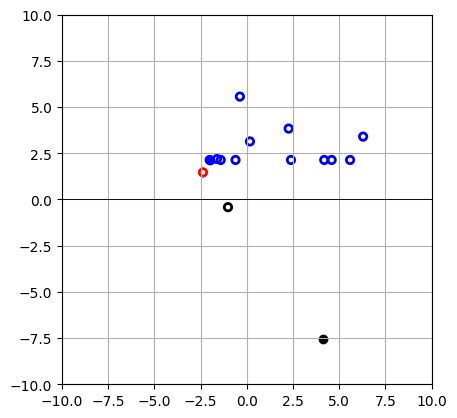

ACTION: [1.        0.2007814]


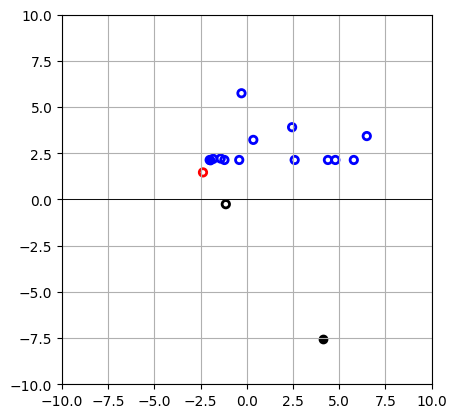

ACTION: [0.32177246 0.6353102 ]


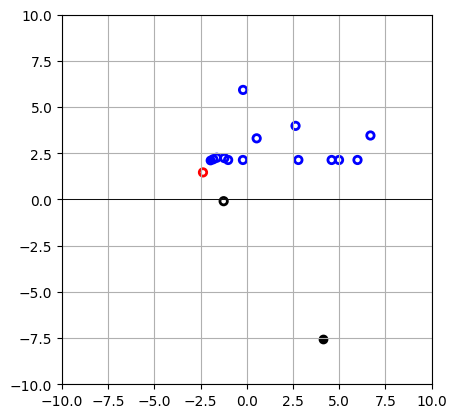

ACTION: [0. 0.]


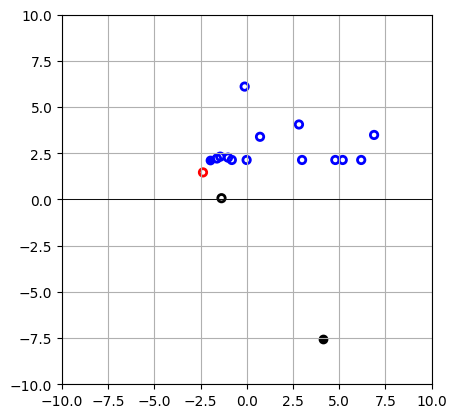

ACTION: [0.         0.56102383]


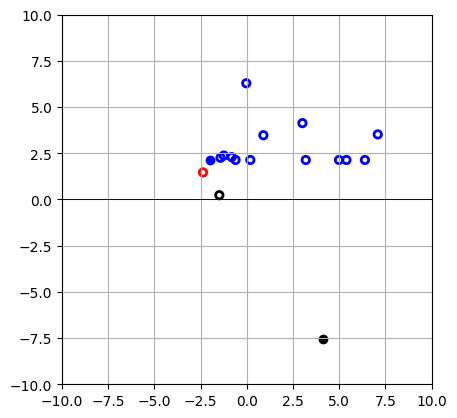

ACTION: [0.85957783 0.        ]


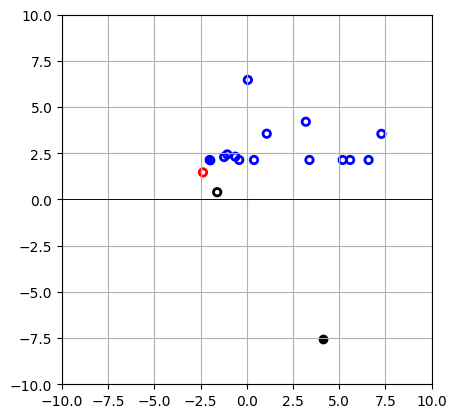

ACTION: [0. 0.]


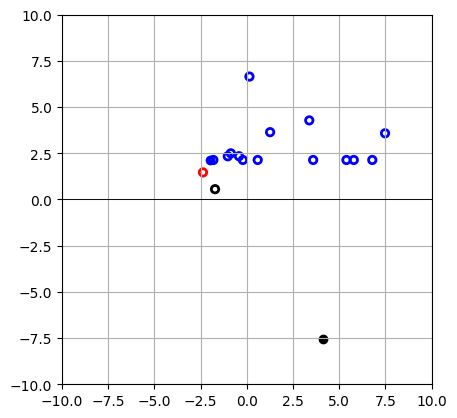

ACTION: [1. 0.]


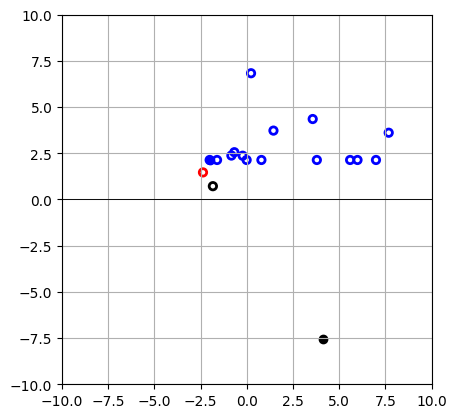

ACTION: [0.6919014 0.       ]


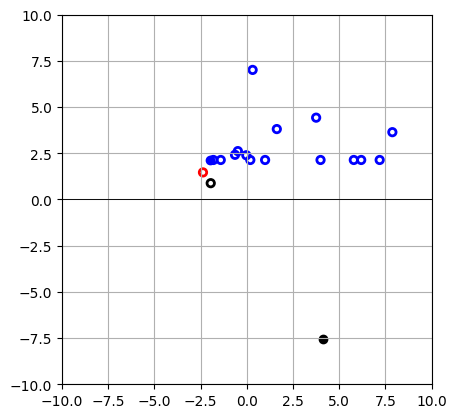

ACTION: [0.        1.2086056]


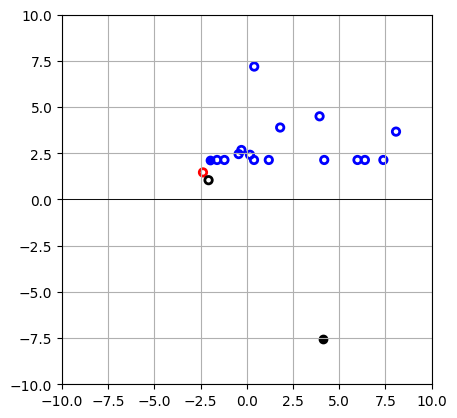

ACTION: [1.         0.12439386]


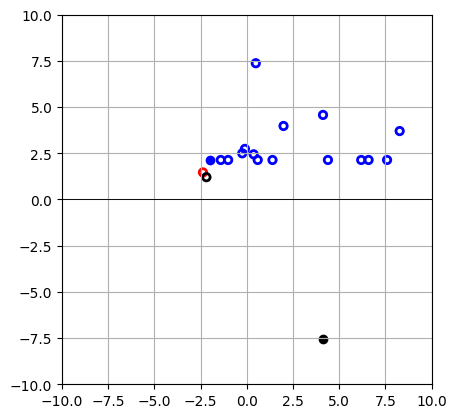

ACTION: [0. 0.]


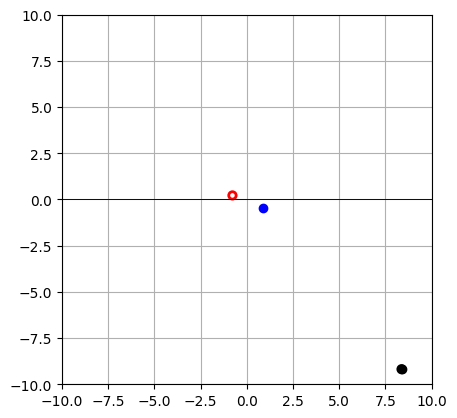

ACTION: [0.         0.09760056]


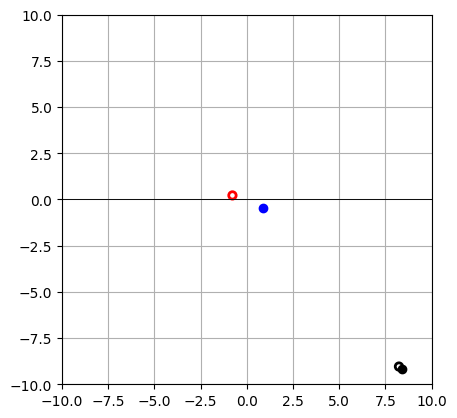

ACTION: [0.2647771 0.       ]


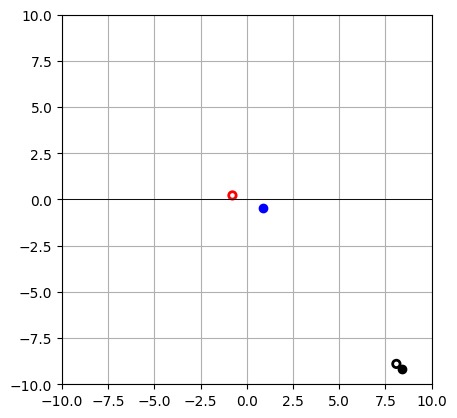

ACTION: [0.        0.5014574]


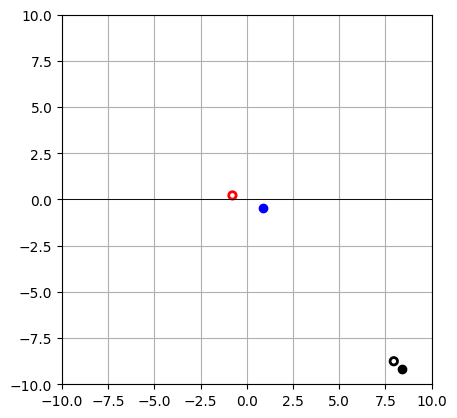

ACTION: [0.        1.7955785]


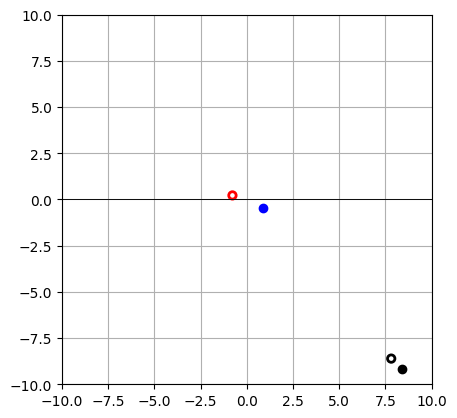

ACTION: [0. 0.]


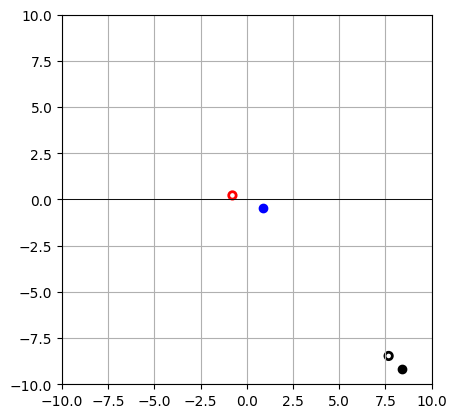

ACTION: [0.        1.1296647]


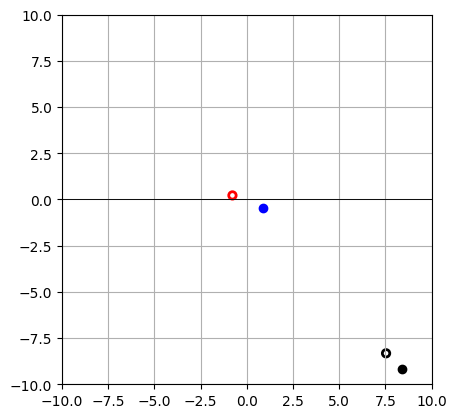

ACTION: [0.36544138 0.        ]


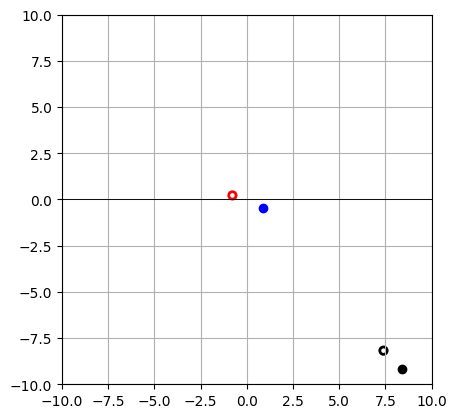

ACTION: [0. 0.]


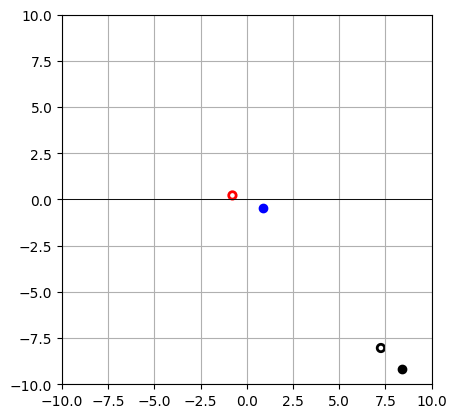

ACTION: [0. 0.]


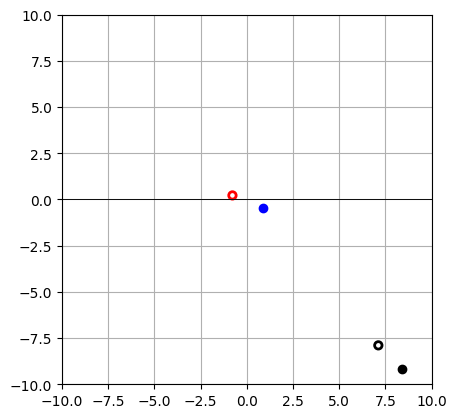

ACTION: [0.87520474 0.5813237 ]


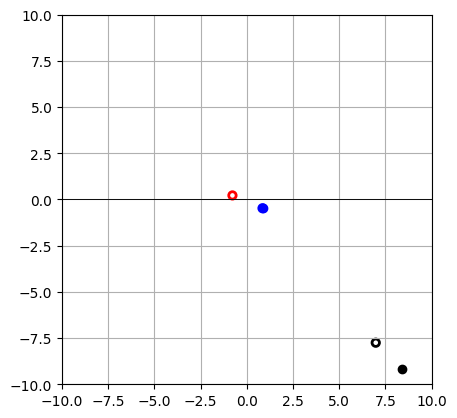

ACTION: [0.         0.57569957]


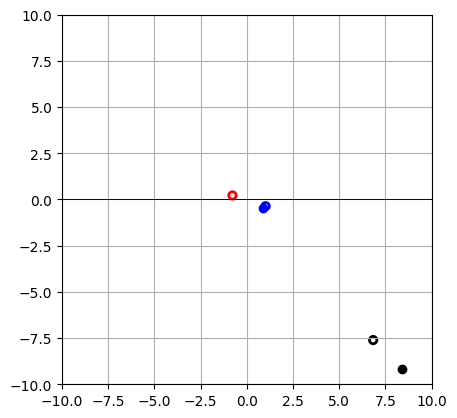

ACTION: [0.        1.3875275]


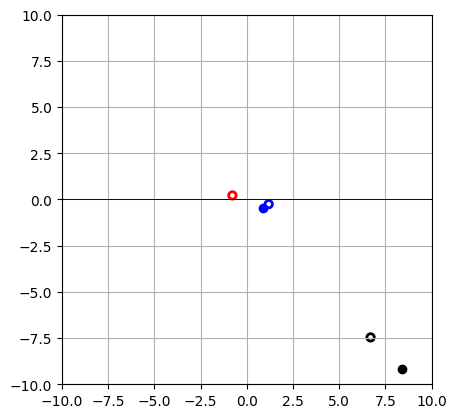

ACTION: [0.04405671 0.        ]


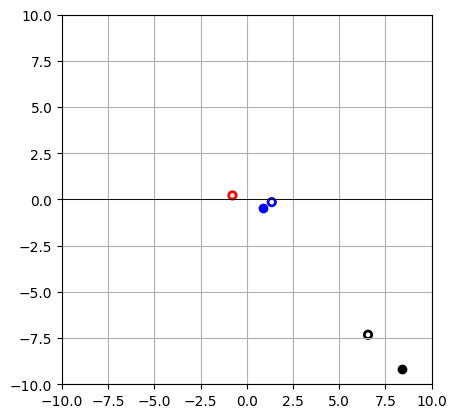

ACTION: [0.72667503 0.        ]


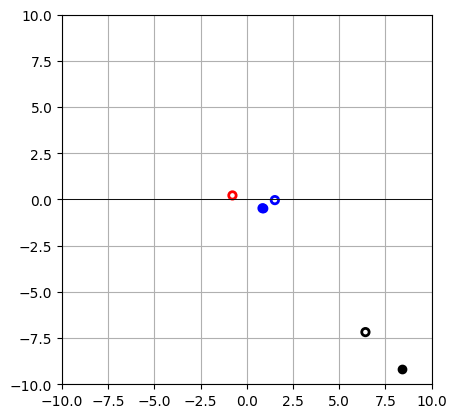

ACTION: [0.        0.5949213]


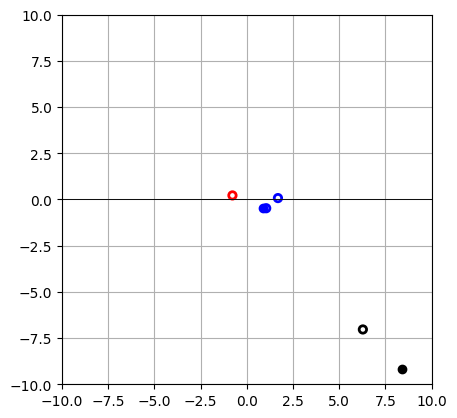

ACTION: [0.        1.6270235]


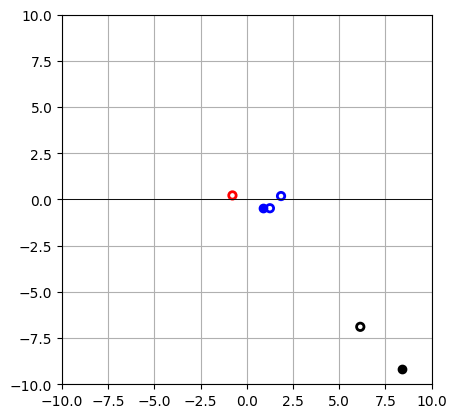

ACTION: [0.        1.6504638]


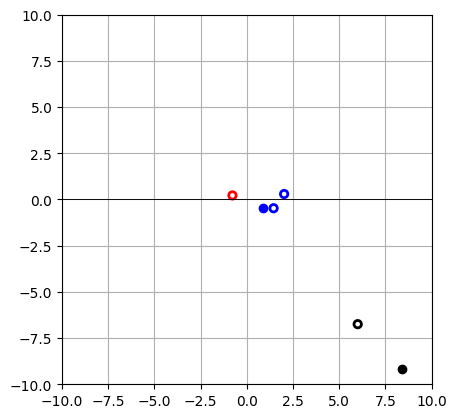

ACTION: [1.        1.3364291]


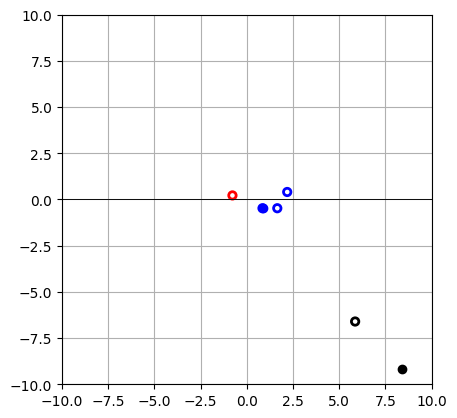

ACTION: [0. 0.]


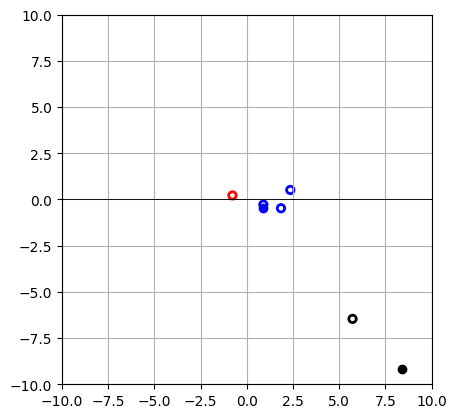

ACTION: [0.07645048 0.        ]


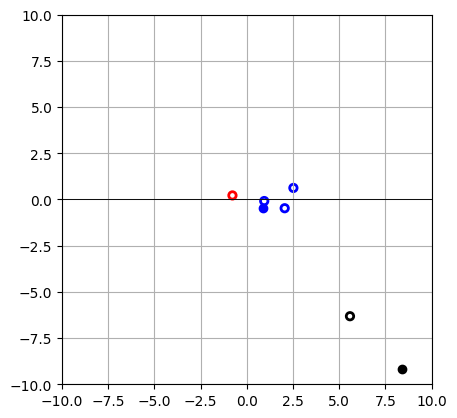

ACTION: [0.5364523 0.       ]


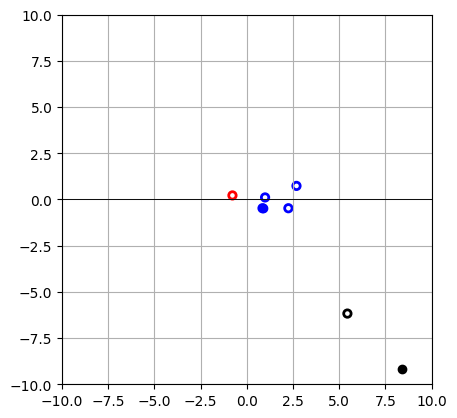

ACTION: [0. 0.]


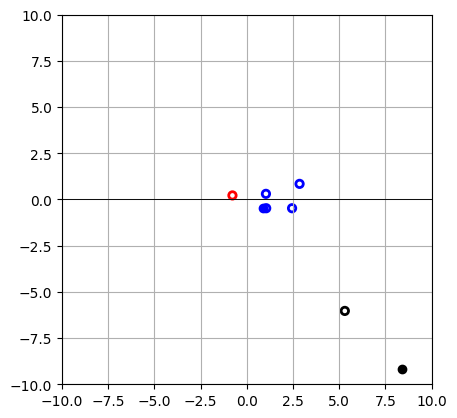

ACTION: [1.         0.47965592]


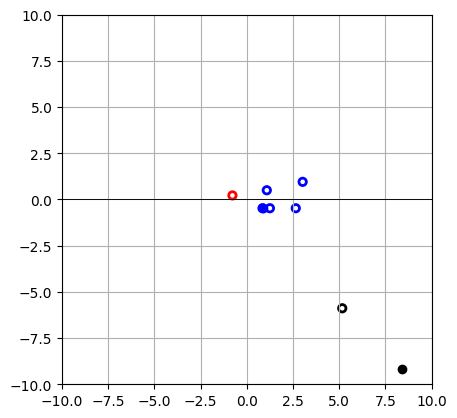

ACTION: [0.37666225 0.        ]


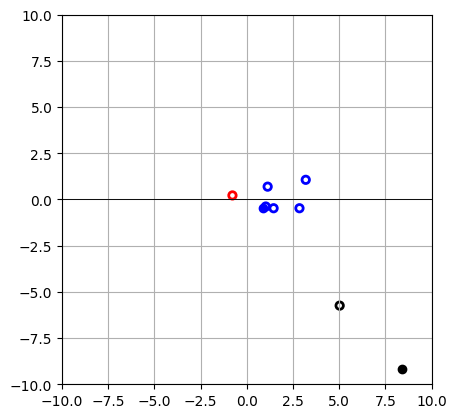

ACTION: [0.06381756 1.152181  ]


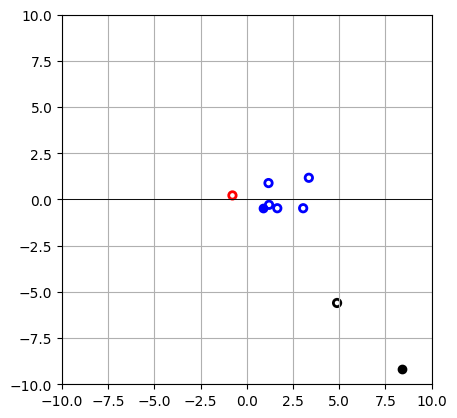

ACTION: [0. 0.]


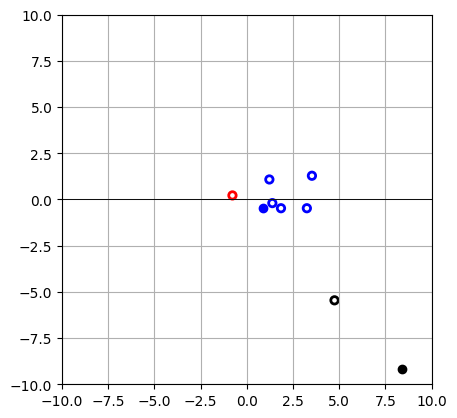

ACTION: [0. 0.]


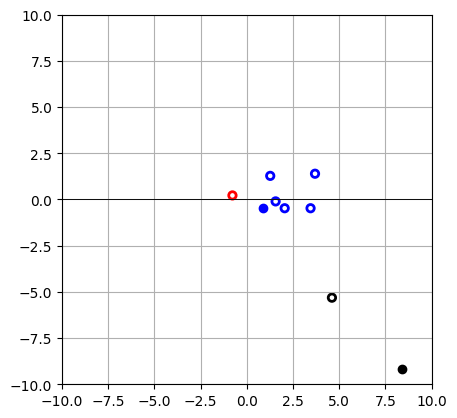

ACTION: [0.28851122 0.        ]


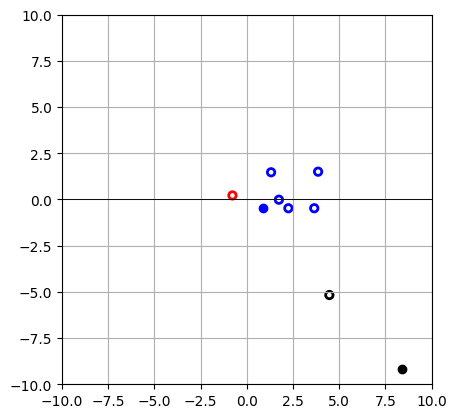

ACTION: [0.53004134 0.6591378 ]


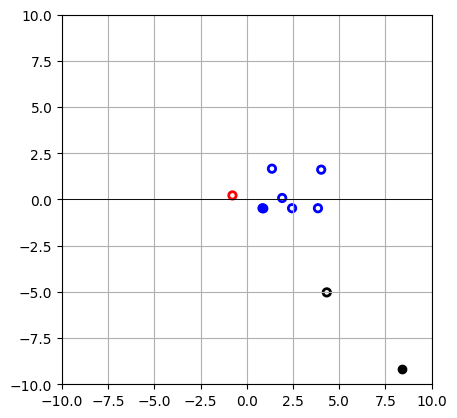

ACTION: [0. 0.]


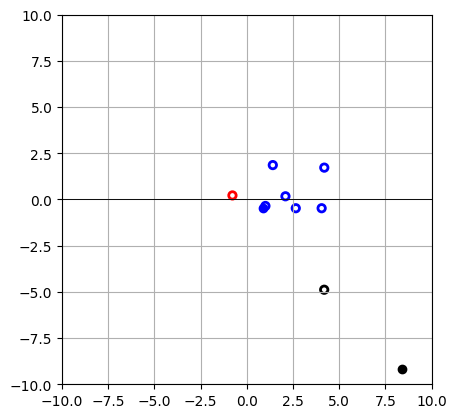

ACTION: [0.24767476 0.        ]


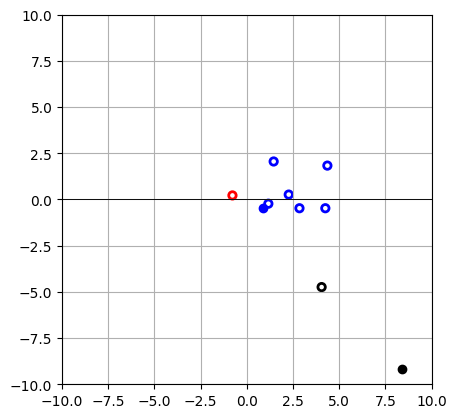

ACTION: [0. 0.]


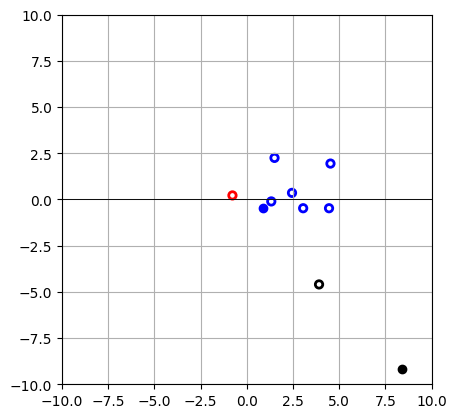

ACTION: [0.        0.9563903]


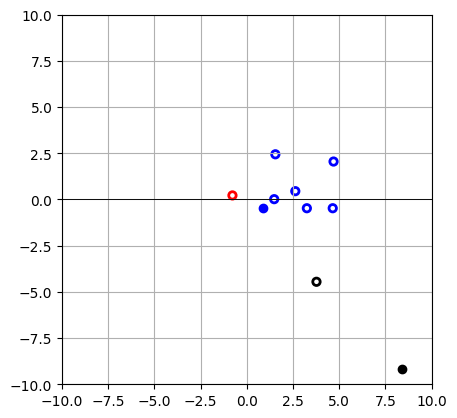

ACTION: [0. 0.]


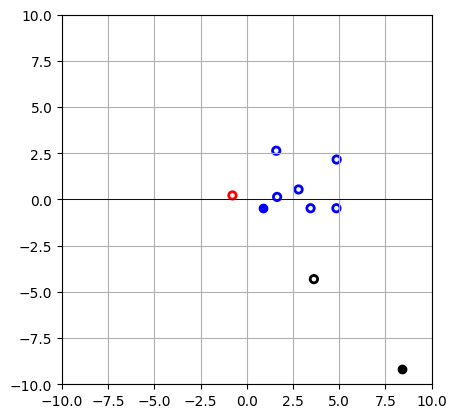

ACTION: [0.        1.0283319]


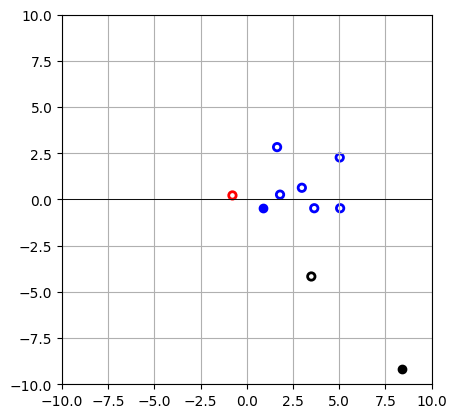

ACTION: [1. 0.]


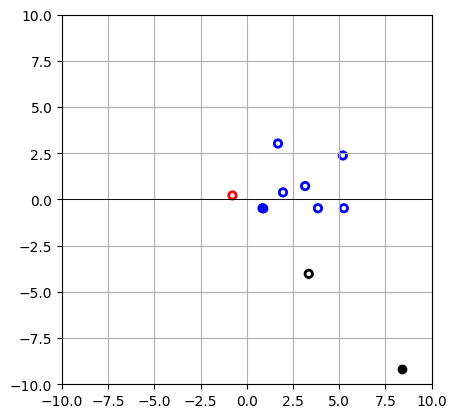

ACTION: [0.3173707 0.       ]


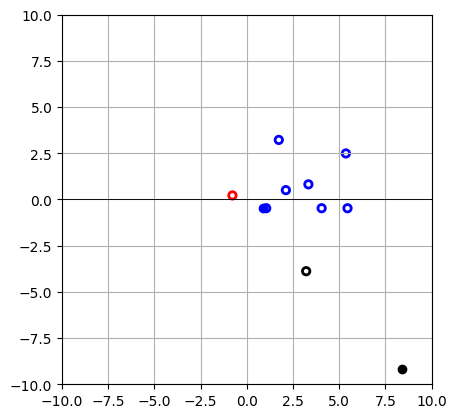

ACTION: [0. 0.]


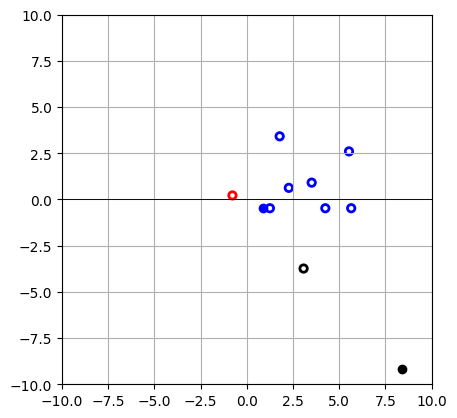

ACTION: [0.        1.0510488]


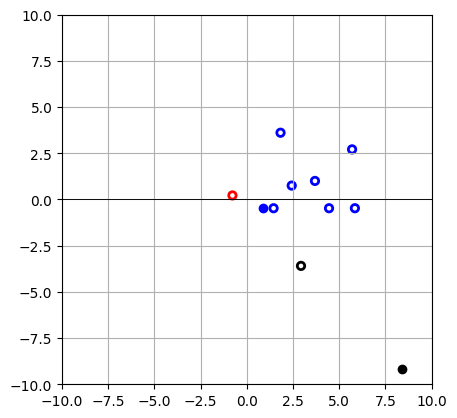

ACTION: [0.         0.02421717]


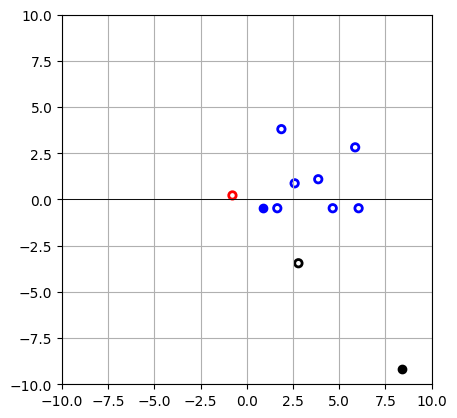

ACTION: [0.30283216 0.75295097]


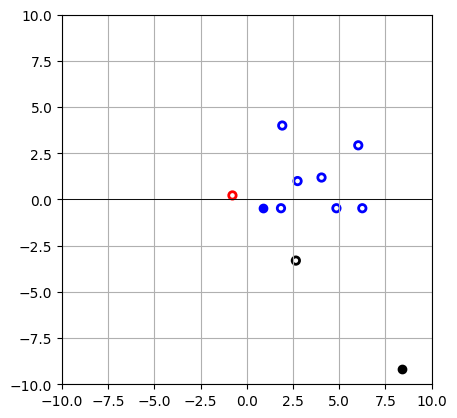

ACTION: [0.7616336 0.       ]


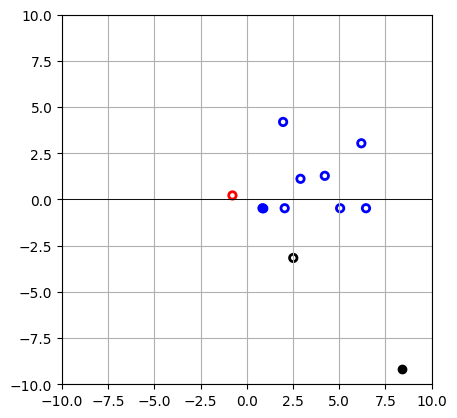

ACTION: [0. 0.]


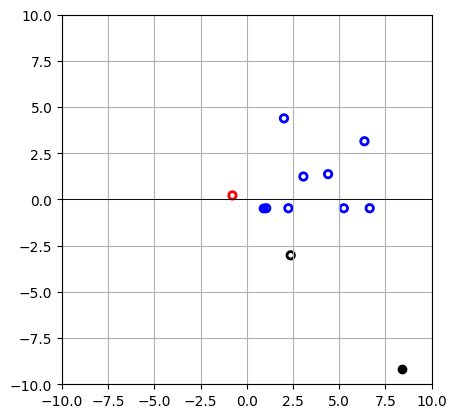

ACTION: [0.39952013 0.        ]


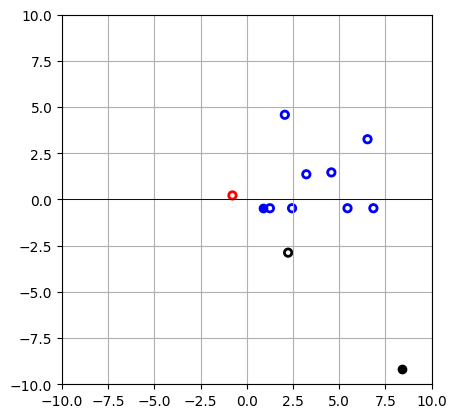

ACTION: [0.        1.4982333]


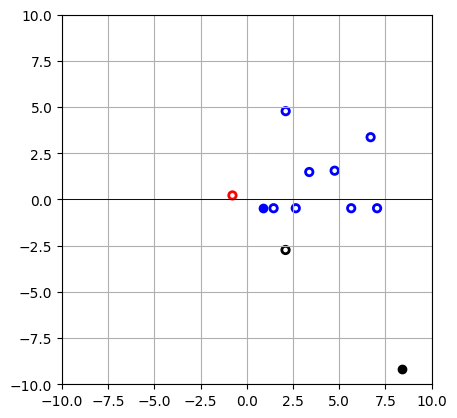

ACTION: [0. 0.]


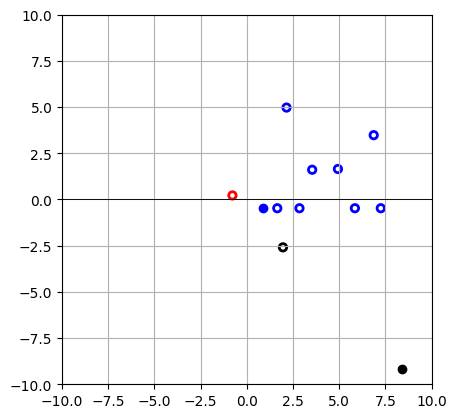

ACTION: [1.        0.6219965]


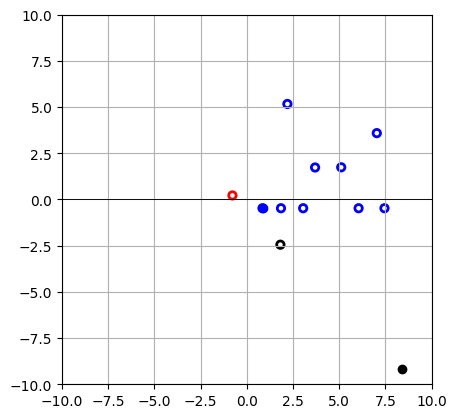

ACTION: [0.        0.5535983]


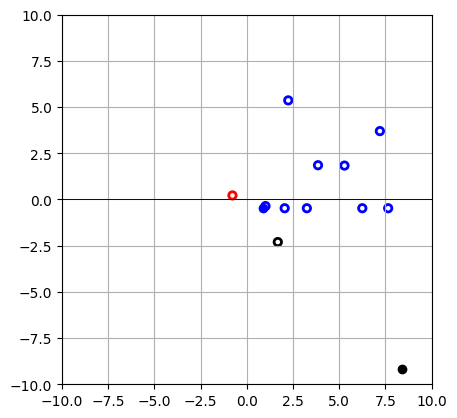

ACTION: [0.58476317 1.2208335 ]


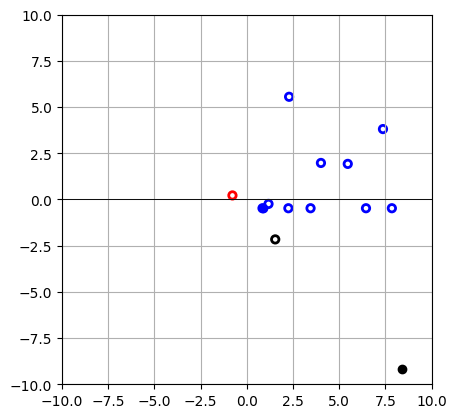

ACTION: [0.         0.08701146]


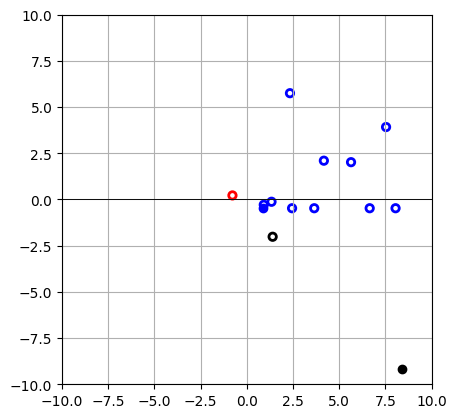

ACTION: [0.8601957 1.3805227]


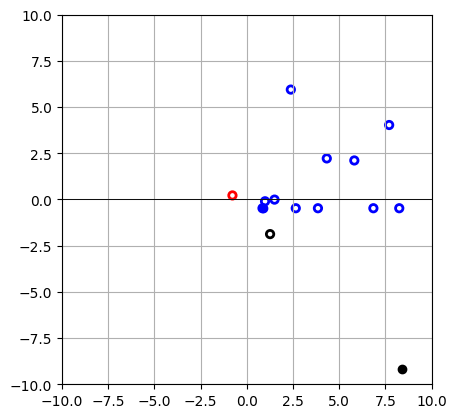

ACTION: [1.        1.8617767]


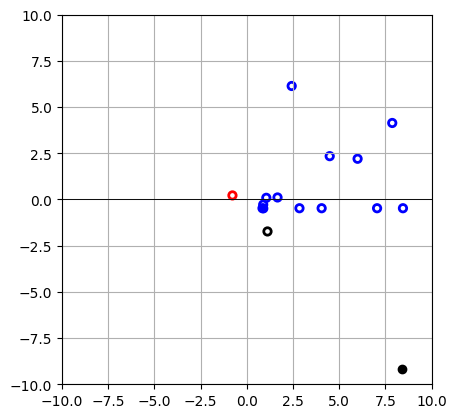

ACTION: [1. 0.]


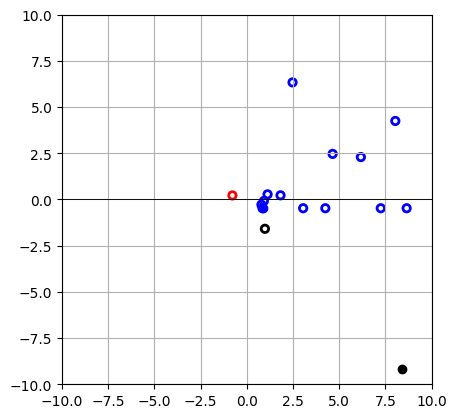

ACTION: [0.        0.2665413]


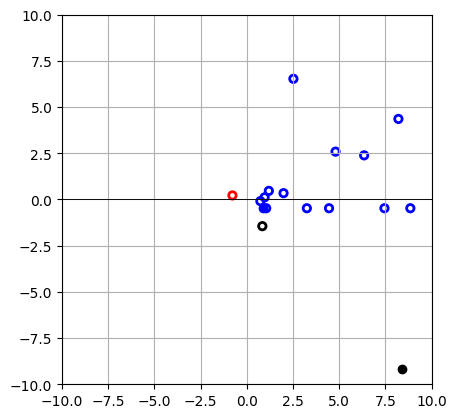

ACTION: [0. 0.]


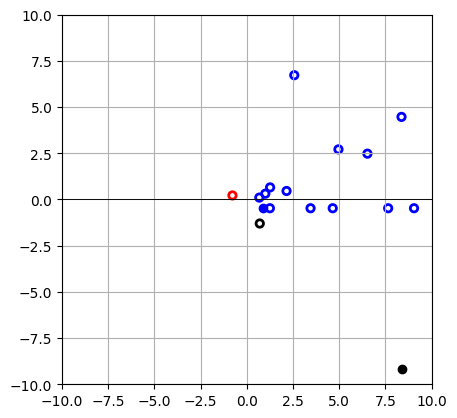

ACTION: [0.        0.5482013]


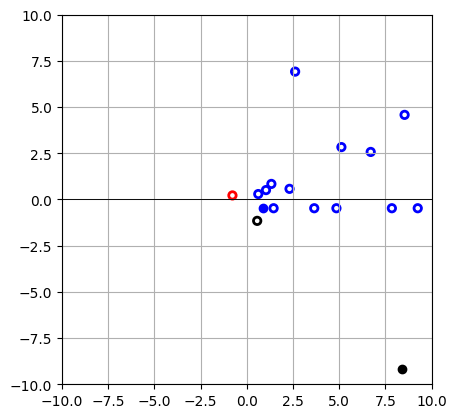

ACTION: [0.         0.36820135]


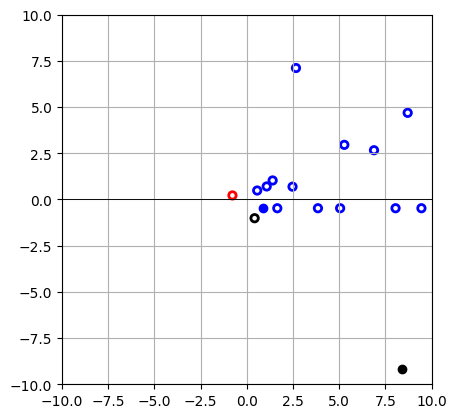

ACTION: [0. 0.]


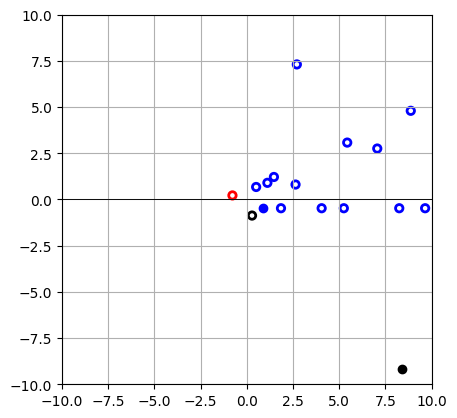

ACTION: [0.07918277 0.        ]


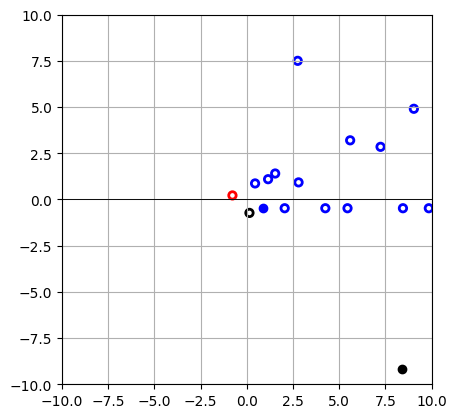

ACTION: [0.         0.34934703]


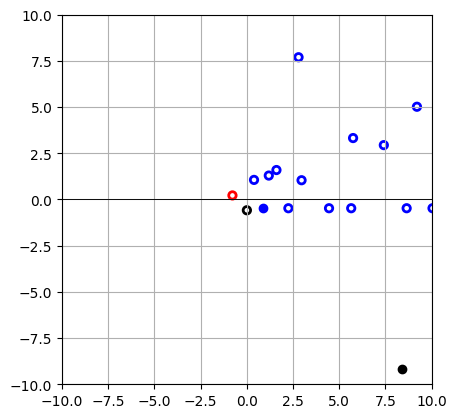

ACTION: [0.85089725 0.        ]


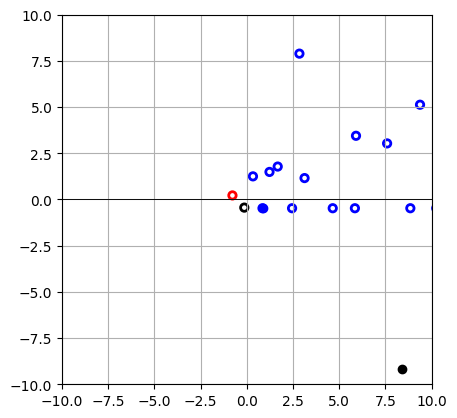

ACTION: [0. 0.]


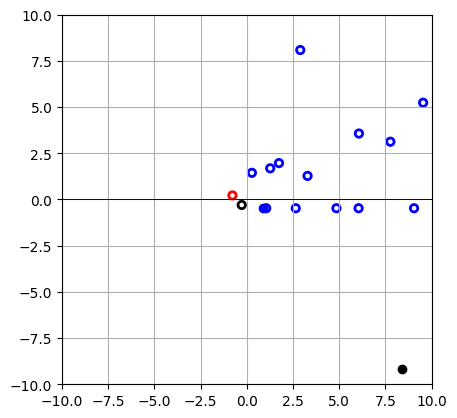

ACTION: [0.55953044 0.        ]


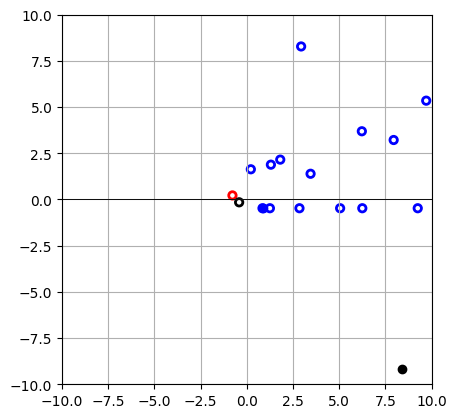

ACTION: [0.44761974 0.        ]


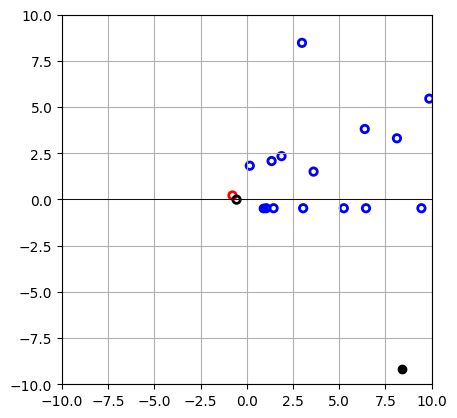

ACTION: [0. 0.]


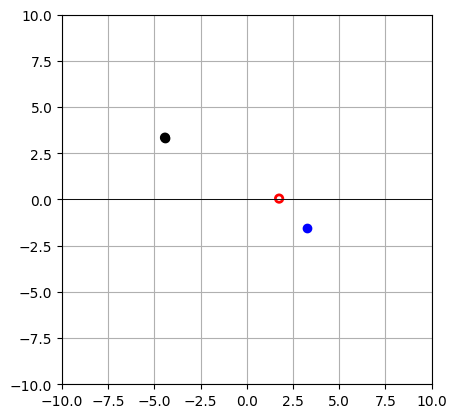

ACTION: [0.02849336 1.6643755 ]


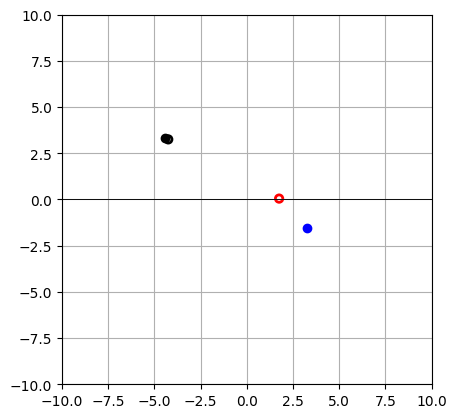

ACTION: [0.         0.15043025]


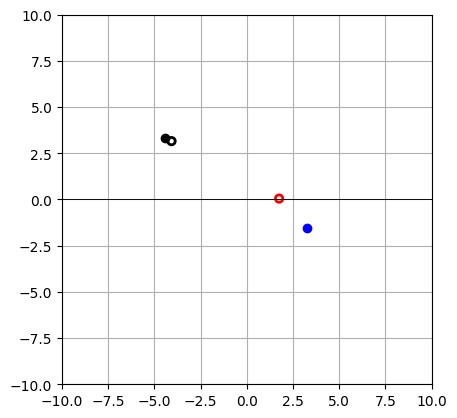

ACTION: [0. 0.]


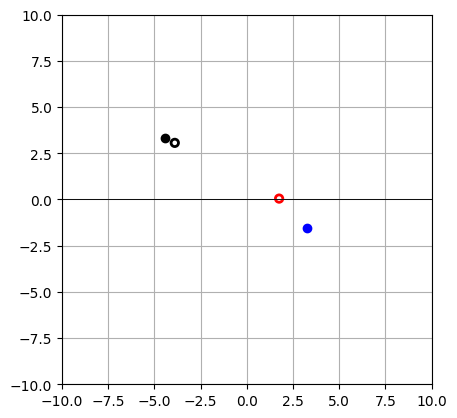

ACTION: [0.04029025 1.2163185 ]


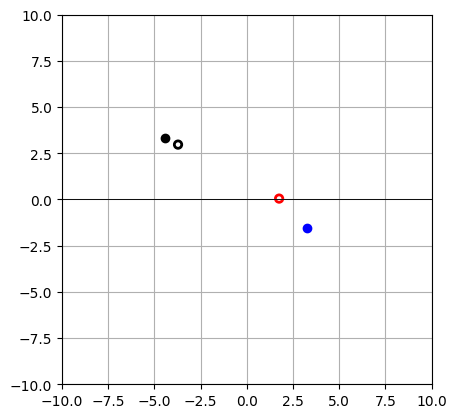

ACTION: [1.        1.5283481]


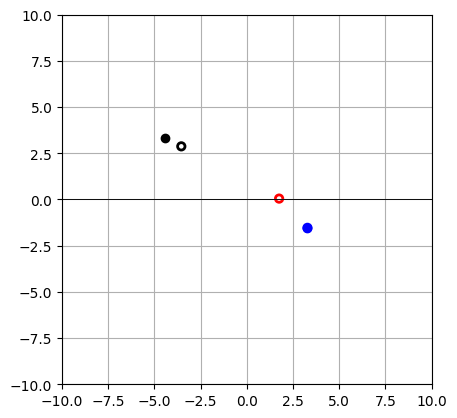

ACTION: [0.61204314 0.        ]


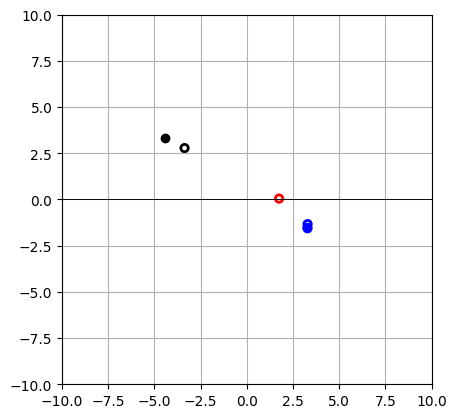

ACTION: [0. 0.]


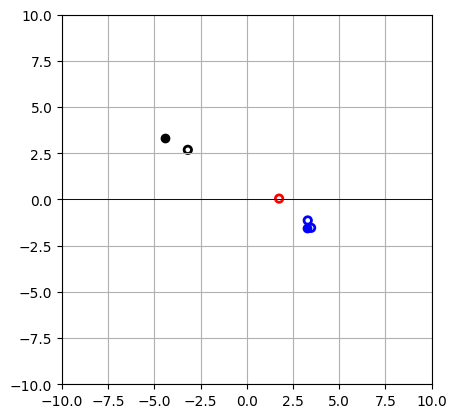

ACTION: [0.21346465 0.        ]


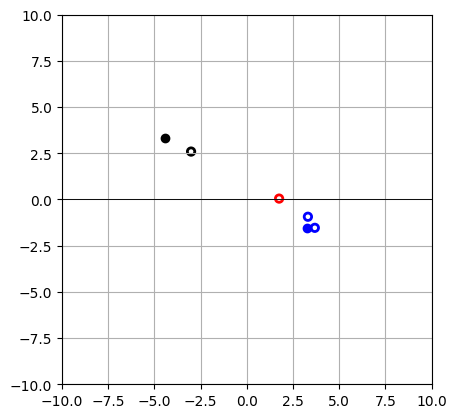

ACTION: [0. 0.]


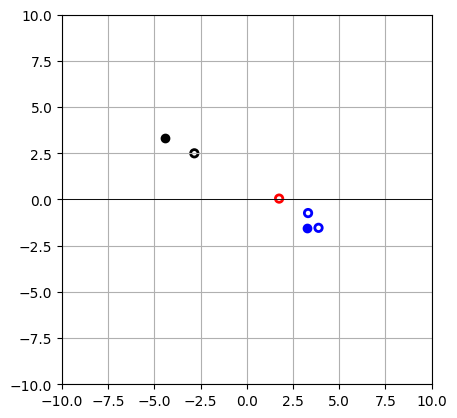

ACTION: [0.6619529 0.       ]


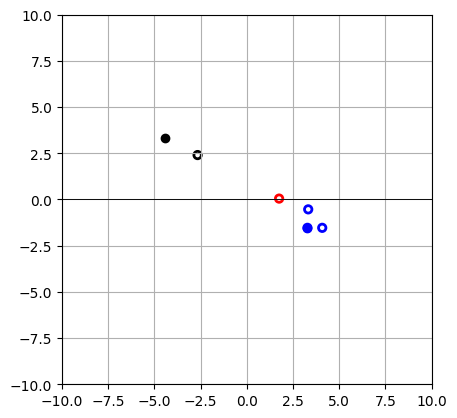

ACTION: [1. 0.]


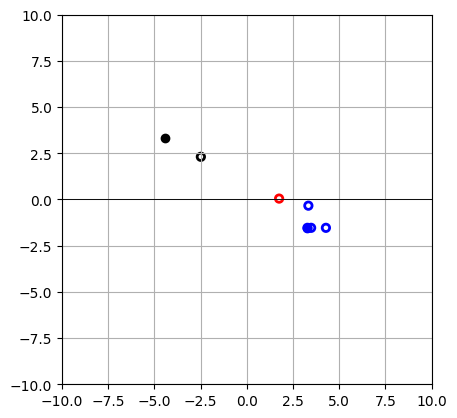

ACTION: [0. 0.]


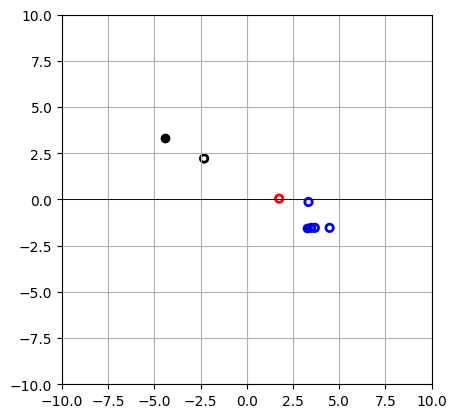

ACTION: [0.13491239 0.5707616 ]


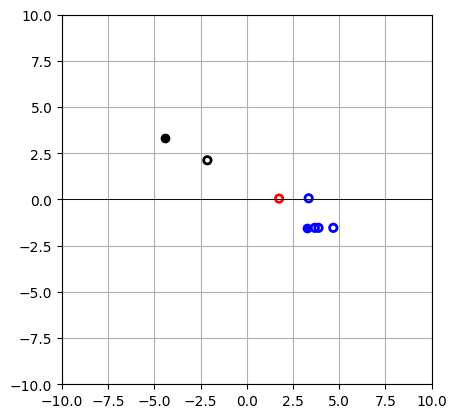

ACTION: [0.        1.4711965]


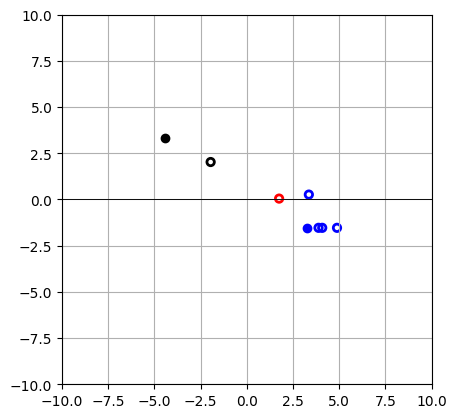

ACTION: [0. 0.]


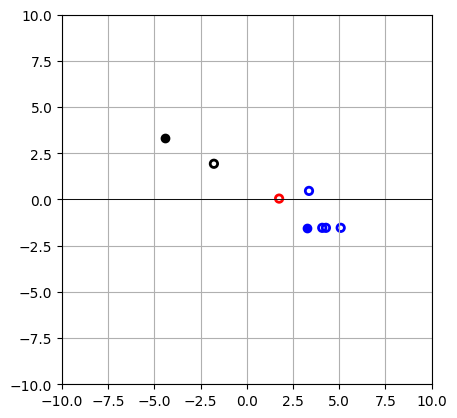

ACTION: [0. 0.]


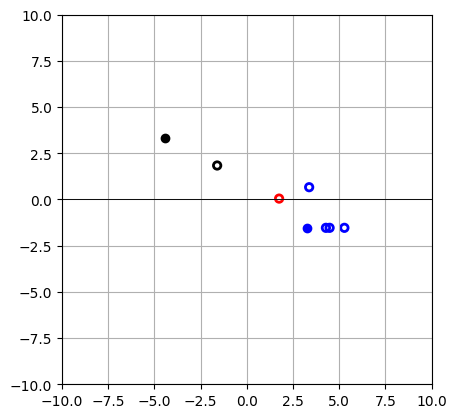

ACTION: [0. 0.]


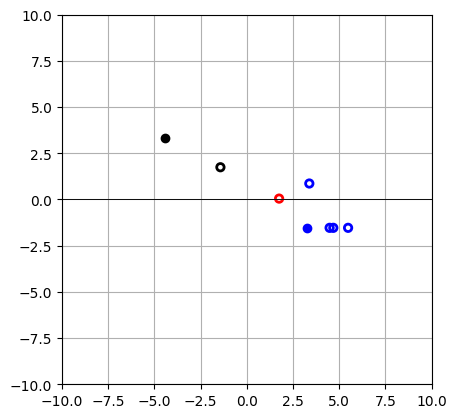

ACTION: [0.        1.9080318]


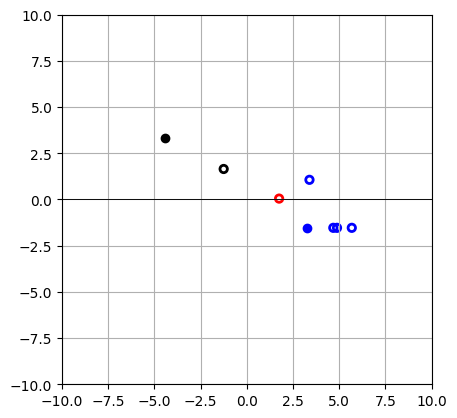

ACTION: [1. 0.]


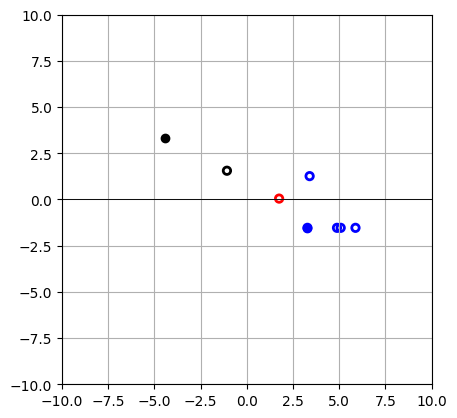

ACTION: [1.        0.4727017]


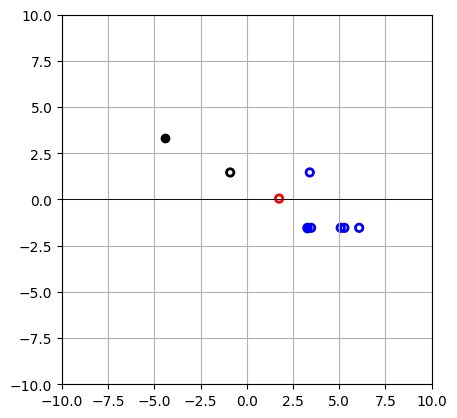

ACTION: [0.         0.28445223]


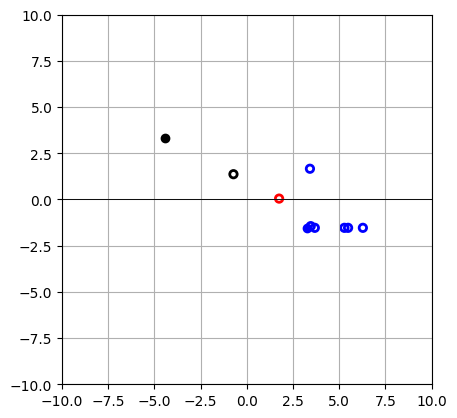

ACTION: [0.11973143 0.        ]


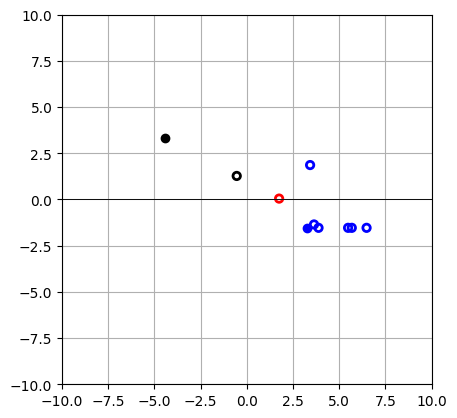

ACTION: [0.        1.3242103]


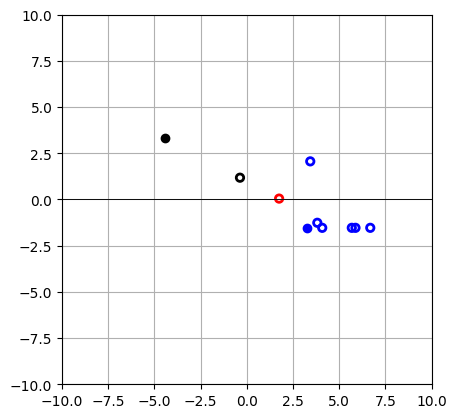

ACTION: [9.673072e-01 5.883216e-04]


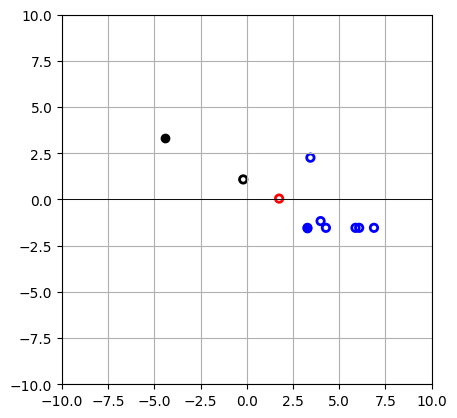

ACTION: [1. 0.]


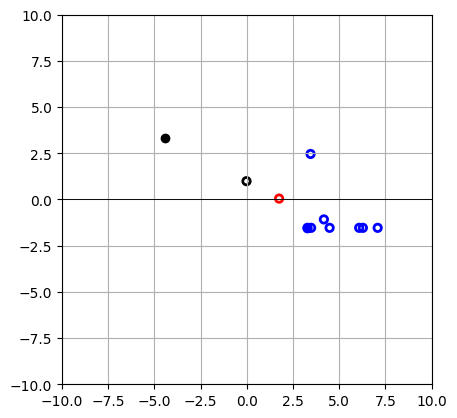

ACTION: [0. 0.]


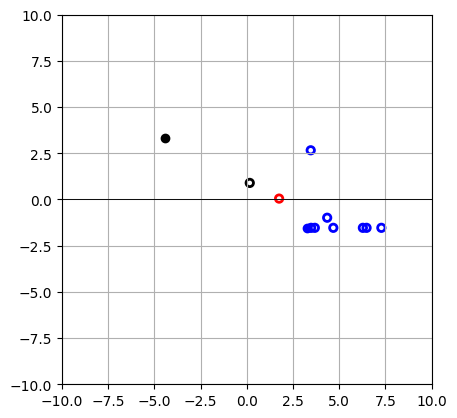

ACTION: [0. 0.]


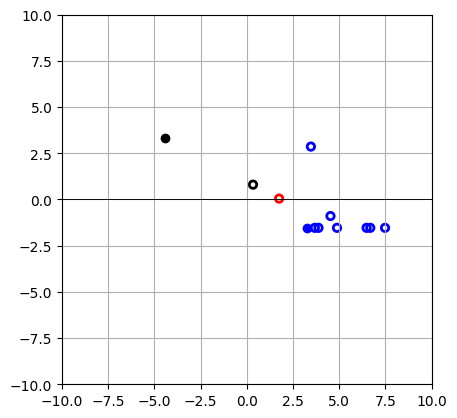

ACTION: [0.45419767 0.        ]


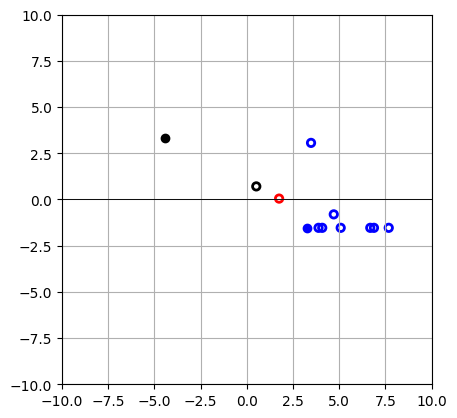

ACTION: [1.         0.11105884]


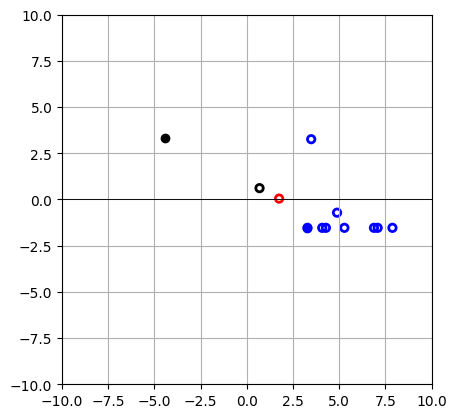

ACTION: [0.        1.7279614]


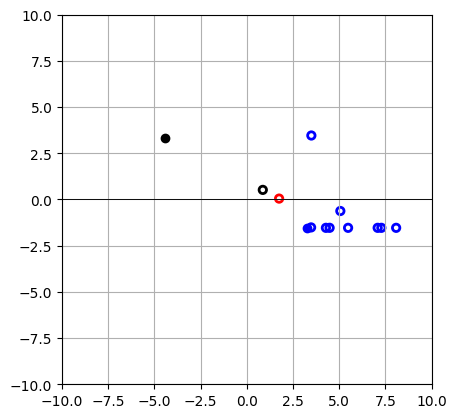

ACTION: [0.        1.8338428]


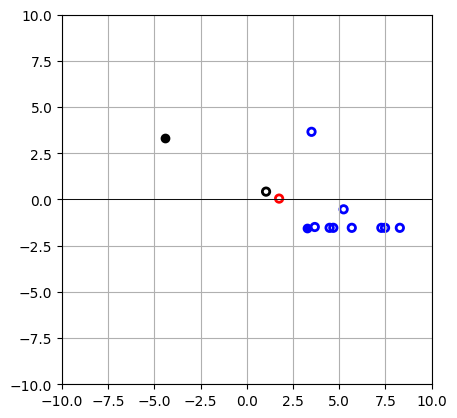

ACTION: [0.84862244 0.65501565]


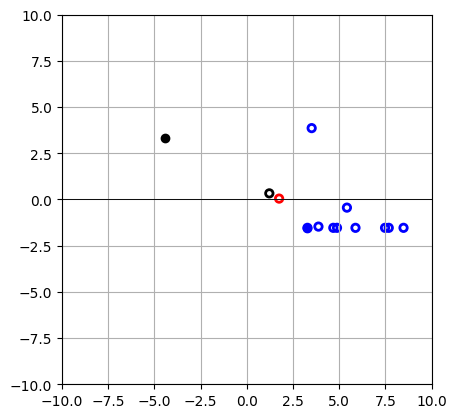

ACTION: [0. 0.]


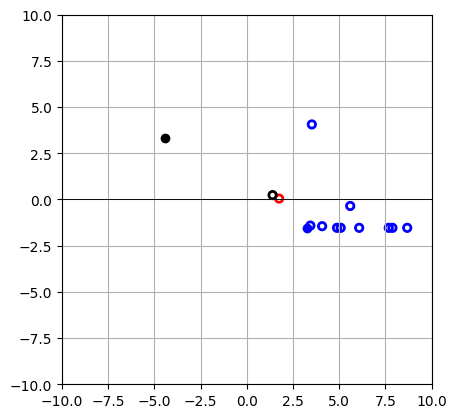

ACTION: [0.15488109 0.7067477 ]


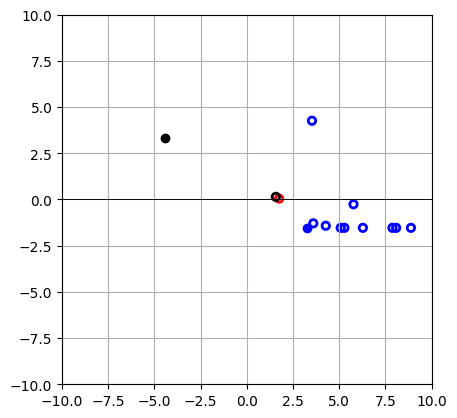

ACTION: [1. 0.]


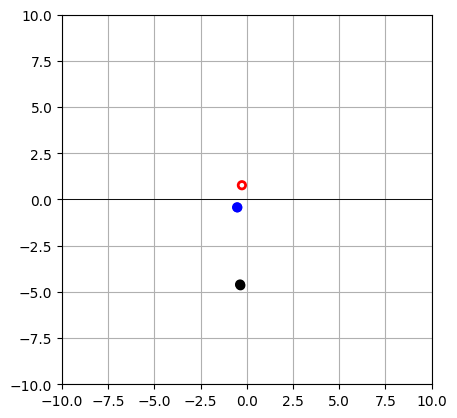

ACTION: [0. 0.]


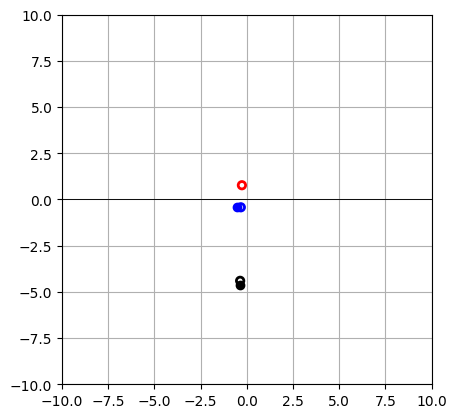

ACTION: [1.        0.9686396]


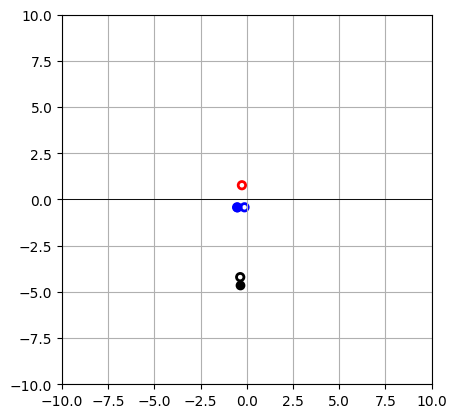

ACTION: [0. 0.]


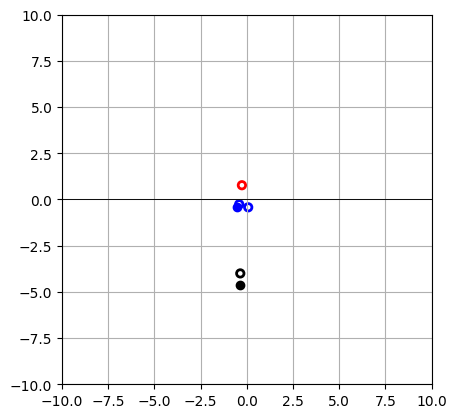

ACTION: [0.         0.01502899]


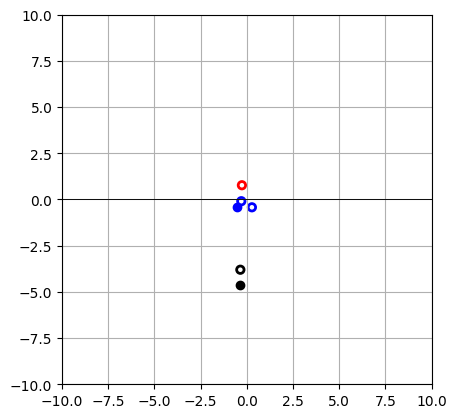

ACTION: [0.        0.6963368]


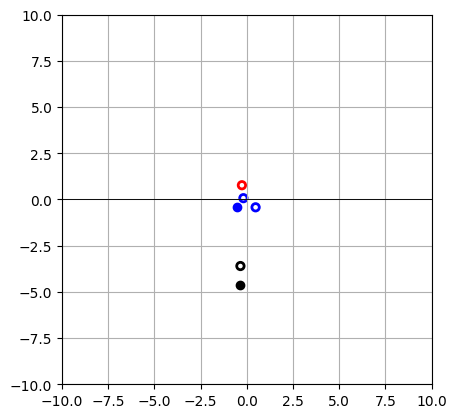

ACTION: [0. 0.]


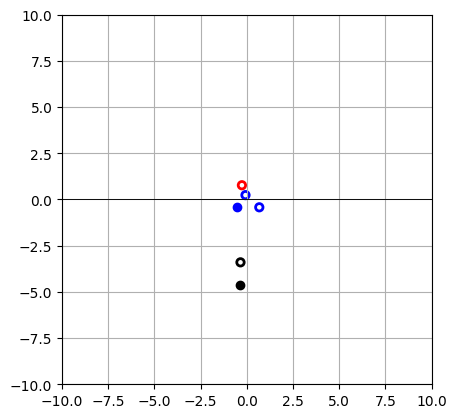

ACTION: [0. 0.]


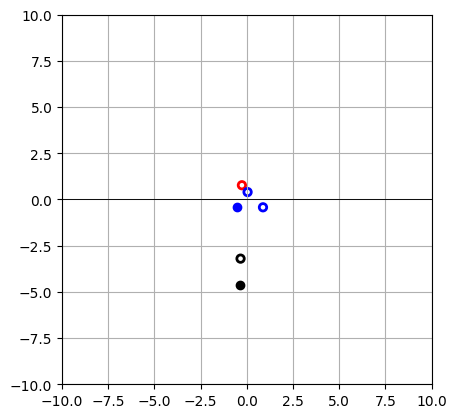

ACTION: [0. 0.]


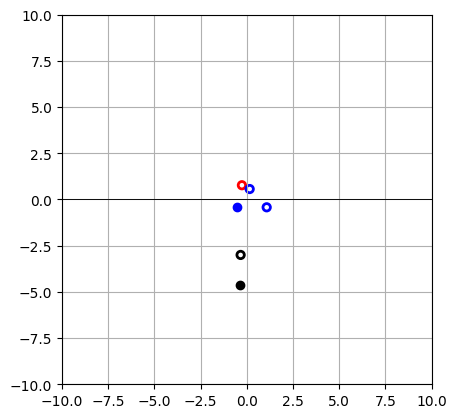

ACTION: [0.51735675 0.8038566 ]


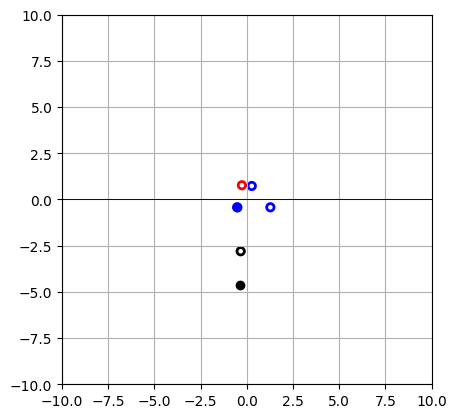

ACTION: [0.         0.37045583]


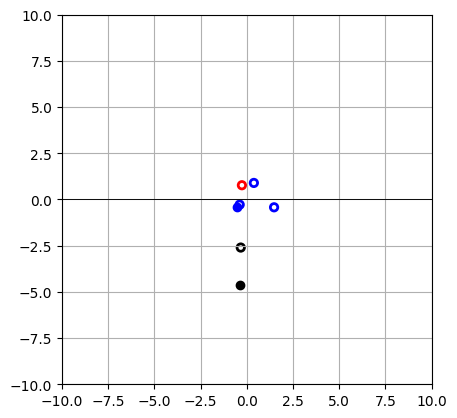

ACTION: [0.7488016 0.       ]


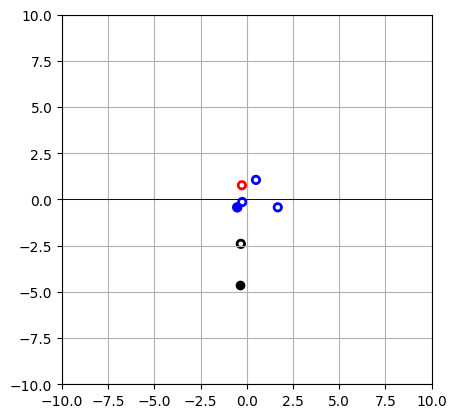

ACTION: [0. 0.]


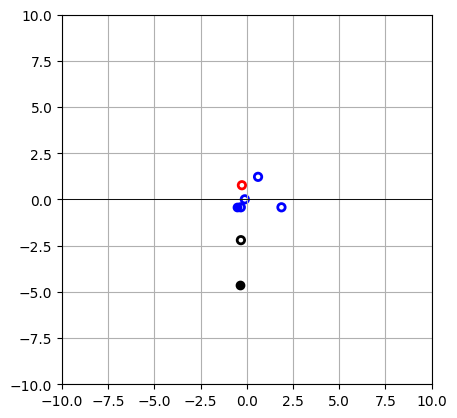

ACTION: [0.         0.08971343]


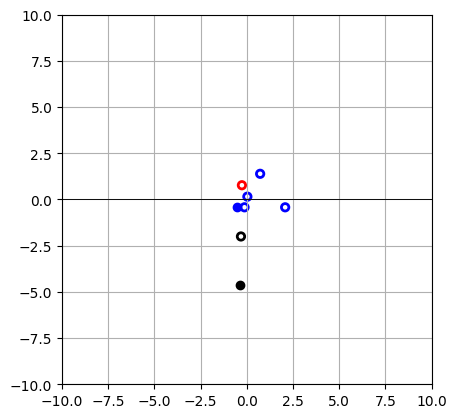

ACTION: [1.        0.8547972]


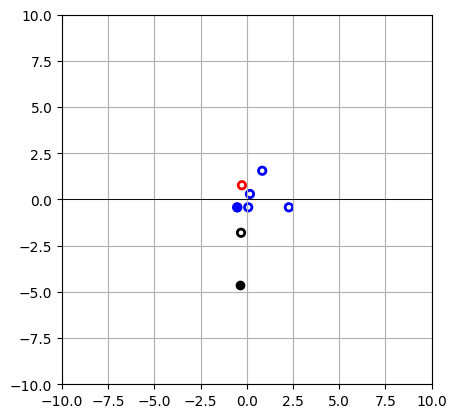

ACTION: [1.         0.92113686]


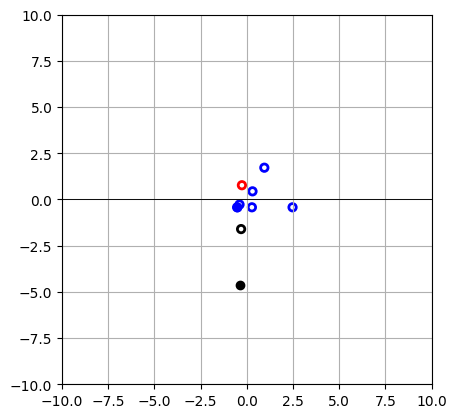

ACTION: [0.        1.6635036]


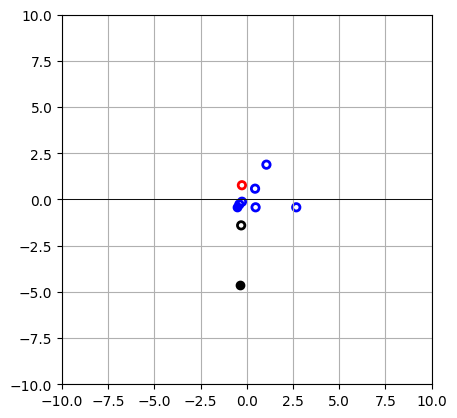

ACTION: [0.37917584 0.4360504 ]


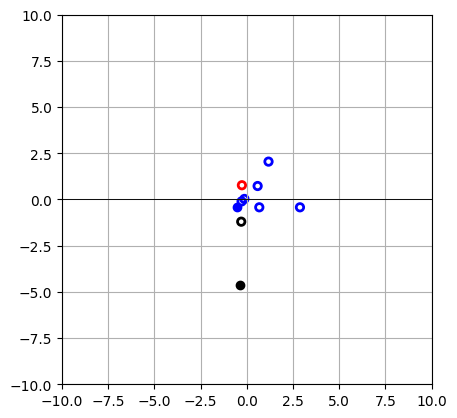

ACTION: [0. 0.]


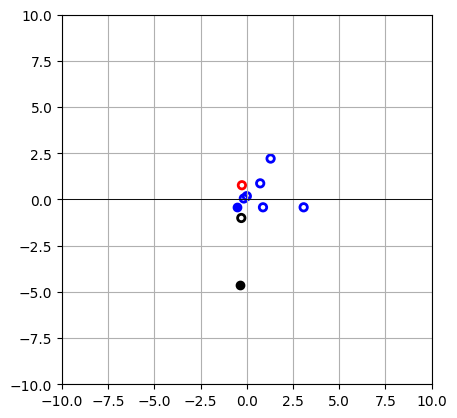

ACTION: [0. 0.]


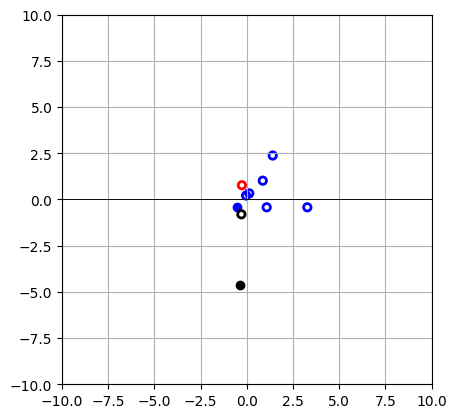

ACTION: [0. 0.]


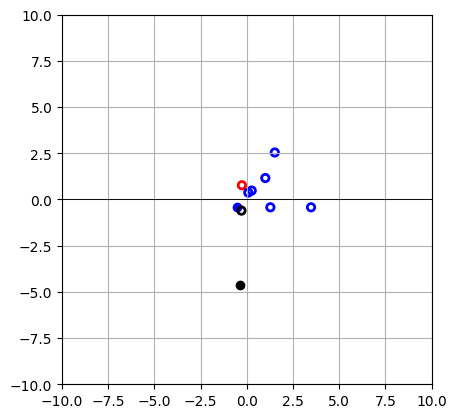

ACTION: [0.73547393 1.0609058 ]


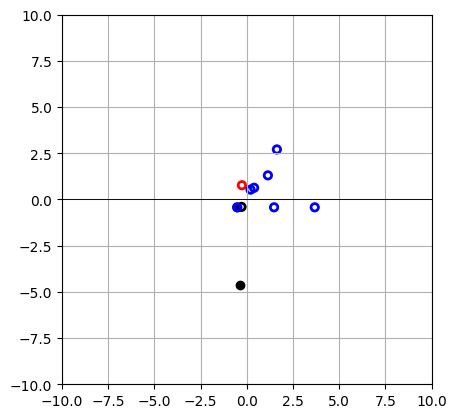

ACTION: [0. 0.]


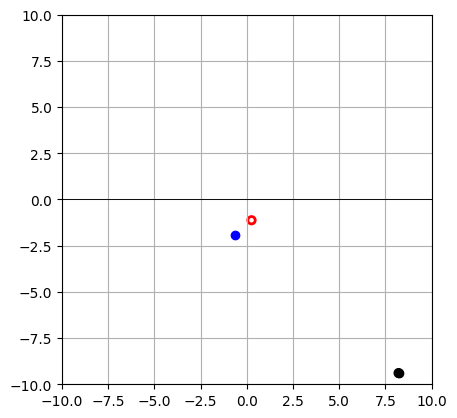

ACTION: [0.         0.97262657]


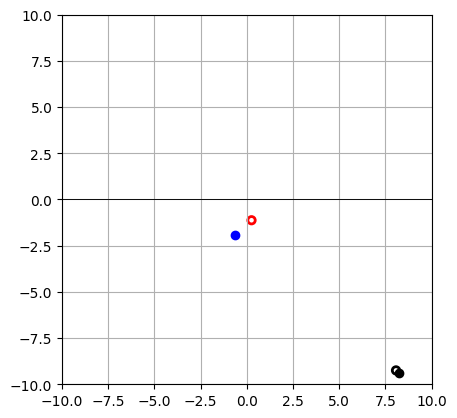

ACTION: [0.         0.19780047]


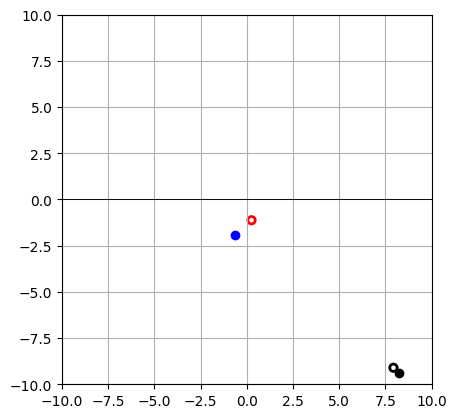

ACTION: [0.         0.45067433]


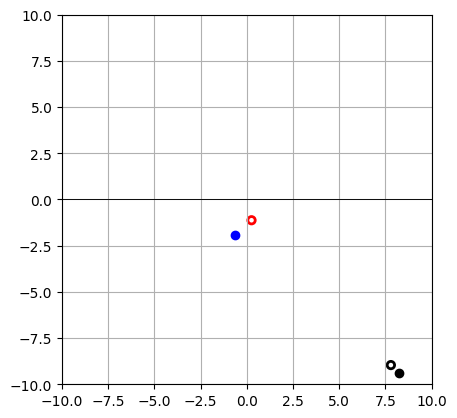

ACTION: [0.        1.0744227]


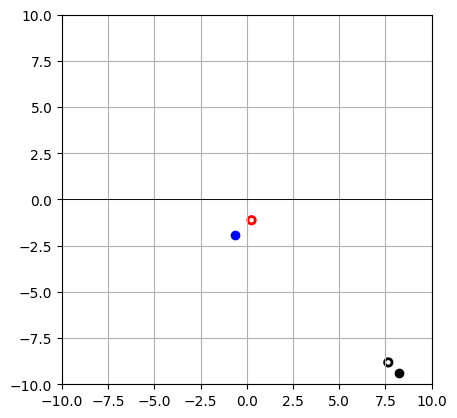

ACTION: [0. 0.]


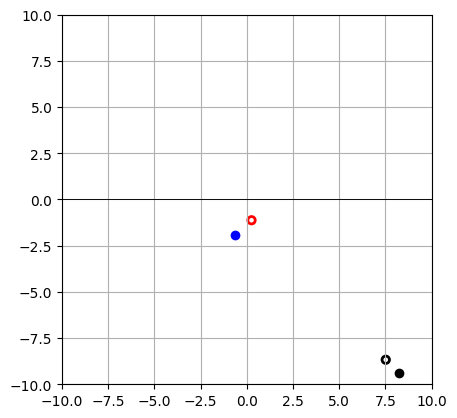

ACTION: [1. 0.]


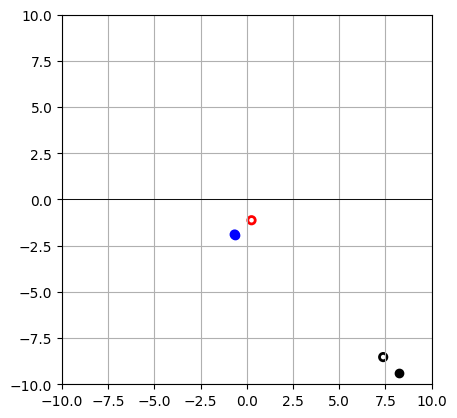

ACTION: [0.        2.3853278]


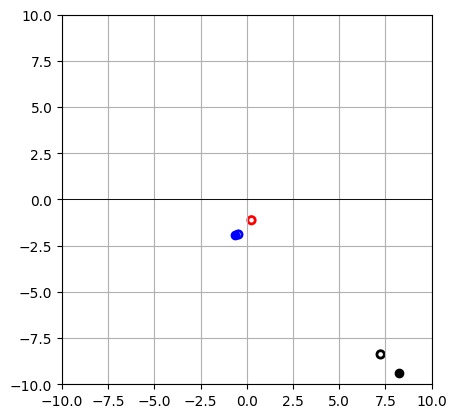

ACTION: [0.         0.96839905]


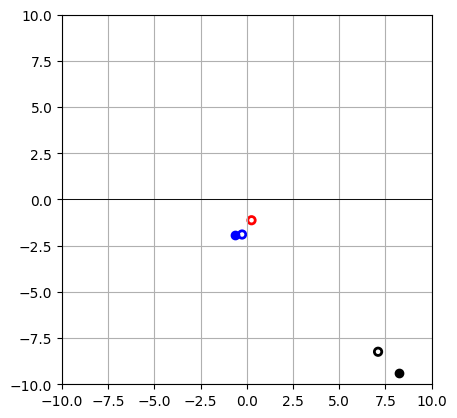

ACTION: [0.      0.86929]


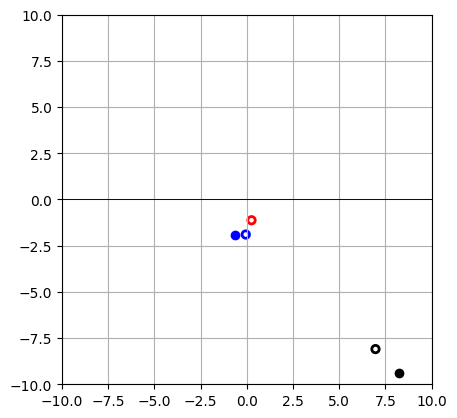

ACTION: [1. 0.]


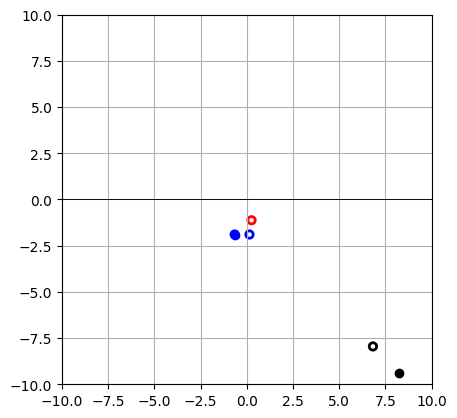

ACTION: [1. 0.]


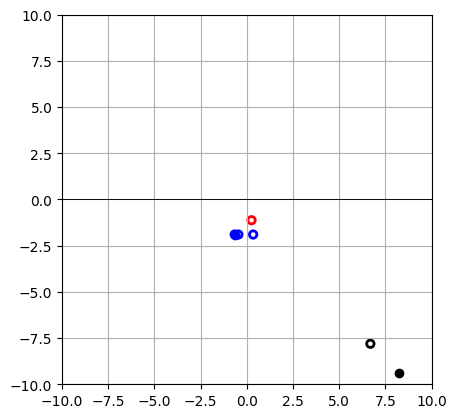

ACTION: [1.       2.354711]


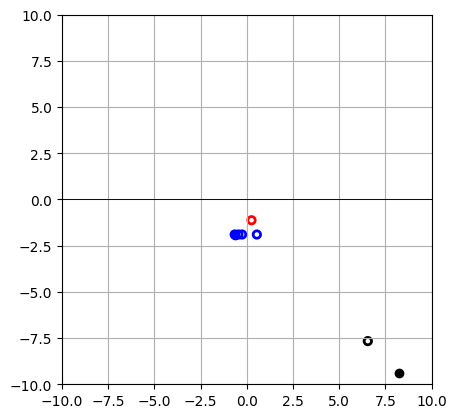

ACTION: [0.31560066 0.26164934]


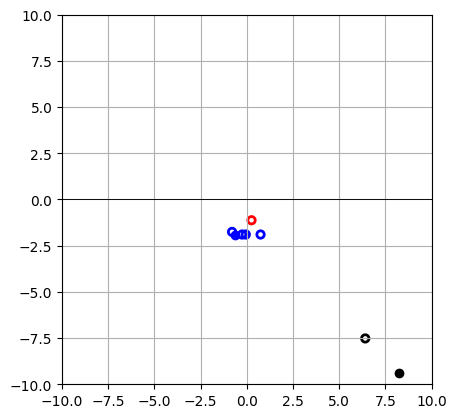

ACTION: [0.23233598 2.2766445 ]


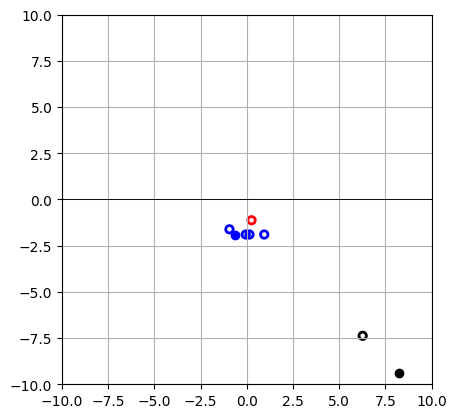

ACTION: [0.        1.9519241]


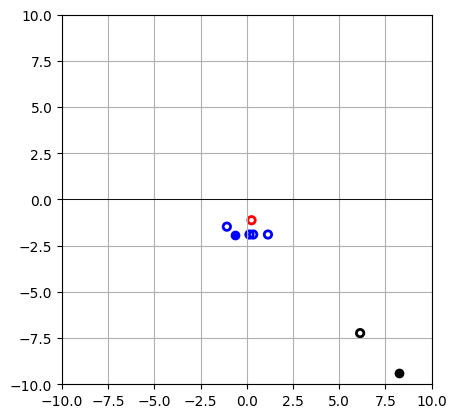

ACTION: [0. 0.]


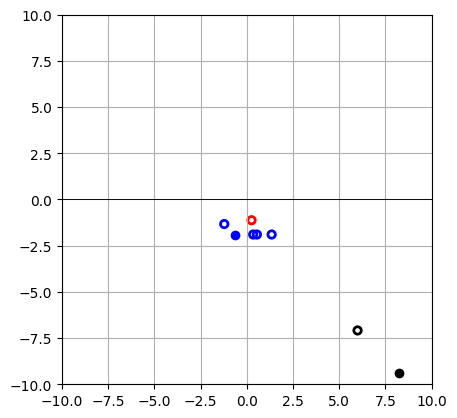

ACTION: [0.        1.1312773]


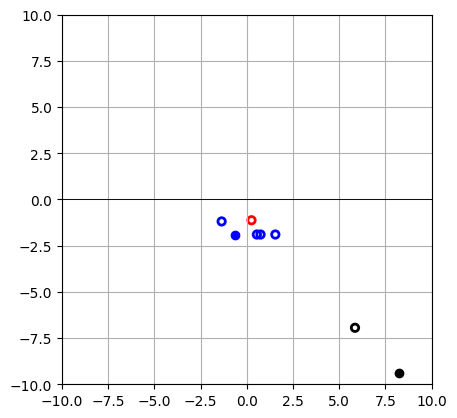

ACTION: [0.5411083 1.5259161]


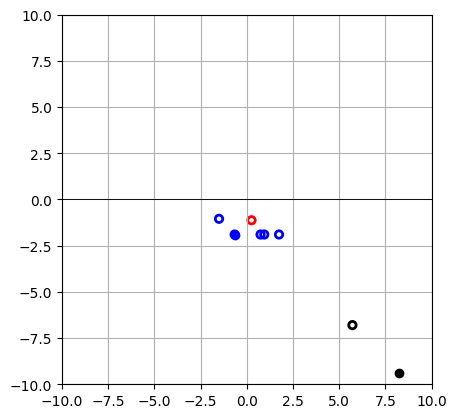

ACTION: [0.6174459 0.       ]


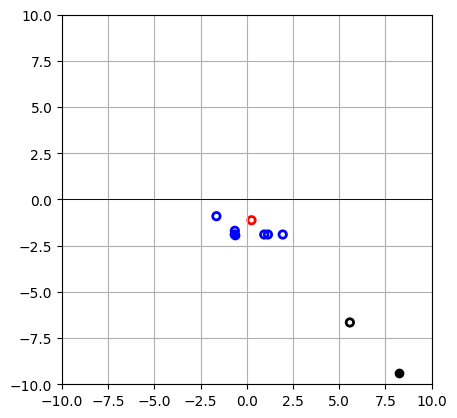

ACTION: [0.        0.5021302]


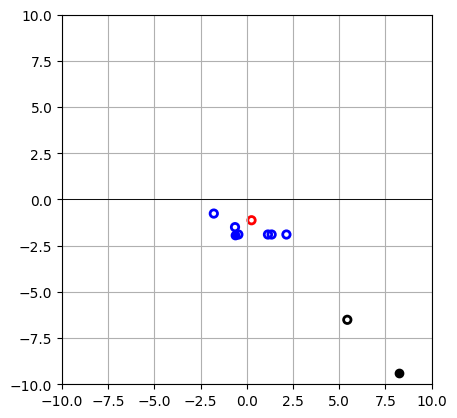

ACTION: [0.38130844 0.        ]


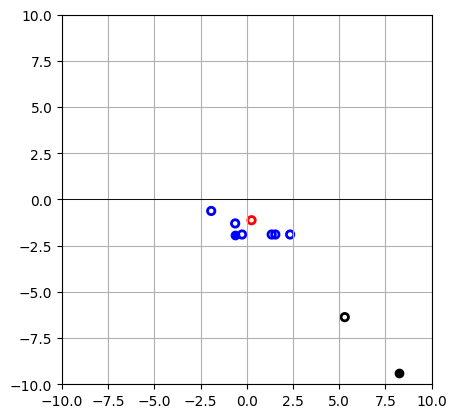

ACTION: [0.18992846 1.2019346 ]


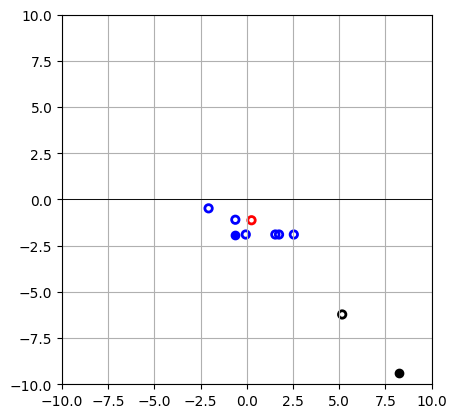

ACTION: [0. 0.]


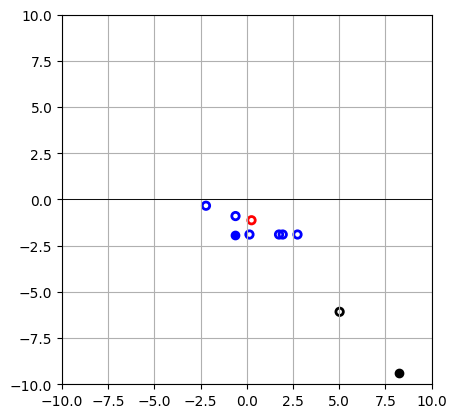

ACTION: [0.        1.8982434]


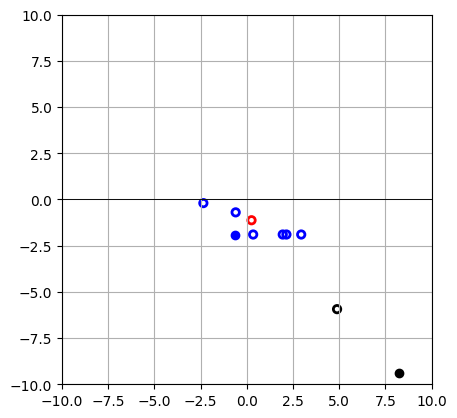

ACTION: [0. 0.]


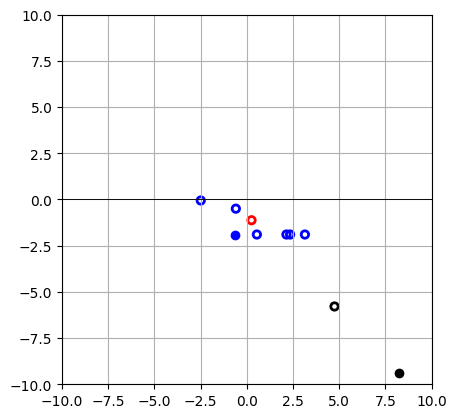

ACTION: [0.       2.319834]


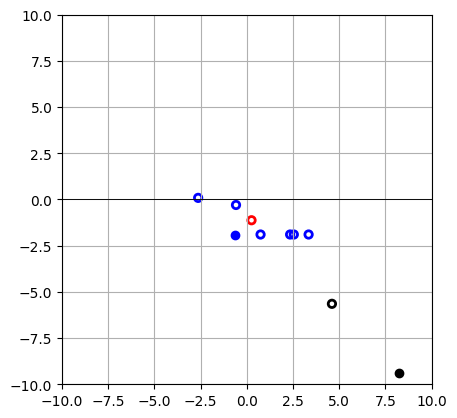

ACTION: [0.04513197 0.6460083 ]


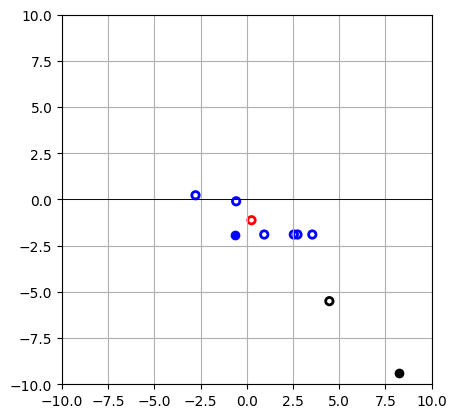

ACTION: [0. 0.]


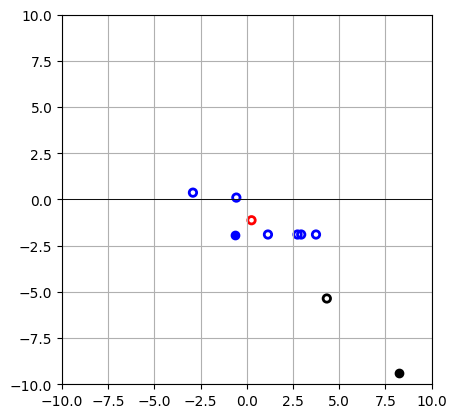

ACTION: [0.57104266 0.        ]


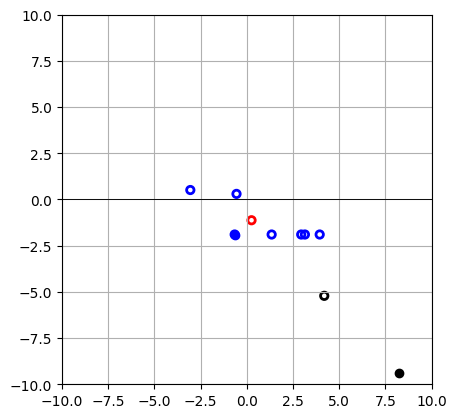

ACTION: [1.         0.32321346]


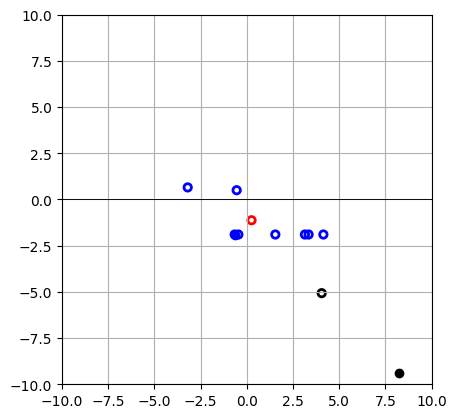

ACTION: [0.       2.265049]


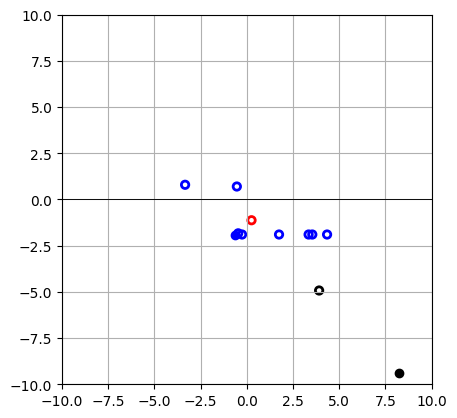

ACTION: [0.         0.40432242]


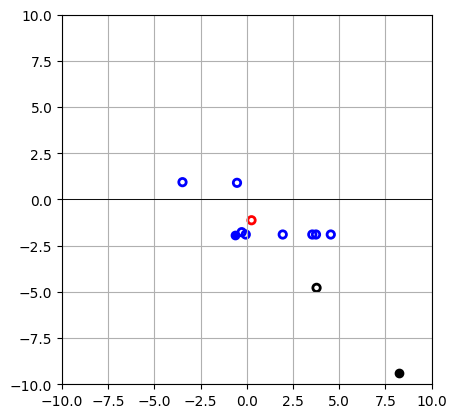

ACTION: [0.7615001 2.3020809]


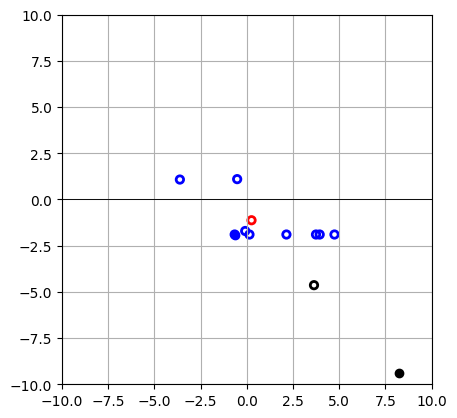

ACTION: [0.5988981 2.5896637]


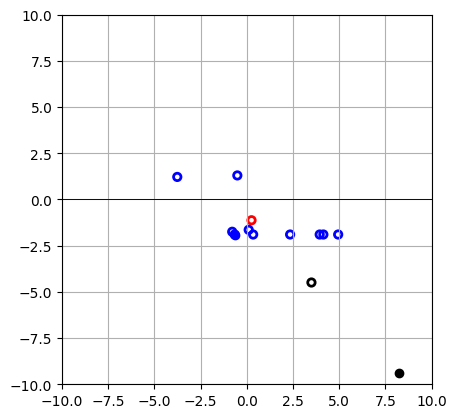

ACTION: [0.27260774 0.        ]


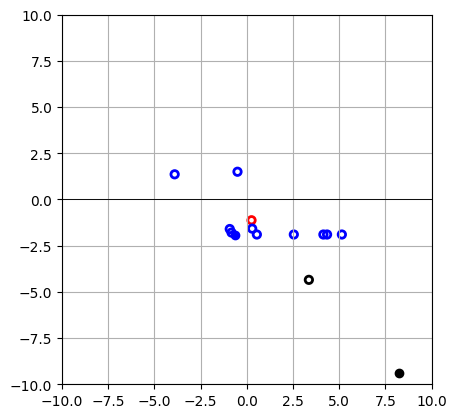

ACTION: [0.        1.0878415]


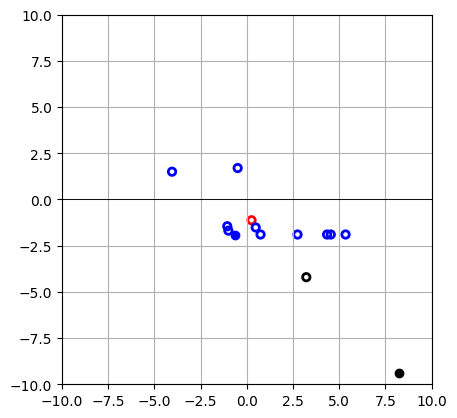

ACTION: [0.11508543 1.372656  ]


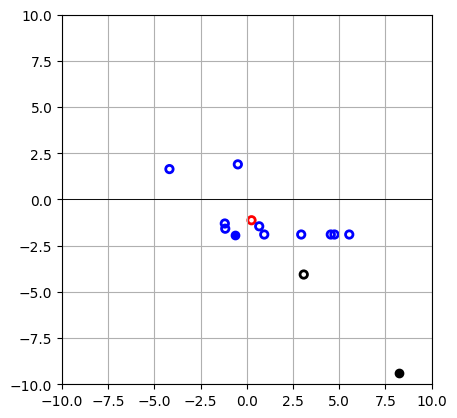

ACTION: [0.36476293 0.        ]


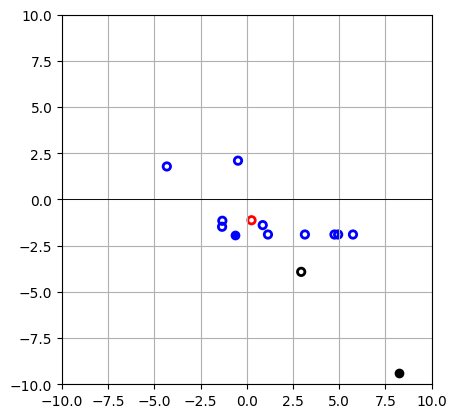

ACTION: [1.        0.8520076]


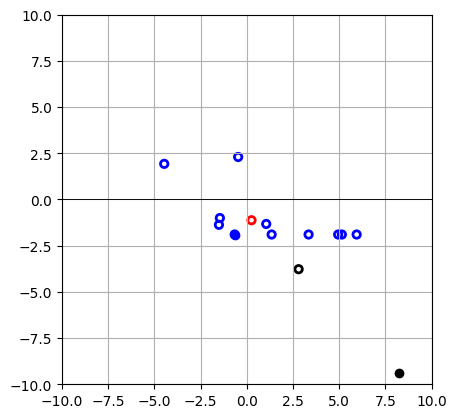

ACTION: [0. 0.]


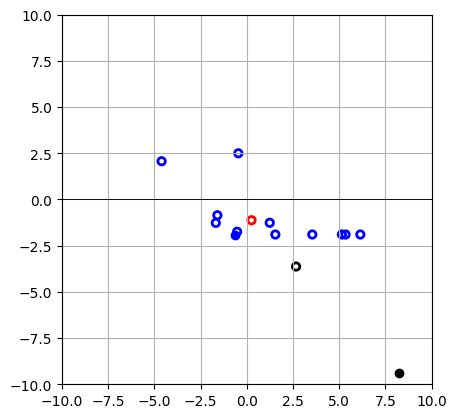

ACTION: [0.2418674 1.2535751]


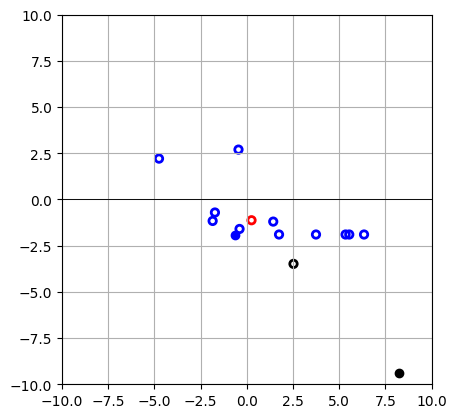

ACTION: [0.72980857 0.10466454]


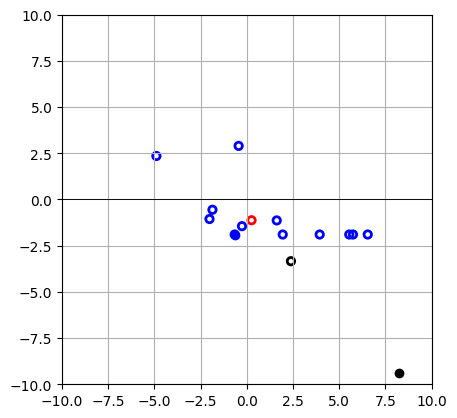

ACTION: [0.        1.8672091]


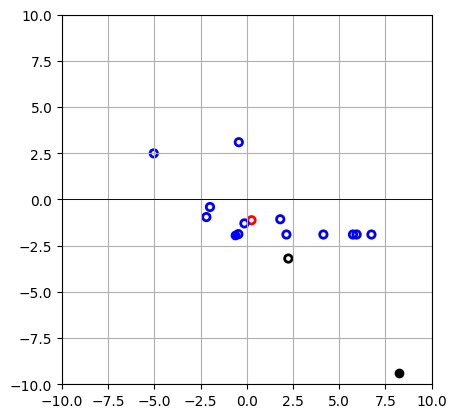

ACTION: [0.27859697 1.6306571 ]


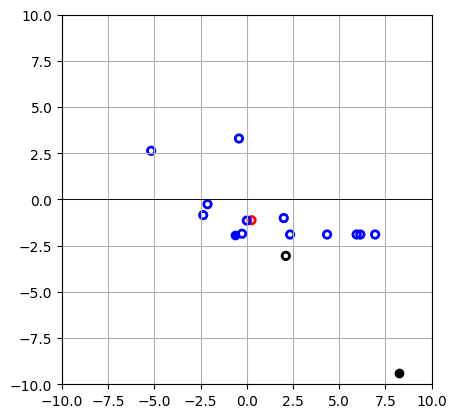

ACTION: [0. 0.]


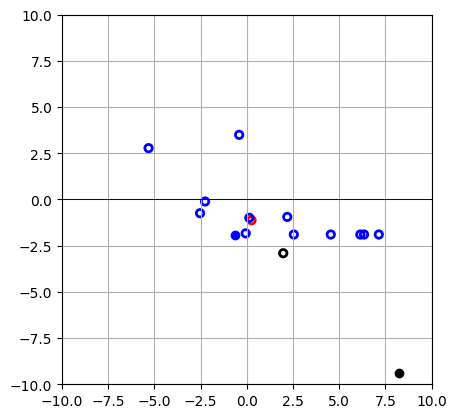

ACTION: [0.         0.00092243]


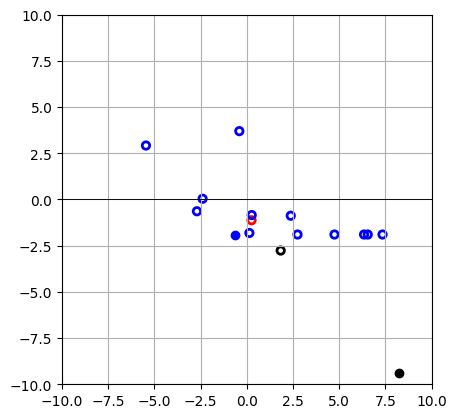

ACTION: [0.04434052 0.5257714 ]


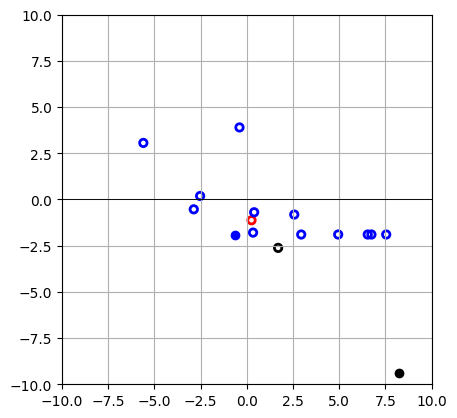

ACTION: [0.10872985 0.8732527 ]


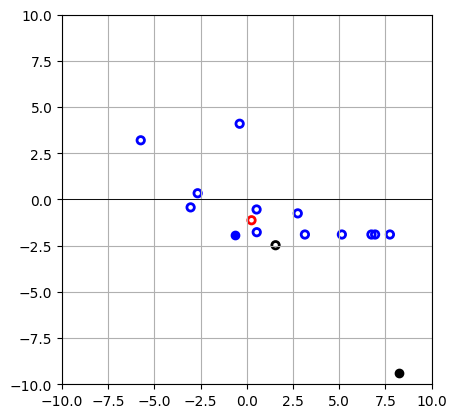

ACTION: [0.       0.886638]


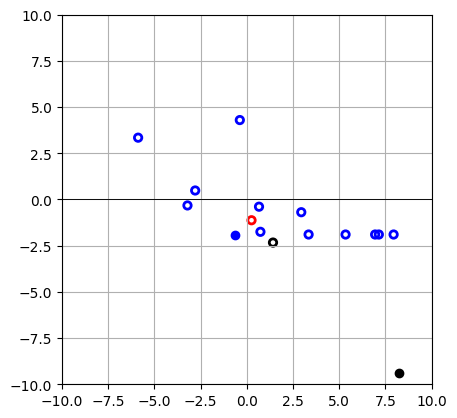

ACTION: [1. 0.]


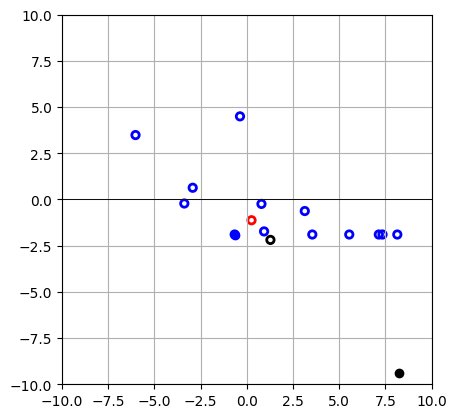

ACTION: [0.        1.9598933]


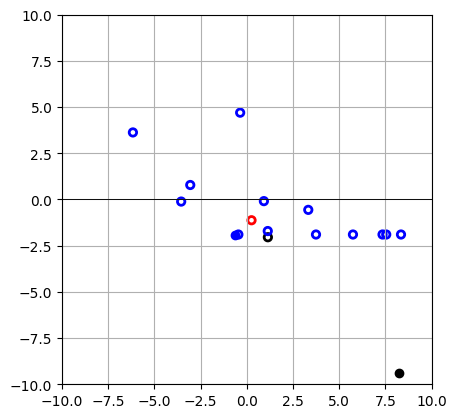

ACTION: [0.31289828 0.        ]


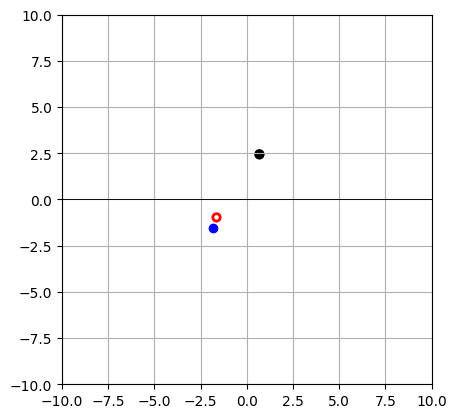

ACTION: [0.06923223 0.        ]


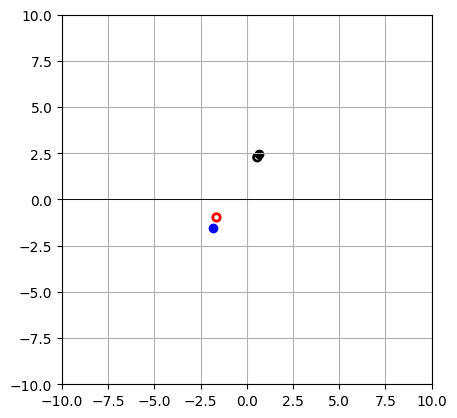

ACTION: [0. 0.]


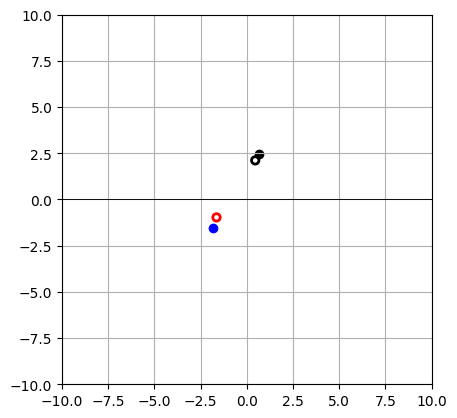

ACTION: [0. 0.]


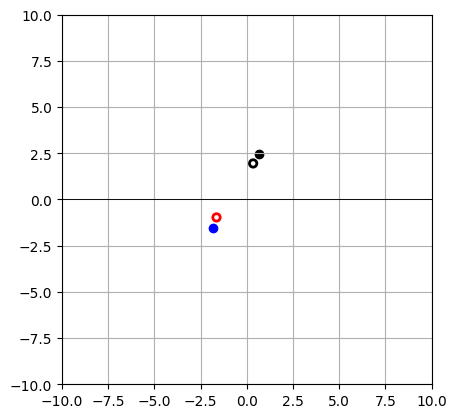

ACTION: [0. 0.]


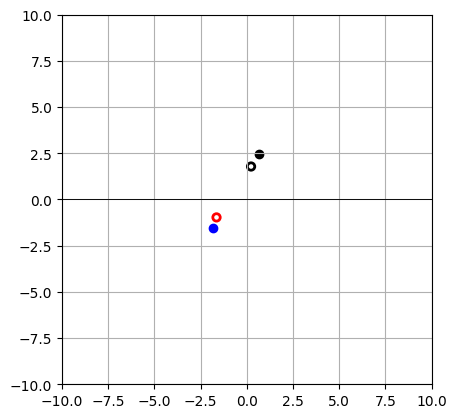

ACTION: [0.598272   0.37154993]


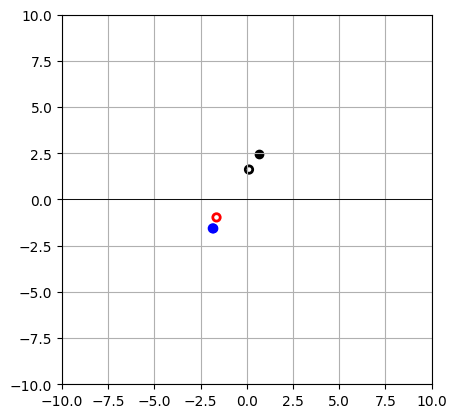

ACTION: [0.44044286 0.        ]


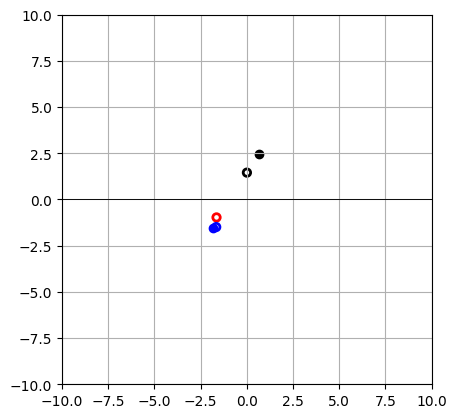

ACTION: [0.        0.2185747]


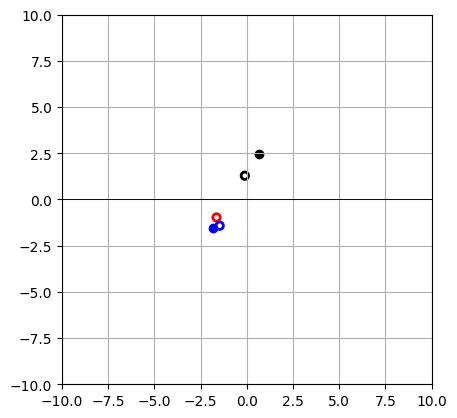

ACTION: [0.         0.45272896]


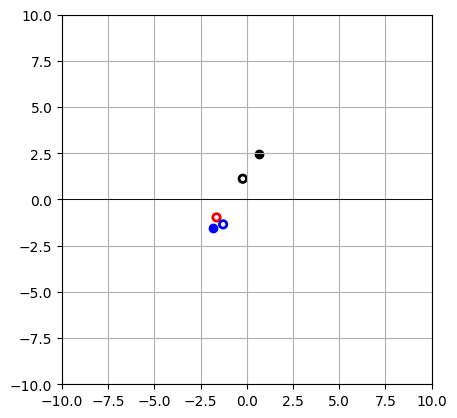

ACTION: [0.9976067 0.4566985]


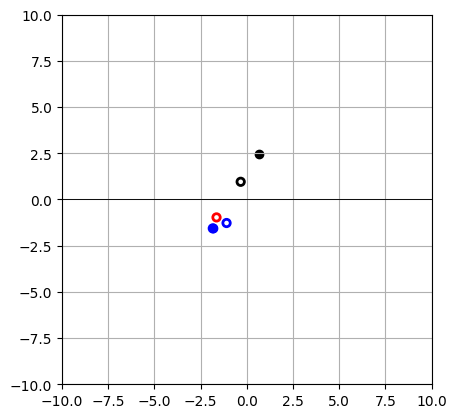

ACTION: [0.         0.11699288]


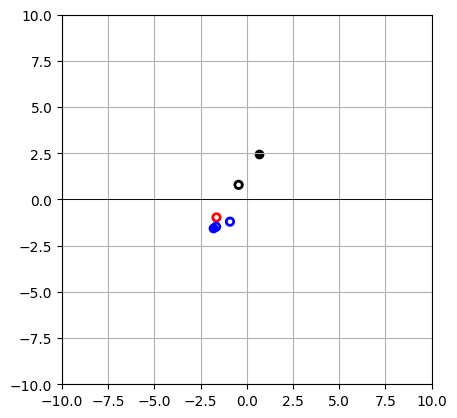

ACTION: [0.7569863 0.       ]


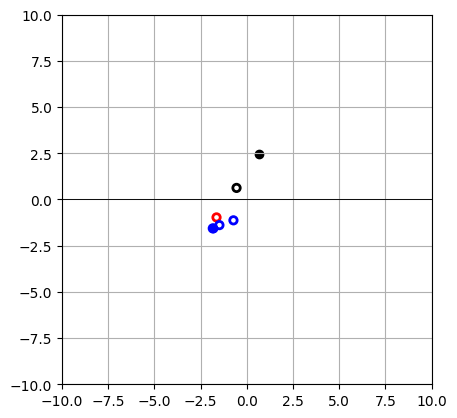

ACTION: [1.       0.292385]


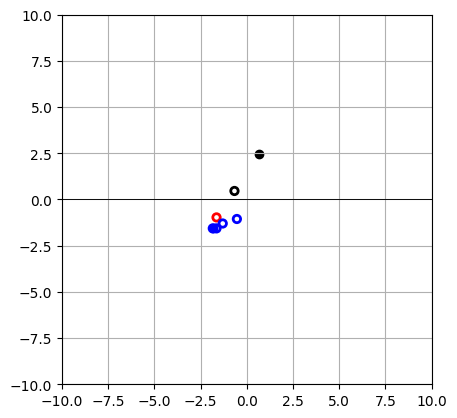

ACTION: [0. 0.]


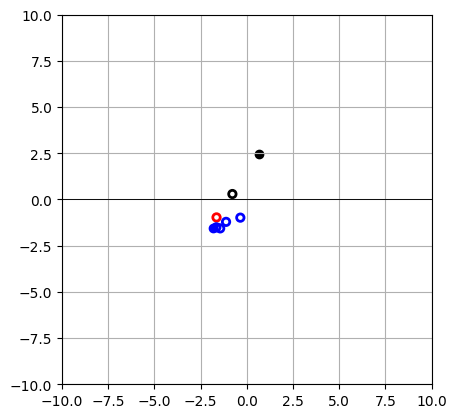

ACTION: [0.         0.43627593]


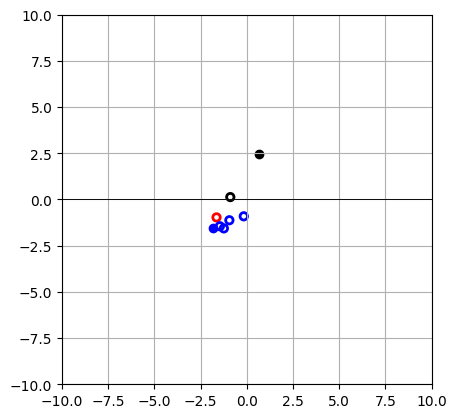

ACTION: [1. 0.]


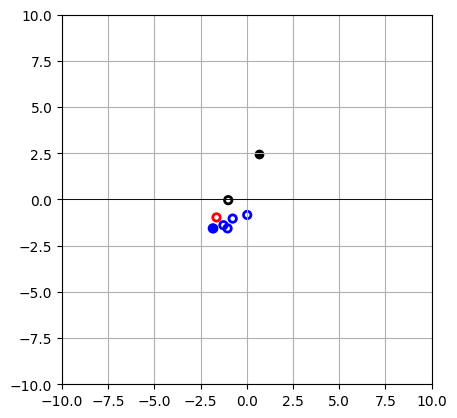

ACTION: [1.         0.22204965]


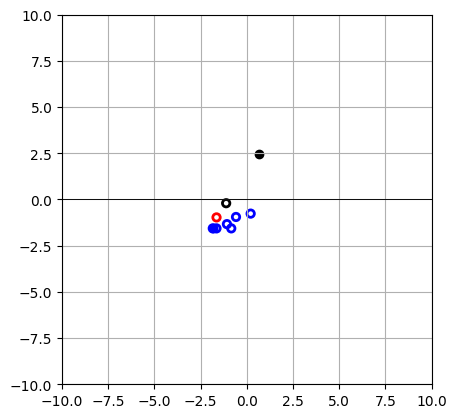

ACTION: [1. 0.]


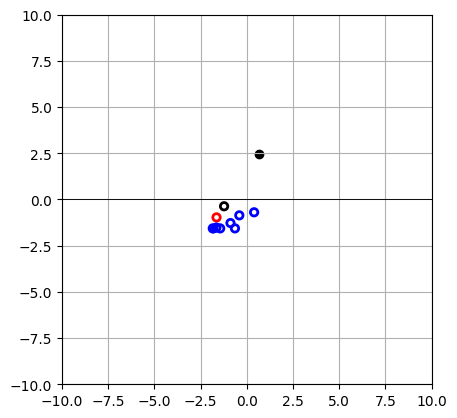

ACTION: [1. 0.]


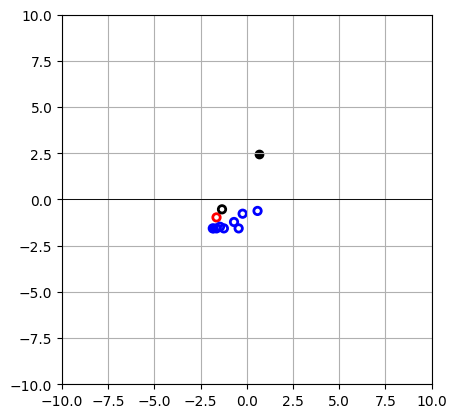

ACTION: [0.43571743 0.        ]


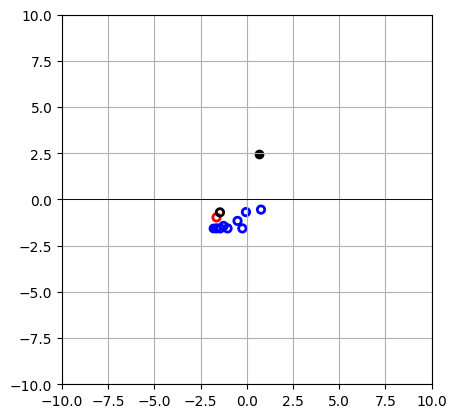

ACTION: [1. 0.]


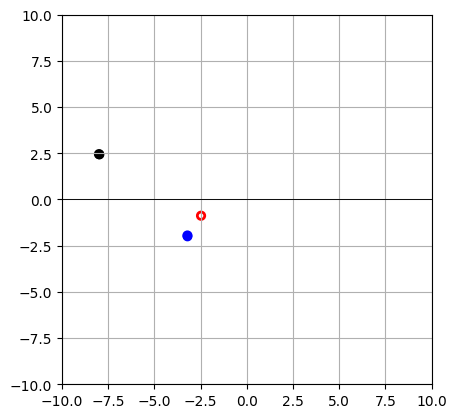

ACTION: [0. 0.]


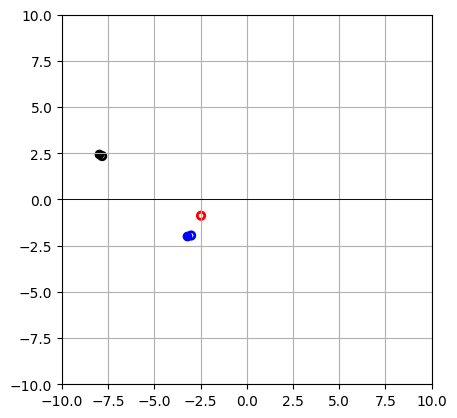

ACTION: [1.         0.06005532]


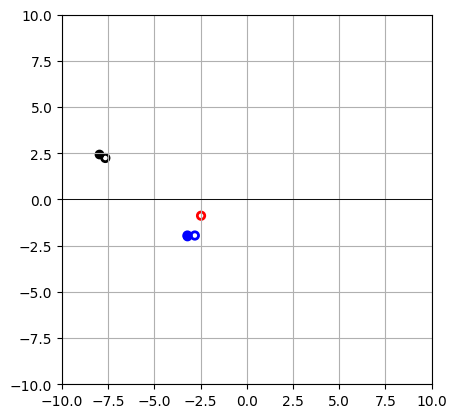

ACTION: [0.        1.7660786]


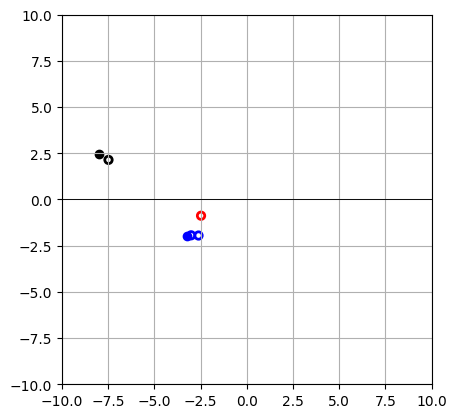

ACTION: [0.         0.96474427]


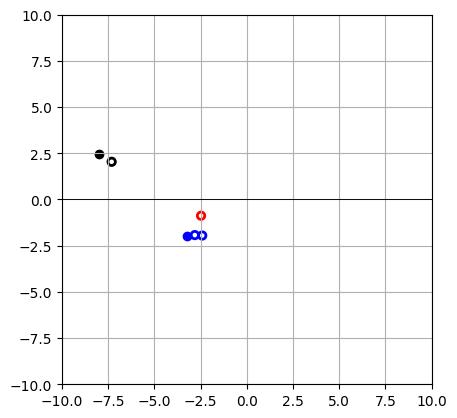

ACTION: [0. 0.]


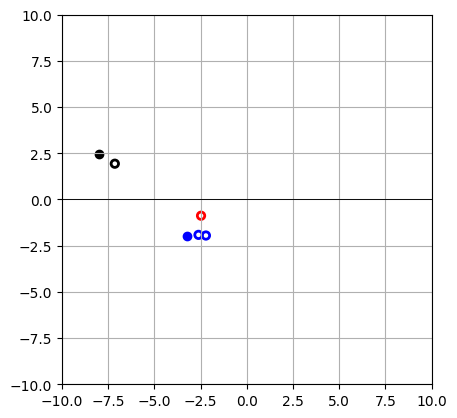

ACTION: [0.09243909 0.        ]


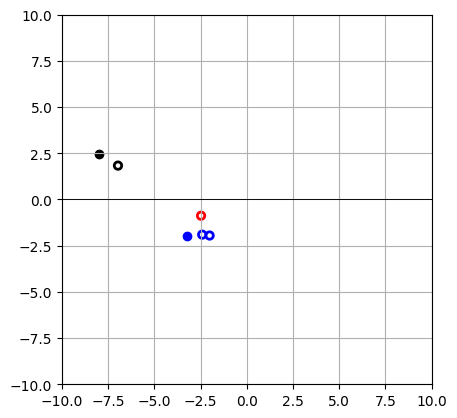

ACTION: [0. 0.]


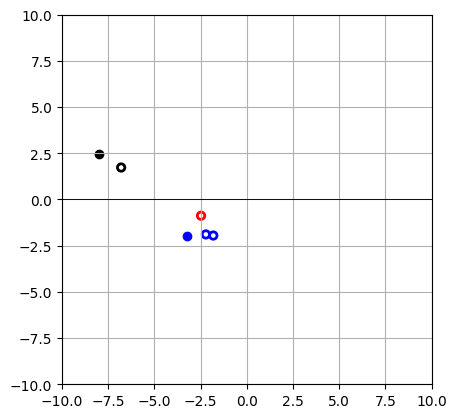

ACTION: [0. 0.]


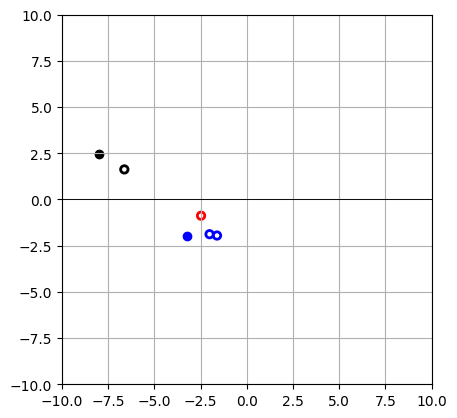

ACTION: [0.         0.21944094]


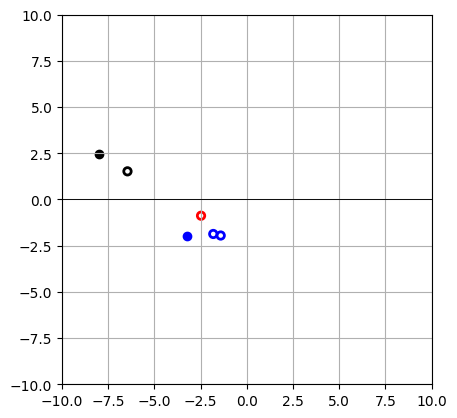

ACTION: [0. 0.]


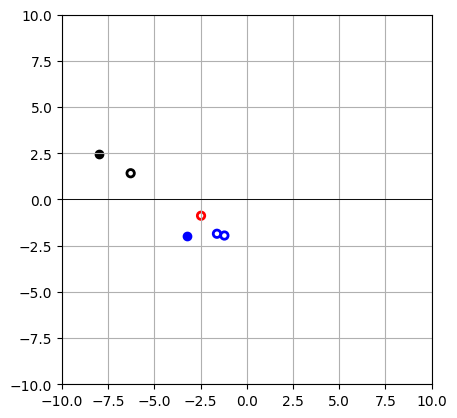

ACTION: [1. 0.]


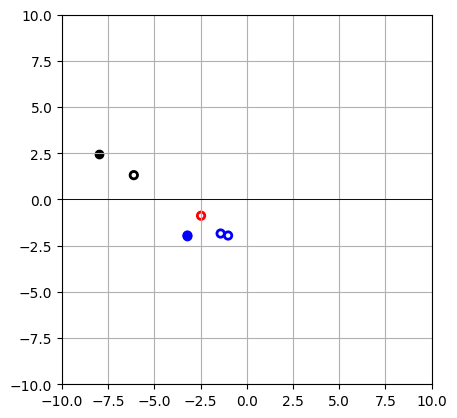

ACTION: [0. 0.]


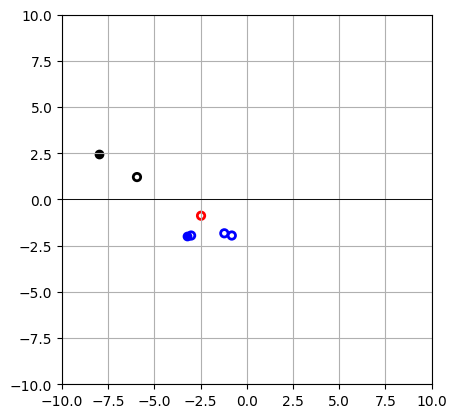

ACTION: [0. 0.]


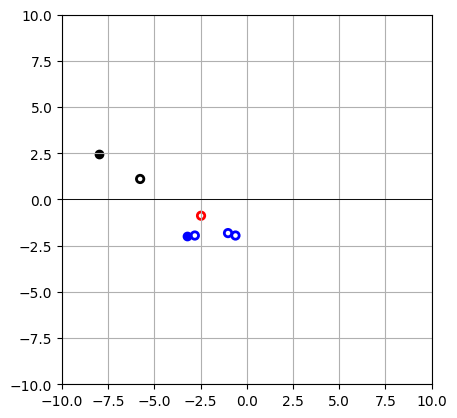

ACTION: [0. 0.]


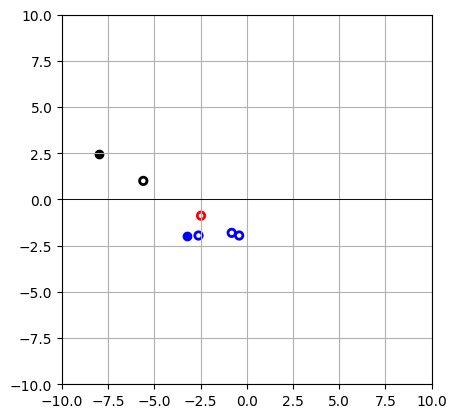

ACTION: [0.        0.7786684]


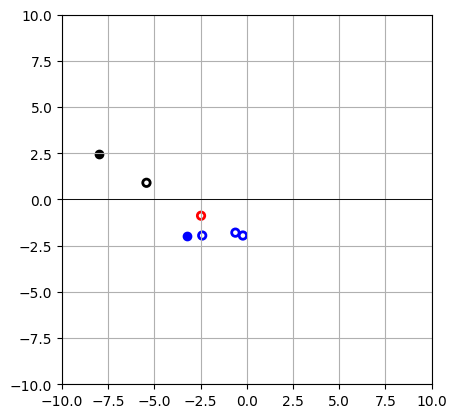

ACTION: [0.        0.1865001]


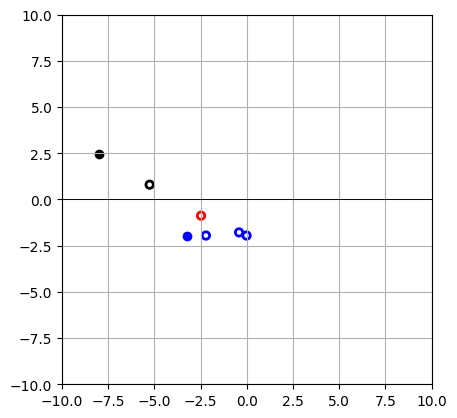

ACTION: [0.7531115 0.5552287]


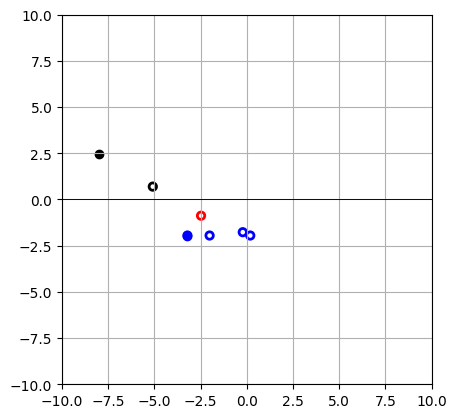

ACTION: [0. 0.]


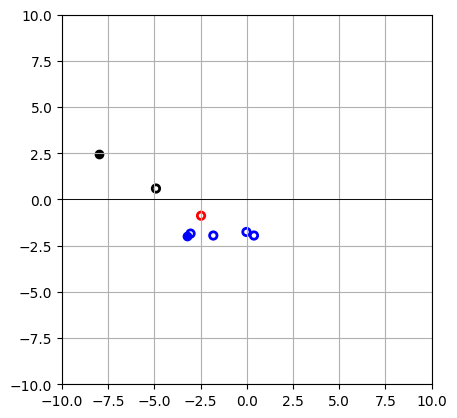

ACTION: [0.         0.39488178]


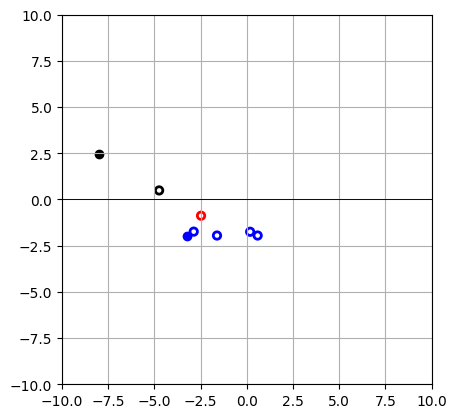

ACTION: [0. 0.]


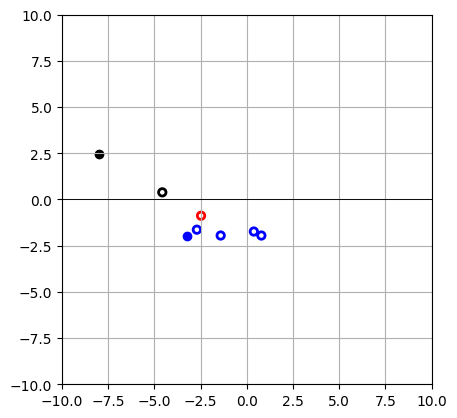

ACTION: [0. 0.]


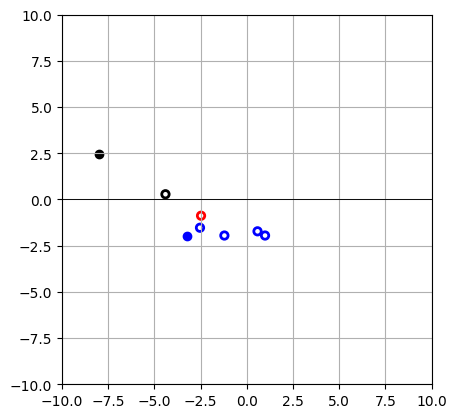

ACTION: [0.         0.03545771]


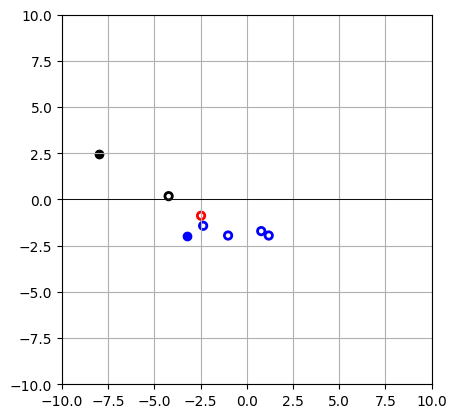

ACTION: [0. 0.]


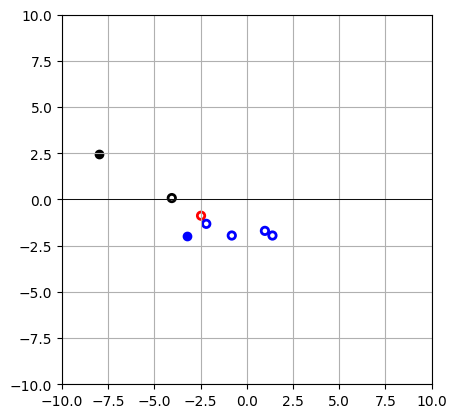

ACTION: [0.        0.7095793]


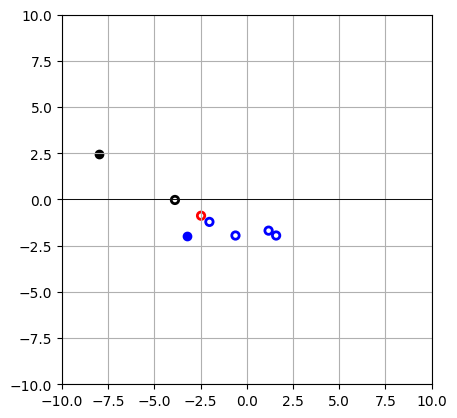

ACTION: [0.8732336 0.2812048]


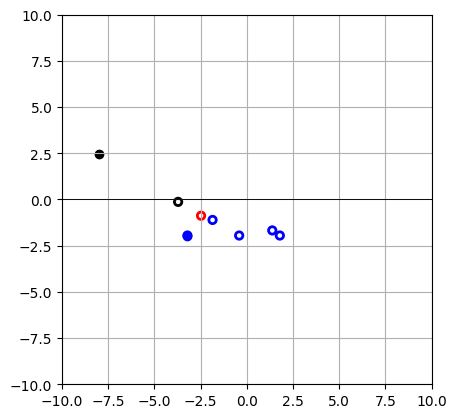

ACTION: [0. 0.]


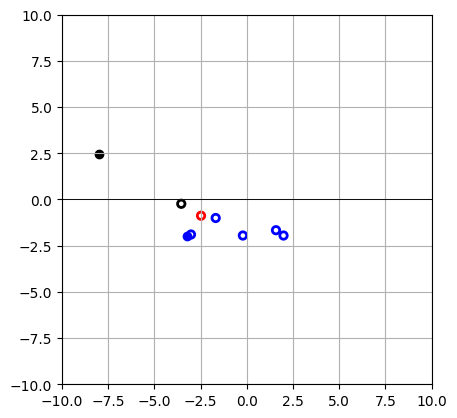

ACTION: [0.70724994 0.92886233]


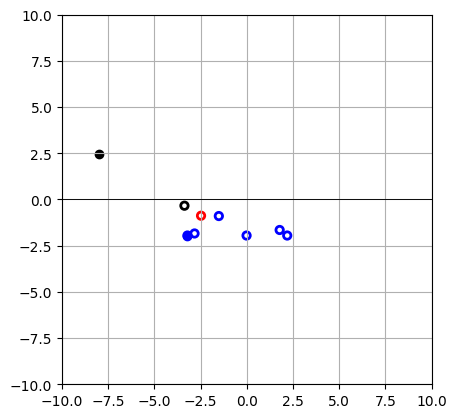

ACTION: [0. 0.]


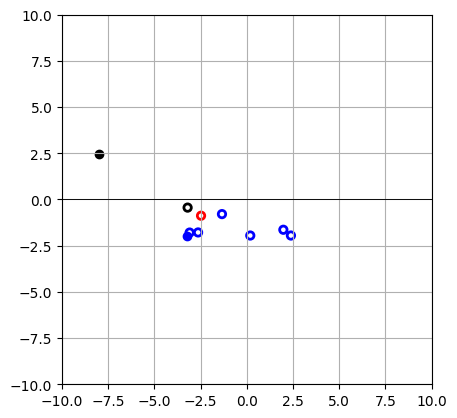

ACTION: [0.85280776 0.        ]


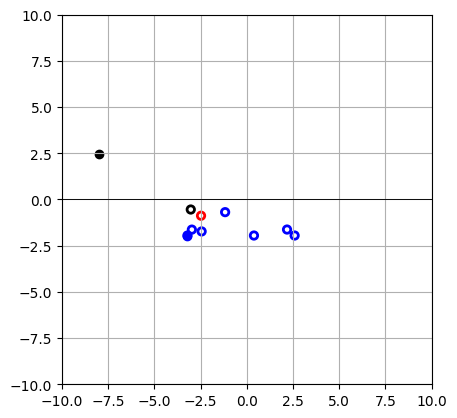

ACTION: [0.        1.0442071]


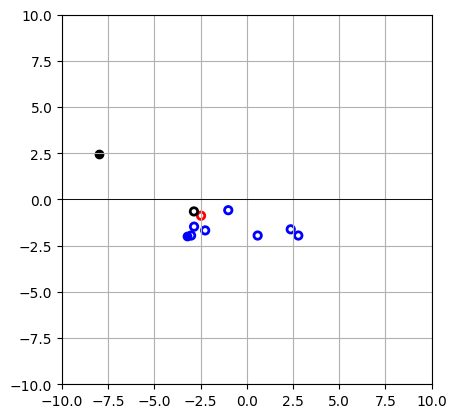

ACTION: [1.         0.66395044]


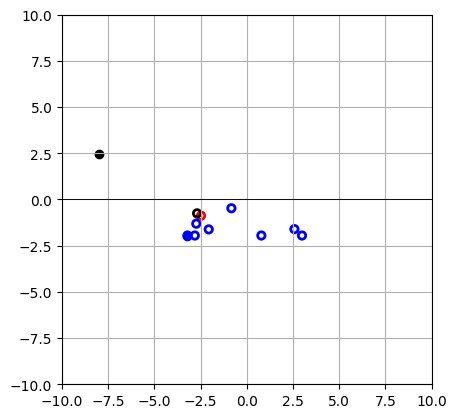

ACTION: [0.65236974 0.        ]


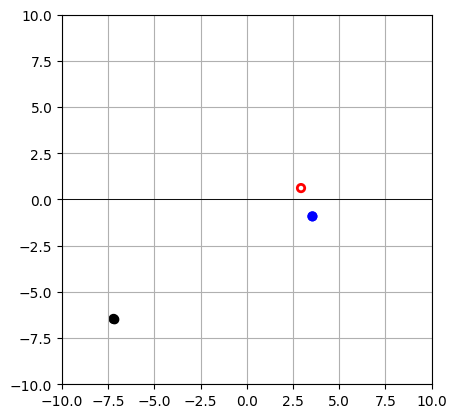

ACTION: [0.28195998 0.        ]


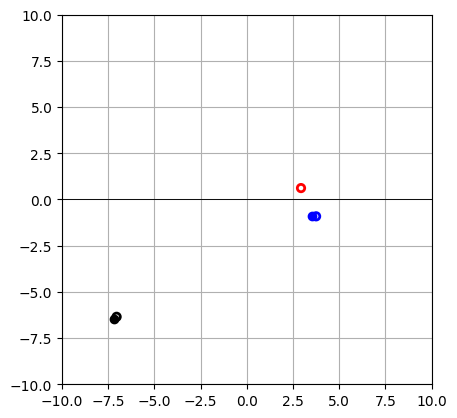

ACTION: [0.         0.92912185]


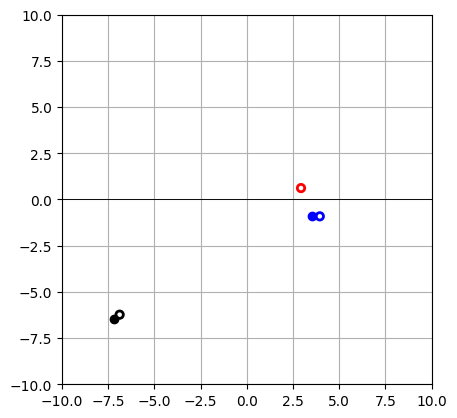

ACTION: [0. 0.]


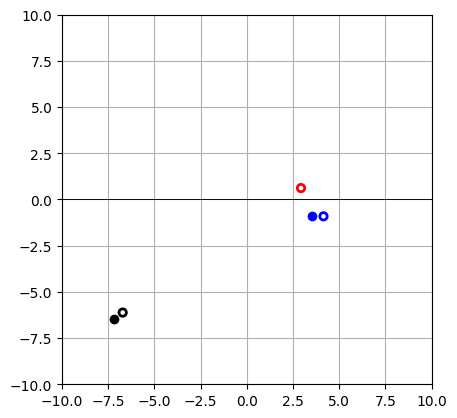

ACTION: [0.41903627 0.83393914]


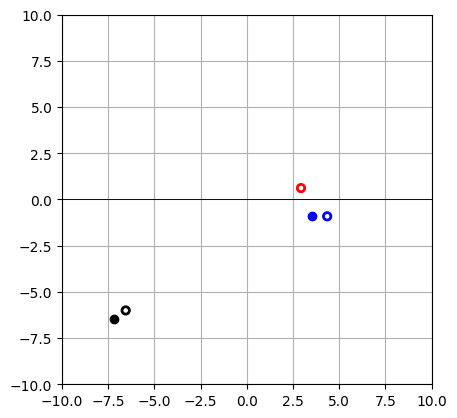

ACTION: [0.        0.6772013]


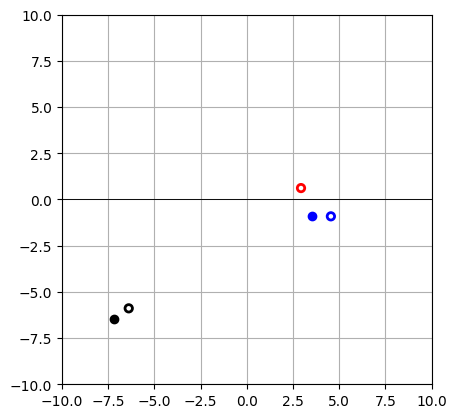

ACTION: [1.         0.21427251]


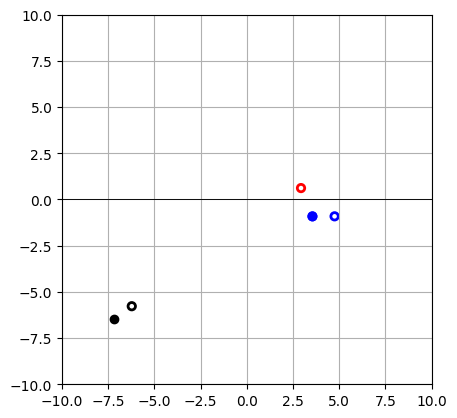

ACTION: [0.25651717 0.        ]


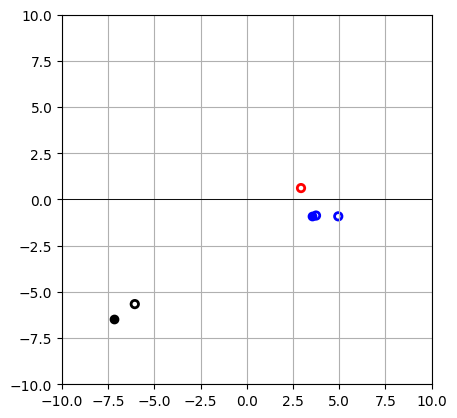

ACTION: [0.03674114 0.1445521 ]


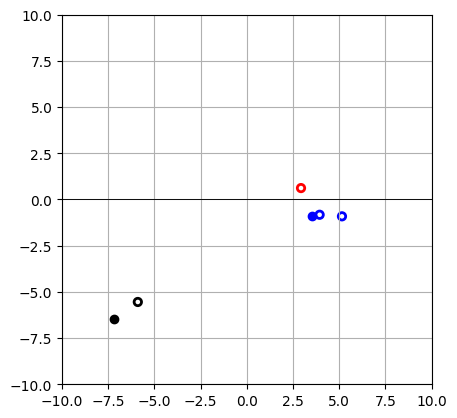

ACTION: [0.5848312 0.       ]


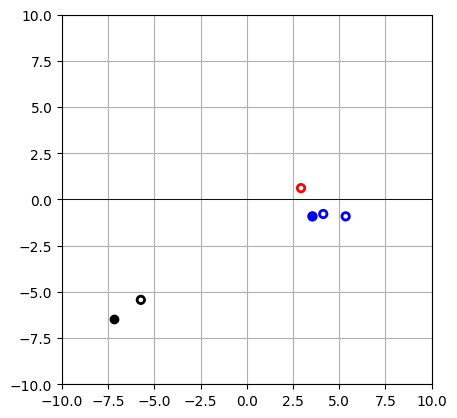

ACTION: [0.         0.37814984]


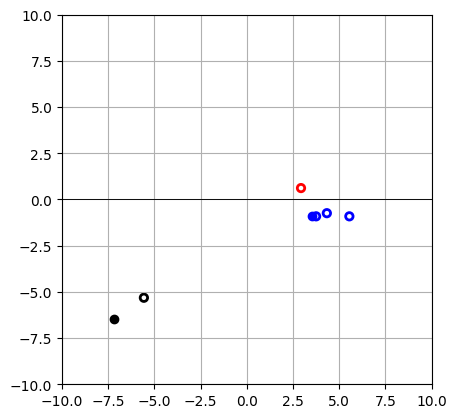

ACTION: [0.6532667 0.       ]


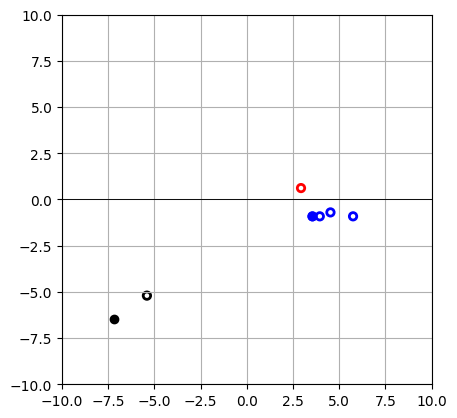

ACTION: [0.7190063 0.       ]


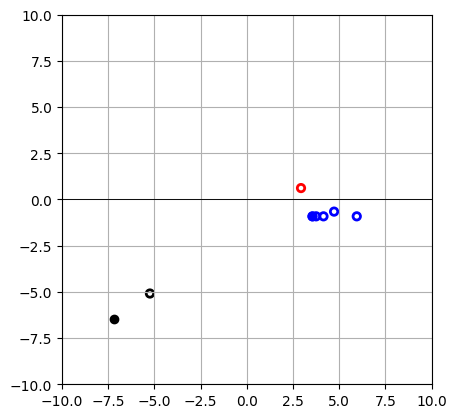

ACTION: [0.2547816 0.       ]


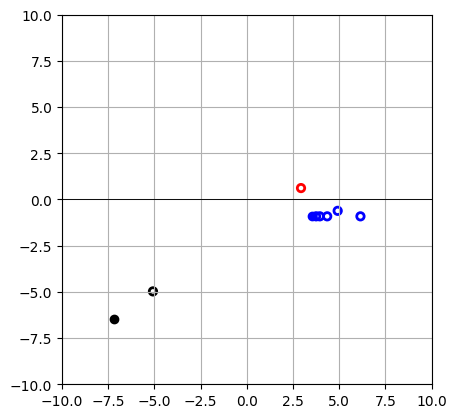

ACTION: [1. 0.]


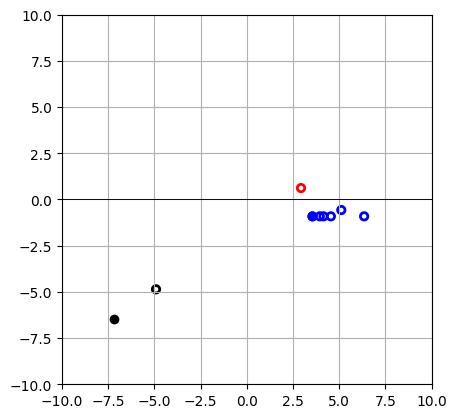

ACTION: [0.66096044 0.        ]


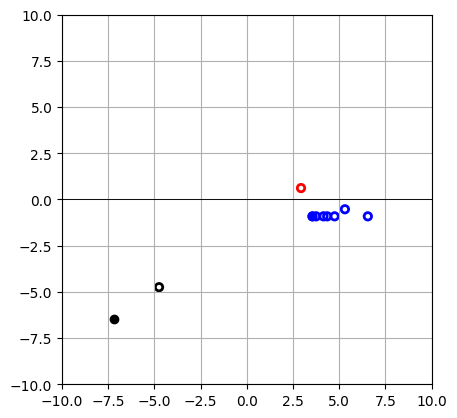

ACTION: [0.       0.580189]


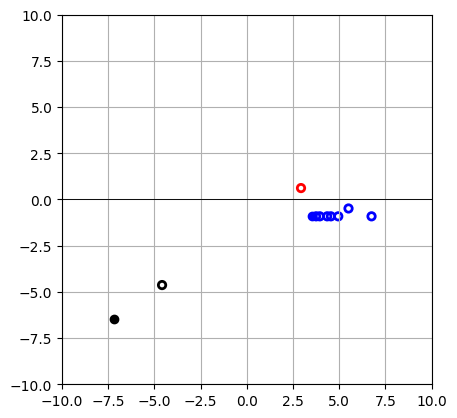

ACTION: [1.         0.56998885]


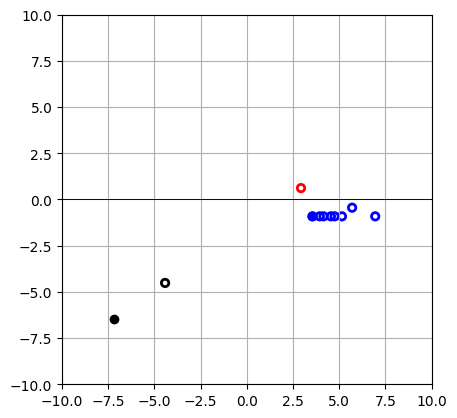

ACTION: [1.        1.4326476]


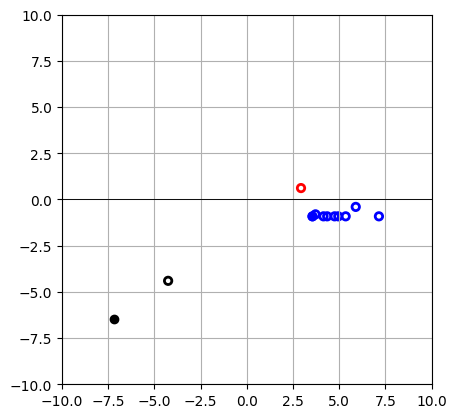

ACTION: [0.8029541 0.2828008]


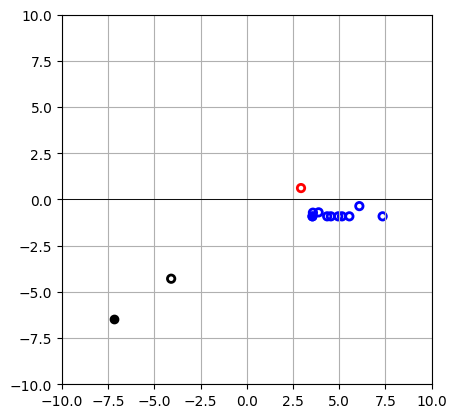

ACTION: [0.6072338 1.0016456]


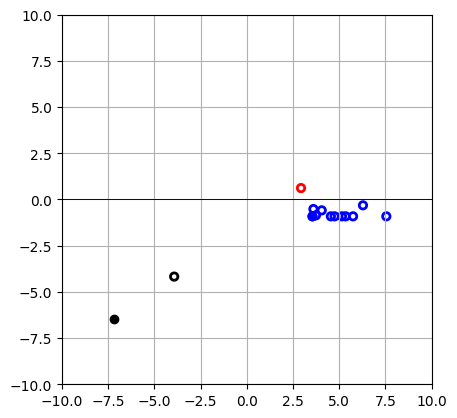

ACTION: [0.8506294  0.09238704]


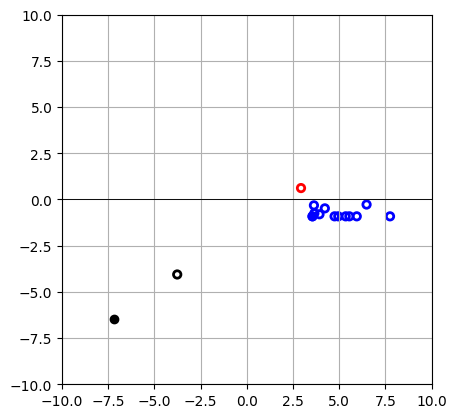

ACTION: [0.        1.4232248]


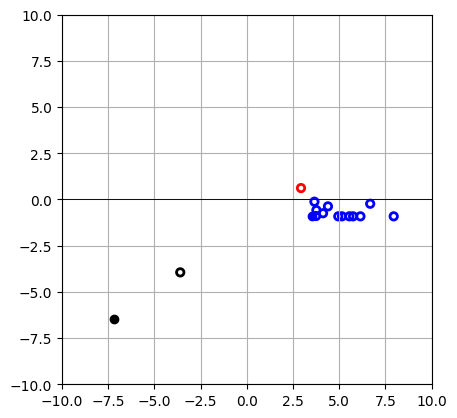

ACTION: [0.653273 0.      ]


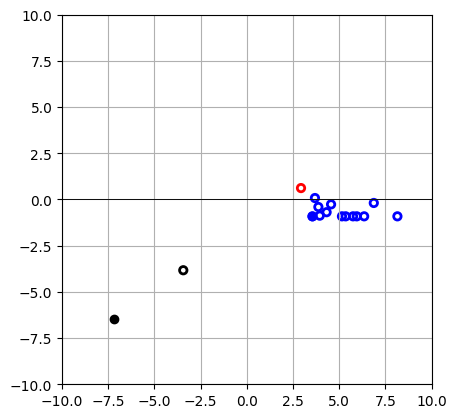

ACTION: [0.         0.88608986]


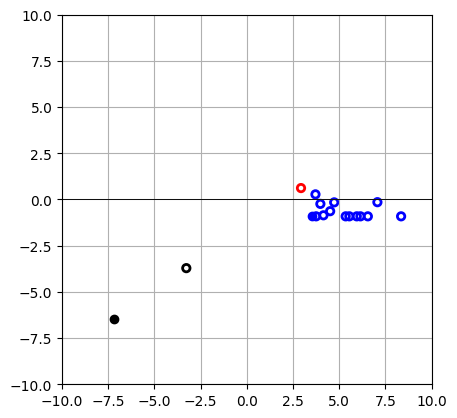

ACTION: [0.17585464 0.6132446 ]


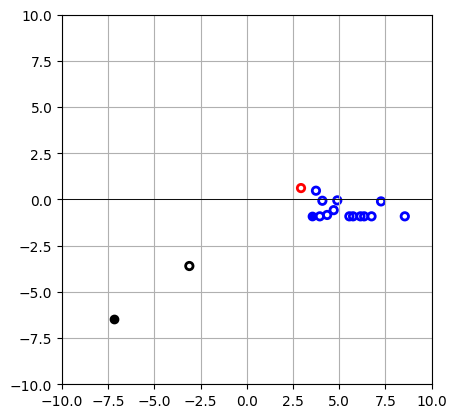

ACTION: [0. 0.]


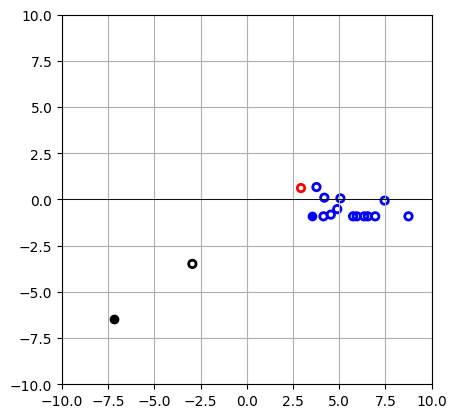

ACTION: [0.3841059 1.018614 ]


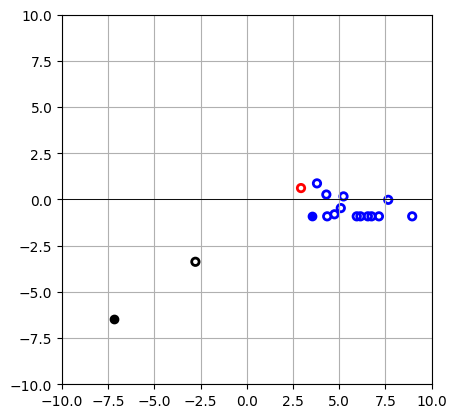

ACTION: [0.43801177 0.23129009]


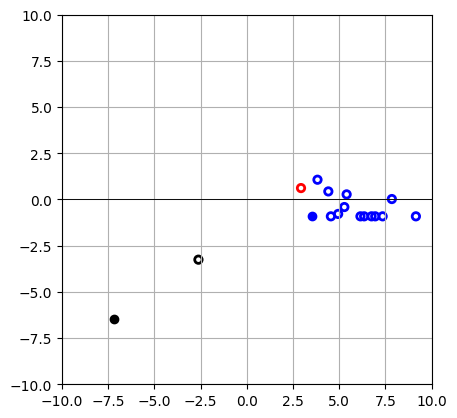

ACTION: [0.5867874 0.       ]


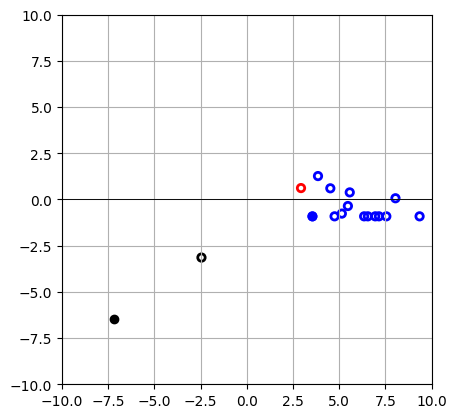

ACTION: [0.         0.43139863]


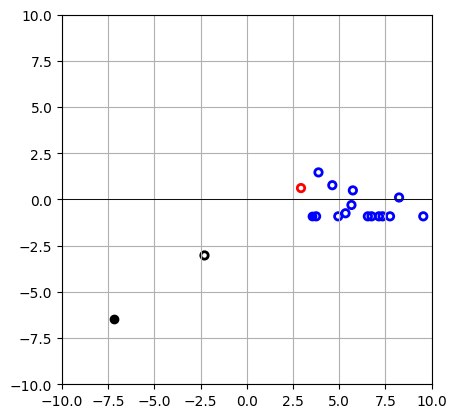

ACTION: [0.        0.5483189]


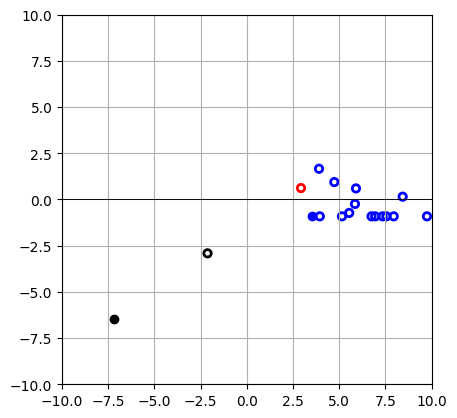

ACTION: [0.07973556 0.        ]


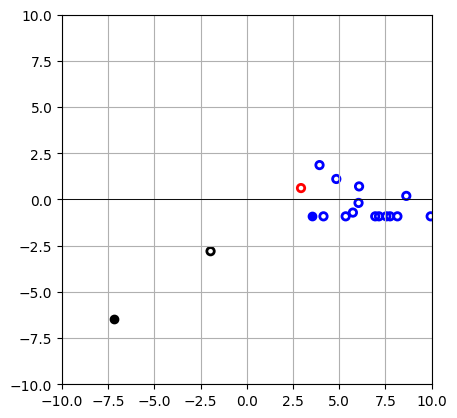

ACTION: [0.16617562 0.        ]


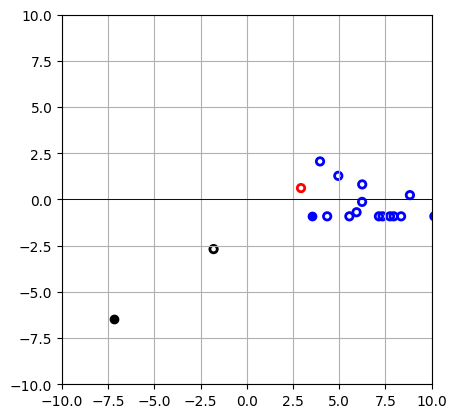

ACTION: [1. 0.]


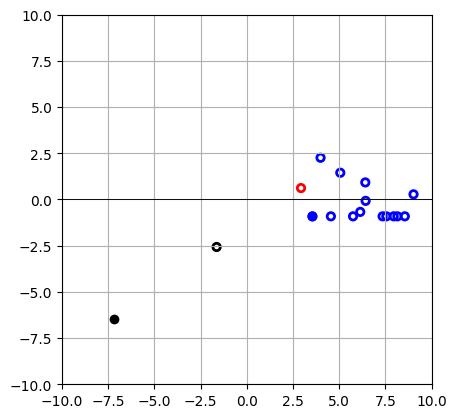

ACTION: [1. 0.]


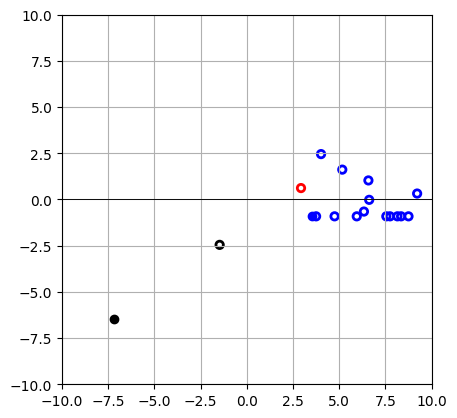

ACTION: [0. 0.]


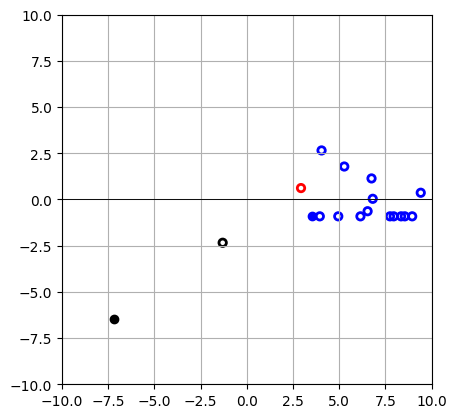

ACTION: [1.        0.6495597]


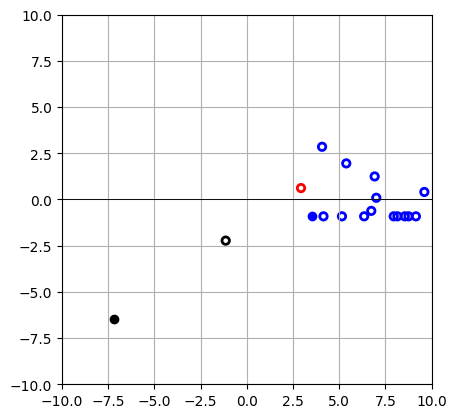

ACTION: [0. 0.]


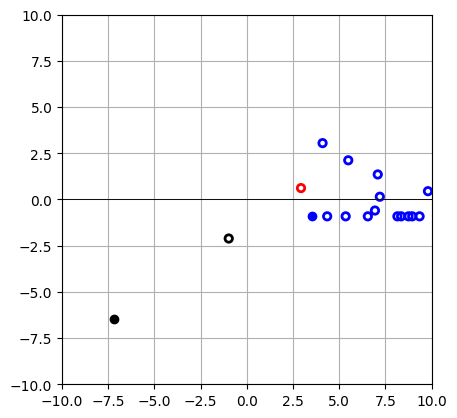

ACTION: [1. 0.]


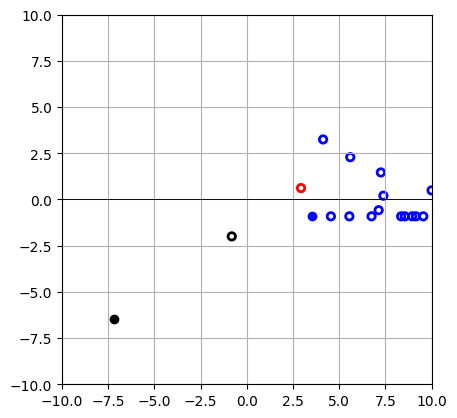

ACTION: [0.        2.2012525]


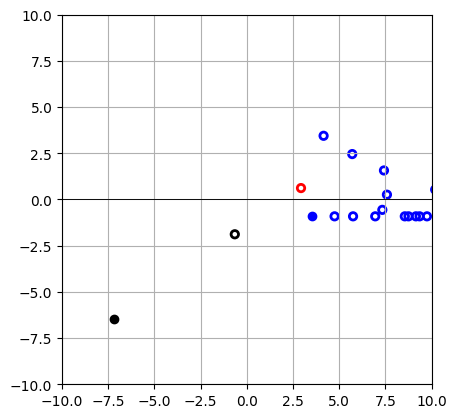

ACTION: [0.4773272 0.       ]


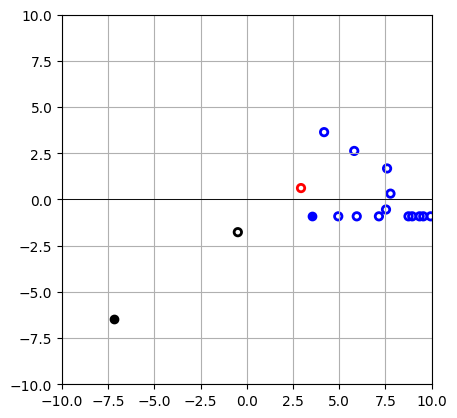

ACTION: [0.39452475 0.49642462]


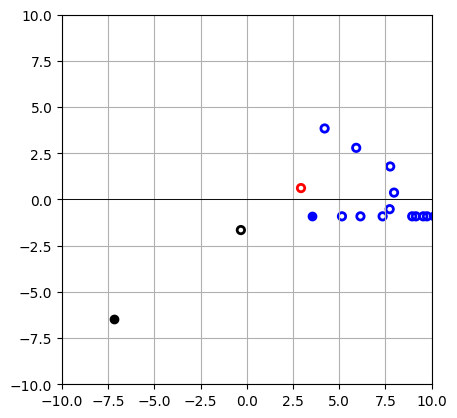

ACTION: [0. 0.]


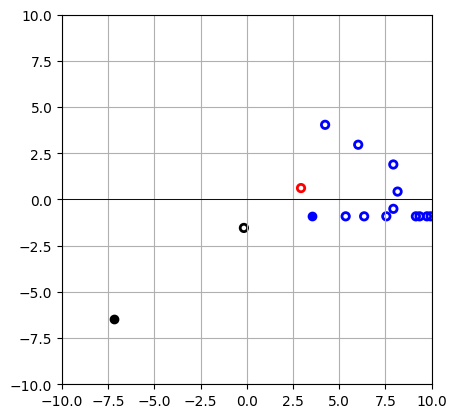

ACTION: [0.2296595  0.32394367]


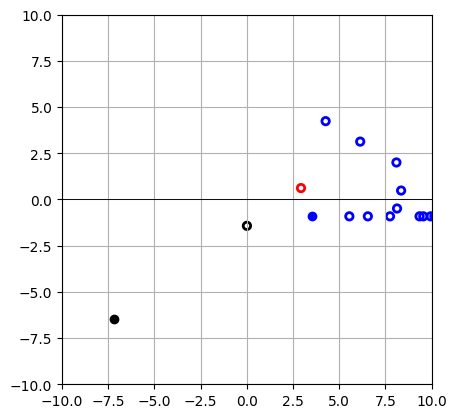

ACTION: [0.        0.6407465]


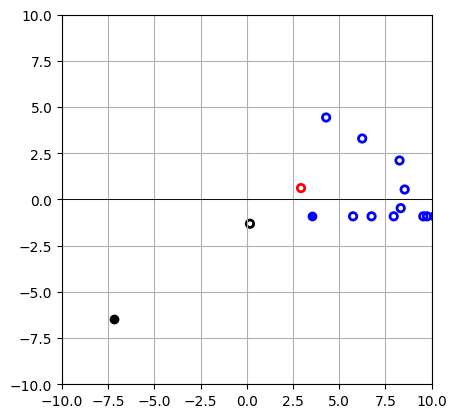

ACTION: [0.23967995 1.3848141 ]


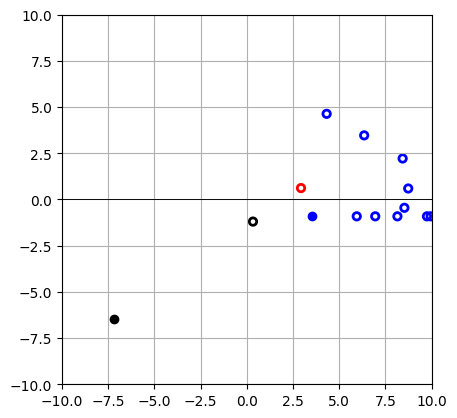

ACTION: [0.96707964 0.        ]


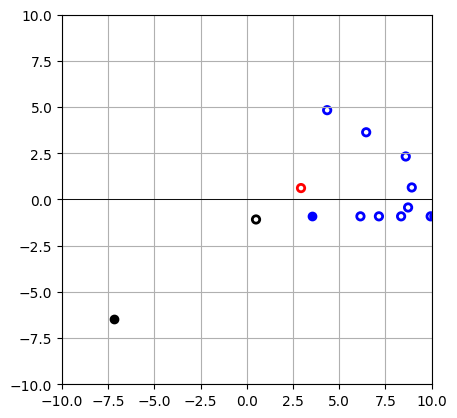

ACTION: [0.5605926 0.6885908]


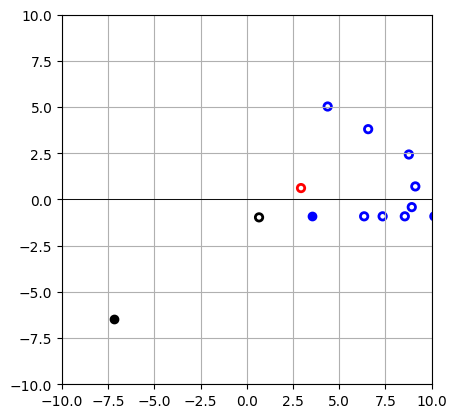

ACTION: [1. 0.]


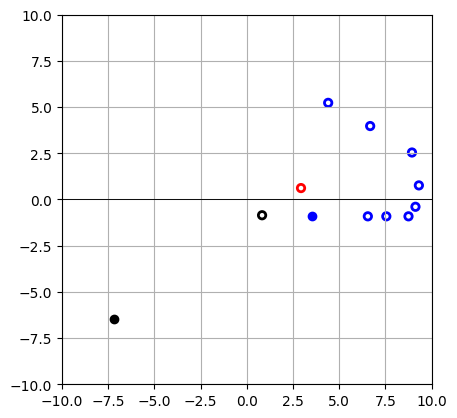

ACTION: [0.        1.1823984]


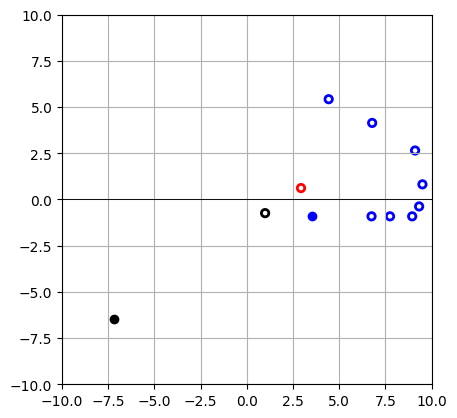

ACTION: [1.        0.2170813]


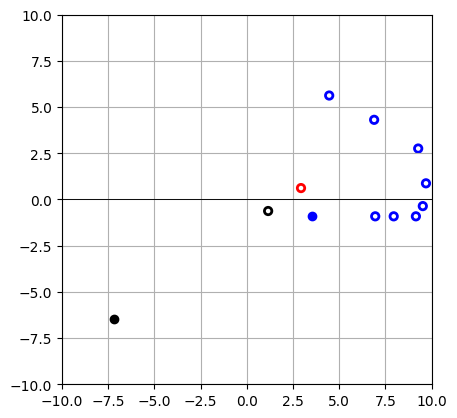

ACTION: [0.21258758 1.2937902 ]


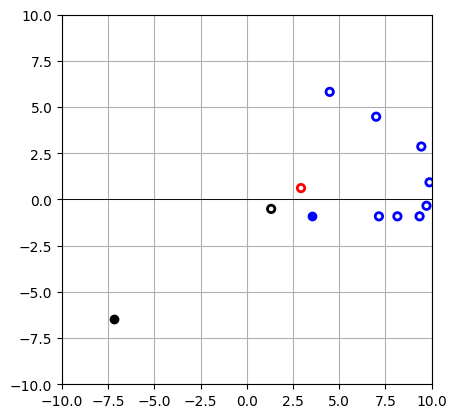

ACTION: [0.        1.2598042]


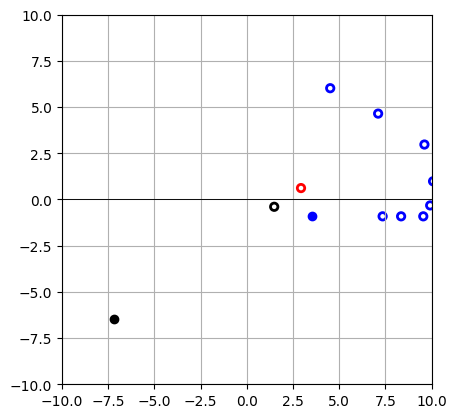

ACTION: [0.9928586 1.6877223]


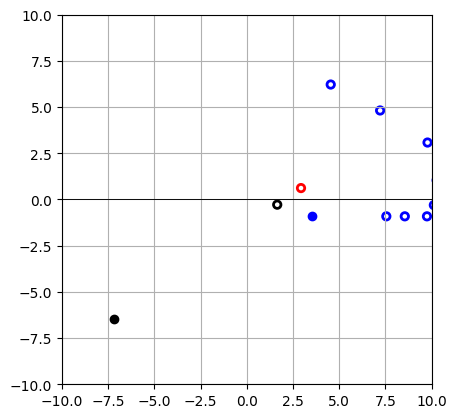

ACTION: [0.58306456 0.        ]


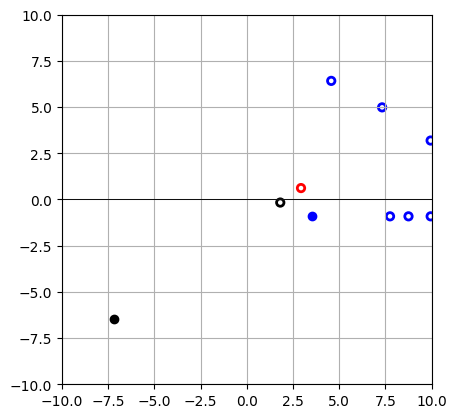

ACTION: [0.4685992 0.       ]


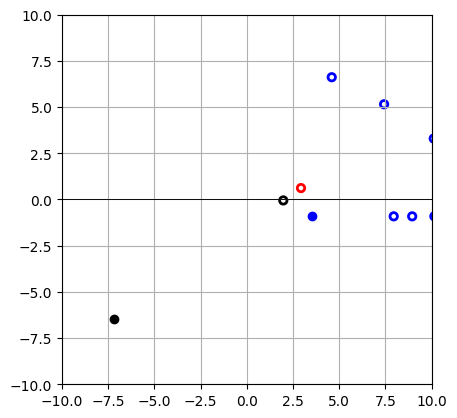

ACTION: [0.9948608 0.3931309]


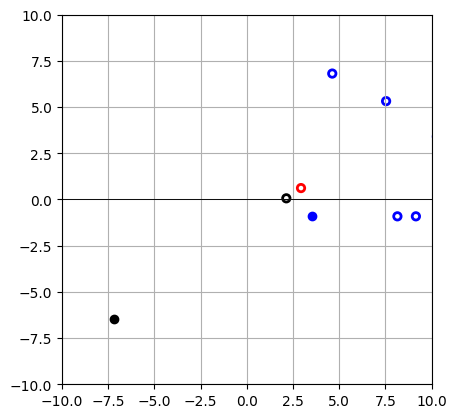

ACTION: [0. 0.]


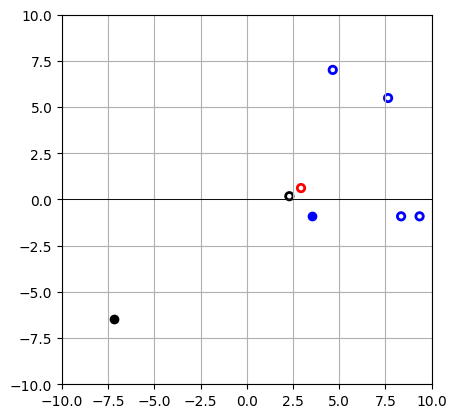

ACTION: [1.         0.02512092]


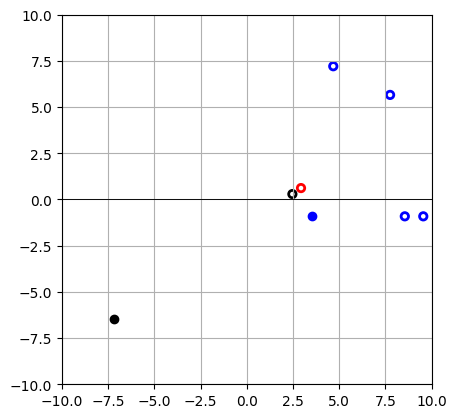

ACTION: [0. 0.]


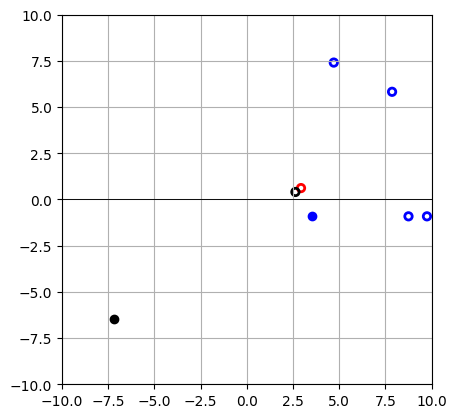

ACTION: [1. 0.]


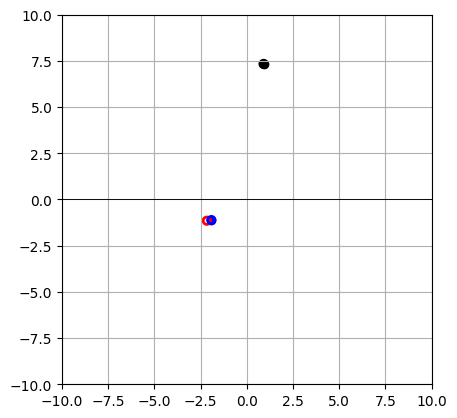

ACTION: [0.       2.862516]


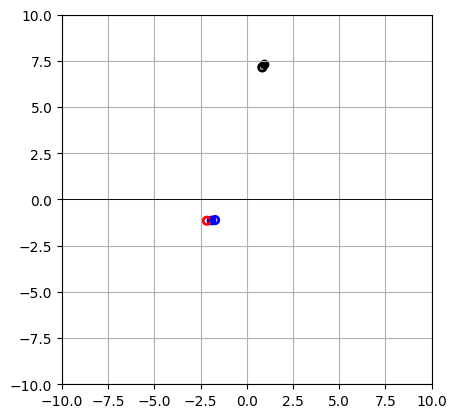

ACTION: [0.34143502 0.11063282]


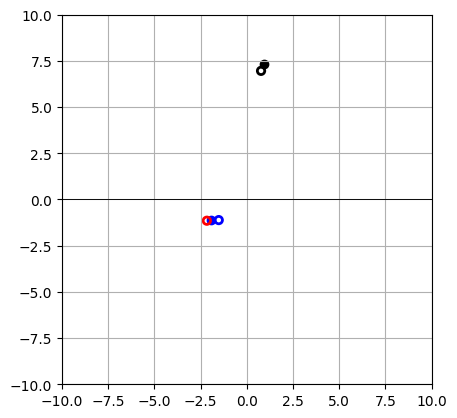

ACTION: [1.        0.5368687]


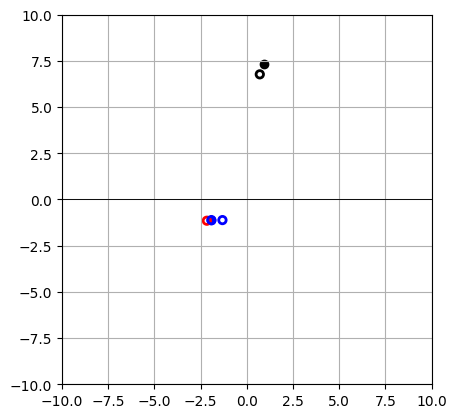

ACTION: [1. 0.]


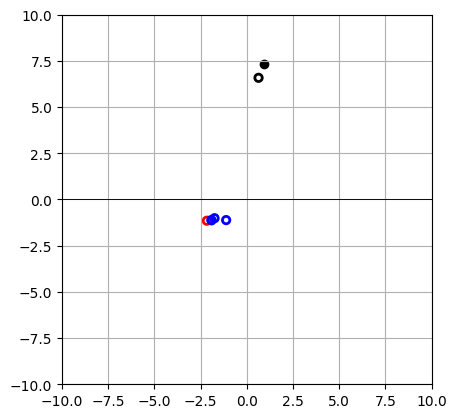

ACTION: [0. 0.]


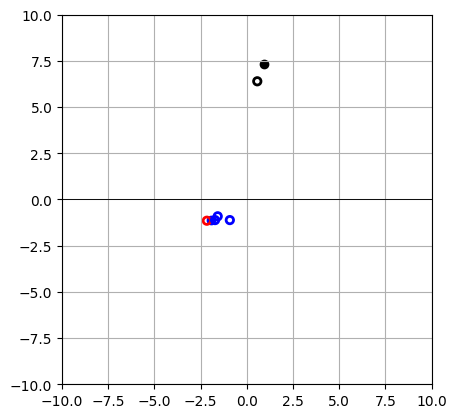

ACTION: [0.        1.3728435]


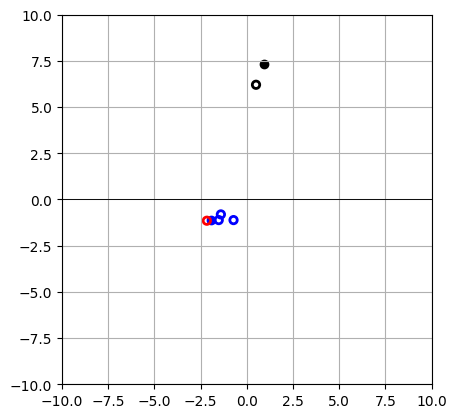

ACTION: [0.       0.335439]


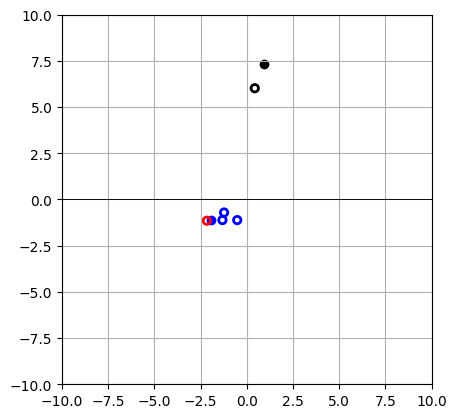

ACTION: [0.10216963 0.        ]


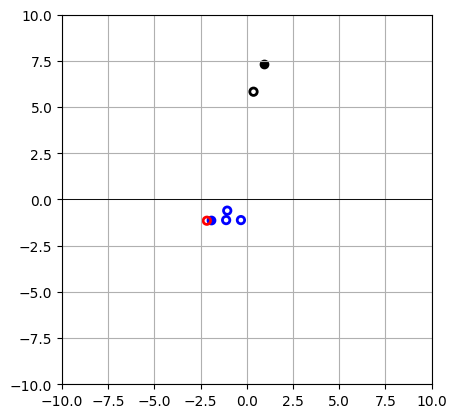

ACTION: [0.19720052 0.90270334]


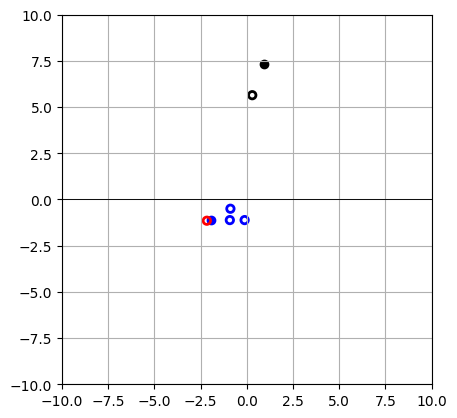

ACTION: [0. 0.]


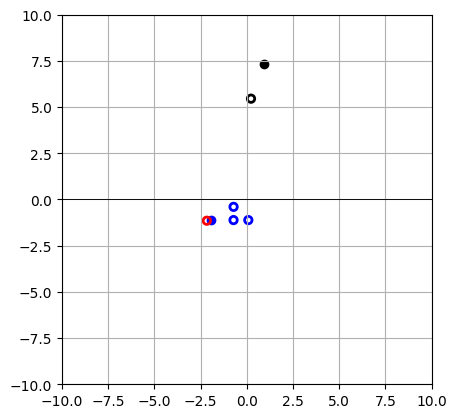

ACTION: [0.         0.26256728]


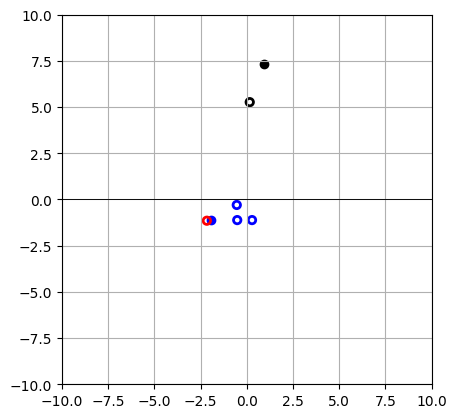

ACTION: [0.         0.77272755]


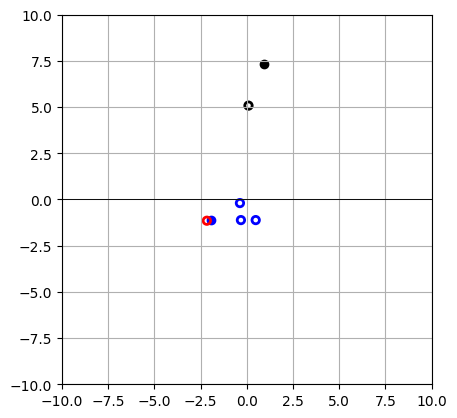

ACTION: [0.        1.8585203]


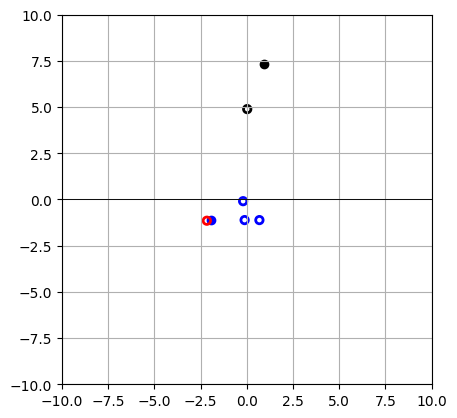

ACTION: [0.         0.07383648]


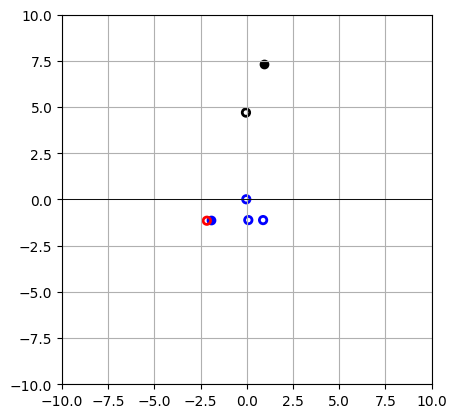

ACTION: [0.58406585 0.25836453]


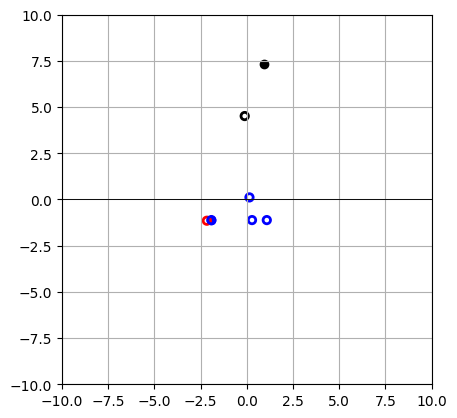

ACTION: [0. 0.]


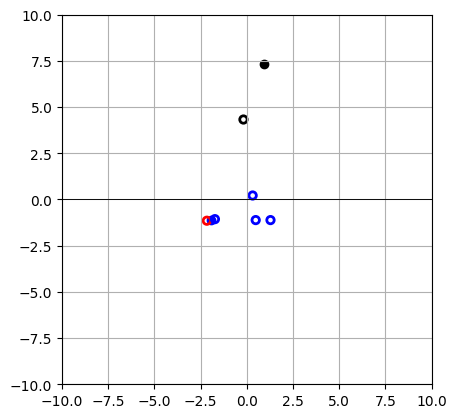

ACTION: [1.         0.97579294]


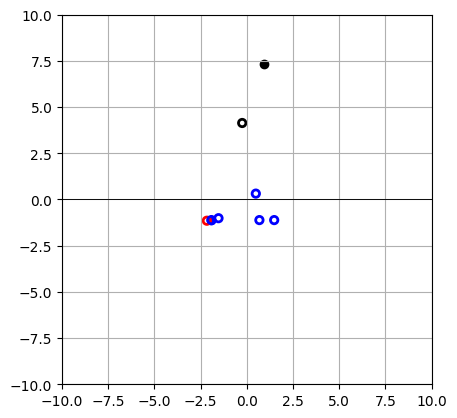

ACTION: [0.48182052 0.        ]


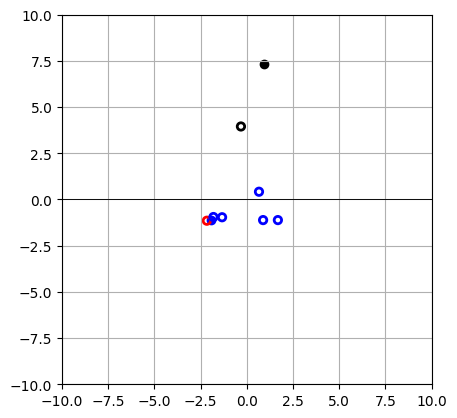

ACTION: [1. 0.]


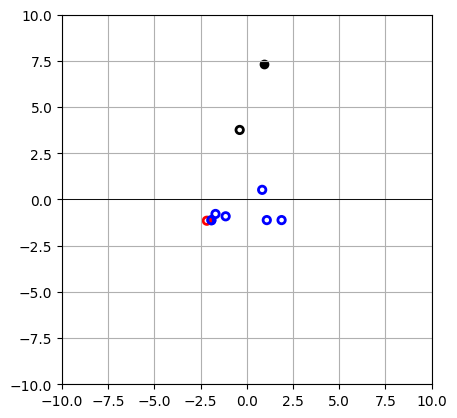

ACTION: [0.35285276 1.0287194 ]


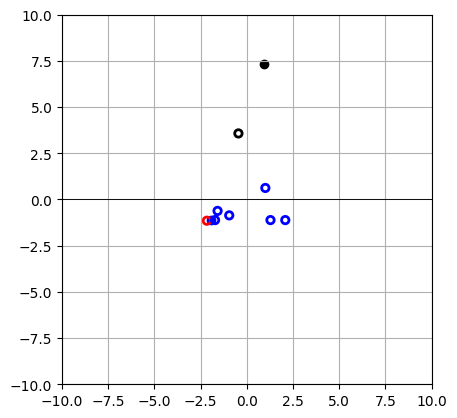

ACTION: [0. 0.]


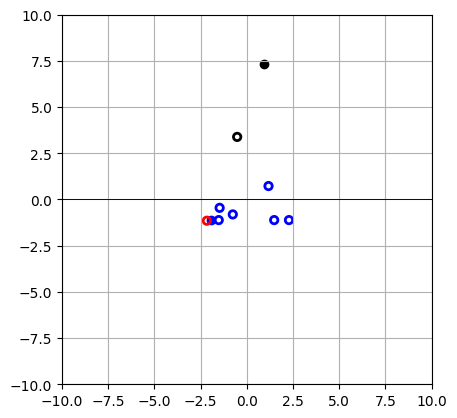

ACTION: [0. 0.]


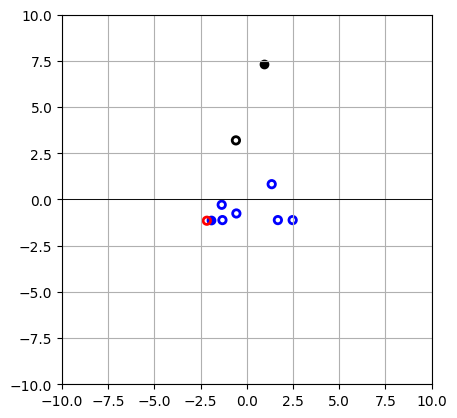

ACTION: [0.86676663 0.        ]


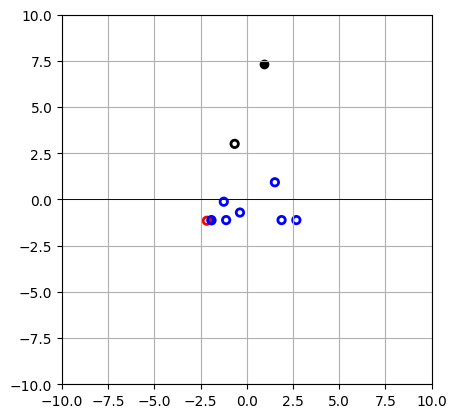

ACTION: [0.37250078 0.        ]


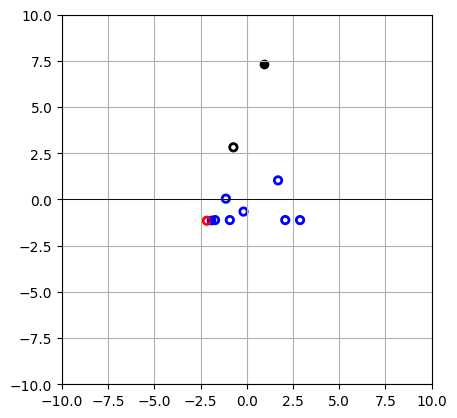

ACTION: [0. 0.]


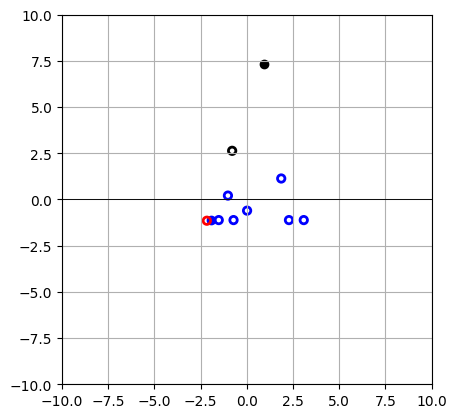

ACTION: [1. 0.]


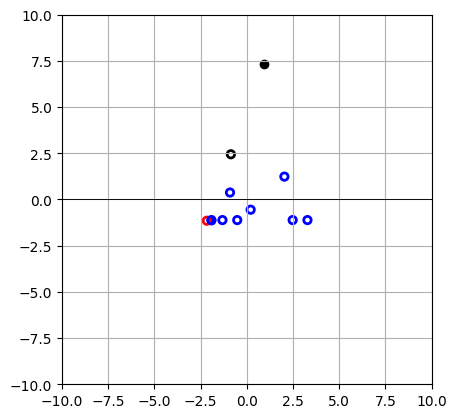

ACTION: [1. 0.]


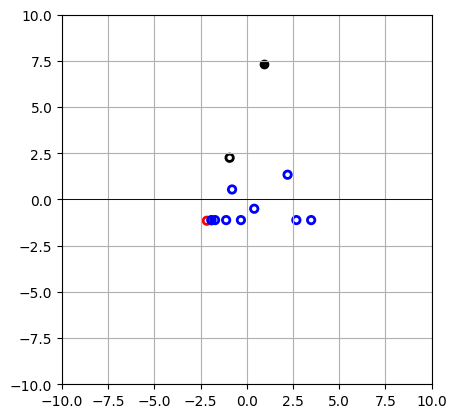

ACTION: [0. 0.]


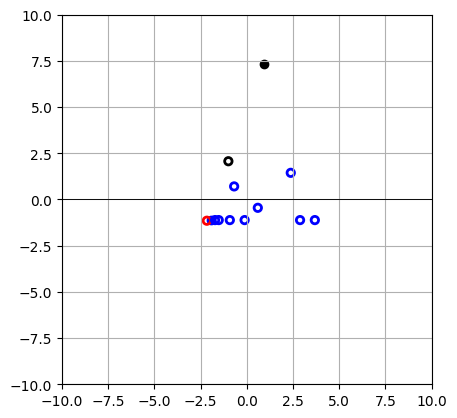

In [35]:
from stable_baselines3 import PPO
from stable_baselines3.common.env_util import make_vec_env

env = make_vec_env(lambda: Environment(), n_envs=1)
model = PPO("MlpPolicy", env, verbose=1)
model.learn(total_timesteps=10000)
model.save("ppo_missile_defense")